# Cross species mapping - Endocrine, alpha and beta cells

In [2]:
import numpy as np
import matplotlib.pyplot as pl
import scanpy as sc
import pandas as pd
import seaborn as sns
import xlsxwriter
from matplotlib import rcParams
import gseapy as gp
import itertools
from scipy.stats.stats import pearsonr, spearmanr

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
sc.settings.verbosity = 3
sc.logging.print_header()

scanpy==1.6.0 anndata==0.7.8 umap==0.4.1 numpy==1.21.2 scipy==1.5.4 pandas==1.3.5 scikit-learn==0.22 statsmodels==0.13.2 python-igraph==0.8.0 louvain==0.7.0 leidenalg==0.7.0


## Endocrine cells

### Load data

In [4]:
human = sc.read('../data/adata_human_endo.h5ad')
pig = sc.read('../data/adata_pig_endo.h5ad')
mouse = sc.read('../data/mouse_all.h5ad')

In [ ]:
conv = pd.read_csv('./BED_mapping_genes.csv')

In [23]:
conv

,Unnamed: 0,pig_ens,human_ens,mouse_symbol,pig_symbol,pig_mean,human_symbol,human_mean,mouse_mean
0,0,ENSSSCG00000018065,ENSG00000198888,mt-Nd1,ND1,1.713922,MT-ND1,4.329835,3.859940
1,1,ENSSSCG00000018069,ENSG00000198763,mt-Nd2,ND2,1.489010,MT-ND2,4.759167,3.184796
2,2,ENSSSCG00000018075,ENSG00000198804,mt-Co1,COX1,4.302451,MT-CO1,5.027821,4.381054
3,3,ENSSSCG00000018078,ENSG00000198712,mt-Co2,COX2,4.226625,MT-CO2,4.755474,4.115138
4,4,ENSSSCG00000018080,ENSG00000228253,mt-Atp8,ATP8,0.003994,MT-ATP8,0.111033,0.274089
...,...,...,...,...,...,...,...,...,...
12089,12089,ENSSSCG00000006893,ENSG00000137936,Bcar3,BCAR3,0.007951,BCAR3,0.059023,0.003854
12090,12090,ENSSSCG00000004300,ENSG00000111850,Smim8,SMIM8,0.068192,SMIM8,0.150541,0.239524
12091,12091,ENSSSCG00000004027,ENSG00000112541,Pde10a,PDE10A,0.002703,PDE10A,0.020026,0.566537
12092,12092,ENSSSCG00000016629,ENSG00000004866,St7,ST7,0.053978,ST7,0.109374,0.042823


In [6]:
conv = conv.loc[[gene in human.var_names for gene in conv['human_symbol']]]
conv = conv.loc[[gene in pig.var_names for gene in conv['pig_symbol']]]
conv = conv.loc[[gene in mouse.var_names for gene in conv['mouse_symbol']]]

### Explained variance by mappable genes

In [20]:
df_var = pd.DataFrame(index=['all cells', 'alpha', 'beta', 'delta', 'PP'], columns=['human', 'pig', 'mouse'])

In [21]:
# human
df = np.var(human.to_df(), axis=0)
var_tot = df.sum()
var_sub = df.loc[conv['human_symbol'].tolist()].sum()
print(f'explained variance human - all cells: {var_sub/var_tot}')
df_var.loc['all cells', 'human'] = var_sub/var_tot

for group in human.obs.louvain_anno_broad.cat.categories:
    df = np.var(human[human.obs.louvain_anno_broad.isin([group])].copy().to_df(), axis=0)
    var_tot = df.sum()
    var_sub = df.loc[conv['human_symbol'].tolist()].sum()
    print(f'explained variance human - {group} cells: {var_sub/var_tot}')
    df_var.loc[group, 'human'] = var_sub/var_tot


explained variance human - all cells: 0.8690779805183411
explained variance human - alpha cells: 0.8735045790672302
explained variance human - beta cells: 0.8652795553207397
explained variance human - delta cells: 0.8672295808792114
explained variance human - PP cells: 0.8558482527732849


In [22]:
# pig
df = np.var(pig.to_df(), axis=0)
var_tot = df.sum()
var_sub = df.loc[conv['pig_symbol'].tolist()].sum()
print(f'explained variance pig: {var_sub/var_tot}')
df_var.loc['all cells', 'pig'] = var_sub/var_tot

for group in pig.obs.louvain_anno_broad.cat.categories:
    df = np.var(pig[pig.obs.louvain_anno_broad.isin([group])].copy().to_df(), axis=0)
    var_tot = df.sum()
    var_sub = df.loc[conv['pig_symbol'].tolist()].sum()
    print(f'explained variance pig - {group} cells: {var_sub/var_tot}')
    df_var.loc[group, 'pig'] = var_sub/var_tot

explained variance pig: 0.9413137435913086
explained variance pig - alpha cells: 0.939766526222229
explained variance pig - beta cells: 0.942504346370697
explained variance pig - delta cells: 0.9400315284729004
explained variance pig - PP cells: 0.9409292936325073


In [24]:
# mouse
df = np.var(mouse.to_df(), axis=0)
var_tot = df.sum()
var_sub = df.loc[conv['mouse_symbol'].tolist()].sum()
print(f'explained variance mouse: {var_sub/var_tot}')
df_var.loc['all cells', 'mouse'] = var_sub/var_tot


for group in mouse.obs.louvain_anno_broad.cat.categories:
    df = np.var(mouse[mouse.obs.louvain_anno_broad.isin([group])].copy().to_df(), axis=0)
    var_tot = df.sum()
    var_sub = df.loc[conv['mouse_symbol'].tolist()].sum()
    print(f'explained variance mouse - {group} cells: {var_sub/var_tot}')
    df_var.loc[group, 'mouse'] = var_sub/var_tot


explained variance mouse: 0.8877675533294678
explained variance mouse - alpha cells: 0.8893857002258301
explained variance mouse - beta cells: 0.8887761831283569
explained variance mouse - delta cells: 0.8880693912506104
explained variance mouse - PP cells: 0.8885635137557983


In [25]:
df_var

,human,pig,mouse
all cells,0.869078,0.941314,0.887768
alpha,0.873505,0.939767,0.889386
beta,0.86528,0.942504,0.888776
delta,0.86723,0.940032,0.888069
PP,0.855848,0.940929,0.888564


In [26]:
df_var.mean(axis=1)

all cells    0.899386
alpha        0.900886
beta         0.898853
delta        0.898444
PP           0.895114
dtype: float64

### Subset data to mappable genes

In [8]:
human_comb_endo = human[:,conv['human_symbol'].tolist()].copy()

In [9]:
human_comb_endo.var_names

Index(['MT-ND1', 'MT-ND2', 'MT-CO1', 'MT-CO2', 'MT-ATP8', 'MT-ATP6', 'MT-CO3',
       'MT-ND3', 'MT-ND4L', 'MT-ND4',
       ...
       'BACH1', 'FAM83H-AS1', 'FAM53C', 'GTPBP10', 'SUMF1', 'BCAR3', 'SMIM8',
       'PDE10A', 'ST7', 'AHSA2'],
      dtype='object', name='index', length=11665)

In [10]:
pig_comb_endo = pig[:,conv['pig_symbol'].tolist()].copy()
pig_comb_endo.var_names

Index(['ND1', 'ND2', 'COX1', 'COX2', 'ATP8', 'ATP6', 'COX3', 'ND3', 'ND4L',
       'ND4',
       ...
       'BACH1', 'IQANK1', 'FAM53C', 'ENSSSCG00000015305', 'SUMF1', 'BCAR3',
       'SMIM8', 'PDE10A', 'ST7', 'ENSSSCG00000008383'],
      dtype='object', name='index', length=11665)

In [11]:
mouse_comb_endo = mouse[:,conv['mouse_symbol'].tolist()].copy()
mouse_comb_endo.var_names

Index(['mt-Nd1', 'mt-Nd2', 'mt-Co1', 'mt-Co2', 'mt-Atp8', 'mt-Atp6', 'mt-Co3',
       'mt-Nd3', 'mt-Nd4l', 'mt-Nd4',
       ...
       'Bach1', 'K230010J24Rik', 'Fam53c', 'Gtpbp10', 'Sumf1', 'Bcar3',
       'Smim8', 'Pde10a', 'St7', 'Ahsa2'],
      dtype='object', name='index', length=11665)

In [12]:
pig_comb_endo.var_names = human_comb_endo.var_names
mouse_comb_endo.var_names = human_comb_endo.var_names

In [13]:
print(f'# mappable genes: {len(human_comb_endo.var_names)}')

# mappable genes: 11665


### Conservation of endocrine gene expression

In [14]:
def venn_markers(human, pig, mouse=None, labels = ['human', 'pig', 'mouse'], return_dict=False):
    
    pl.figure(figsize=(4,4))
    if mouse is not None:
        from matplotlib_venn import venn3, venn3_circles
        h = len(set(human).difference(mouse, pig))
        p = len(set(pig).difference(mouse, human))
        h_p = len(set(human).intersection(pig).difference(mouse))
        m = len(set(mouse).difference(pig, human))
        h_m = len(set(human).intersection(mouse).difference(pig))
        p_m = len(set(pig).intersection(mouse).difference(human))
        h_p_m = len(set(human).intersection(pig).intersection(mouse))
        v = venn3(subsets = (h, p, h_p, m, h_m, p_m, h_p_m), set_labels = (labels), alpha = 0.8)
        col_dict={'100':['#a1d99b'],
            '001':['#fc9272'],
            '010':['#d1e5f0'],
            '110':['#99d8c9'],
            '101':['#fdae6b'],
            '011':['#bcbddc'],
            '111':['#9e9ac8']}
        for ix in ['100', '001', '010', '110', '101', '011', '111']:
            if v.get_patch_by_id(ix) is None:
                pass
            else:
                v.get_patch_by_id(ix).set_color(col_dict[ix][0])
            
        pl.show()
        if return_dict: 
            marker_dict = {}
            marker_dict['h'] = set(human).difference(mouse, pig)
            marker_dict['p']= set(pig).difference(mouse, human)
            marker_dict['h_p'] = set(human).intersection(pig).difference(mouse)
            marker_dict['m'] = set(mouse).difference(pig, human)
            marker_dict['h_m'] = set(human).intersection(mouse).difference(pig)
            marker_dict['p_m'] = set(pig).intersection(mouse).difference(human)
            marker_dict['h_p_m'] = set(human).intersection(pig).intersection(mouse)
            return marker_dict
            
        
    else:
        from matplotlib_venn import venn2, venn2_circles
        h = len(set(human).difference(pig))
        p = len(set(pig).difference(human))
        h_p = len(set(human).intersection(pig))
        venn2(subsets = (h, p, h_p), set_labels = (labels[0:2]), alpha = 0.5)
        pl.show()
        if return_dict: 
            marker_dict = {}
            marker_dict['h'] = set(human).difference(pig)
            marker_dict['p']= set(pig).difference(human)
            marker_dict['h_p'] = set(human).intersection(pig)
            return marker_dict

In [15]:
expression_dict={}

for key in human_comb_endo.obs.louvain_anno_broad.cat.categories:
    df = pd.DataFrame(index=human_comb_endo.var_names, columns=['human', 'pig', 'mouse'])
    
    human_sub = human_comb_endo[human_comb_endo.obs.louvain_anno_broad.isin([key])].copy()
    genes = (human_sub.X > 0).sum(0) / human_sub.n_obs
    df['human'] = genes.A1
    
    pig_sub = pig_comb_endo[pig_comb_endo.obs.louvain_anno_broad.isin([key])].copy()
    genes = (pig_sub.X > 0).sum(0) / pig_sub.n_obs
    df['pig'] = genes.A1
    
    mouse_sub = mouse_comb_endo[mouse_comb_endo.obs.louvain_anno_broad.isin([key])].copy()
    genes = (mouse_sub.X > 0).sum(0) / mouse_sub.n_obs
    df['mouse'] = genes.A1
    
    expression_dict[key] = df

In [16]:
expression_dict_species={}

df = pd.DataFrame(index=human_comb_endo.var_names, columns=human_comb_endo.obs.louvain_anno_broad.cat.categories)
for key in human_comb_endo.obs.louvain_anno_broad.cat.categories:
    human_sub = human_comb_endo[human_comb_endo.obs.louvain_anno_broad.isin([key])].copy()
    genes = (human_sub.X > 0).sum(0) / human_sub.n_obs
    df[key] = genes.A1
expression_dict_species['human'] = df

df = pd.DataFrame(index=pig_comb_endo.var_names, columns=pig_comb_endo.obs.louvain_anno_broad.cat.categories)
for key in pig_comb_endo.obs.louvain_anno_broad.cat.categories:
    pig_sub = pig_comb_endo[pig_comb_endo.obs.louvain_anno_broad.isin([key])].copy()
    genes = (pig_sub.X > 0).sum(0) / pig_sub.n_obs
    df[key] = genes.A1
expression_dict_species['pig'] = df 

df = pd.DataFrame(index=mouse_comb_endo.var_names, columns=mouse_comb_endo.obs.louvain_anno_broad.cat.categories)
for key in mouse_comb_endo.obs.louvain_anno_broad.cat.categories:
    mouse_sub = mouse_comb_endo[mouse_comb_endo.obs.louvain_anno_broad.isin([key])].copy()
    genes = (mouse_sub.X > 0).sum(0) / mouse_sub.n_obs
    df[key] = genes.A1
expression_dict_species['mouse'] = df

In [22]:
detection_dict = {}
conservation_dict = {}

for key in ['alpha','beta', 'delta', 'PP']:

    refs = list(human_comb_endo.obs.louvain_anno_broad.cat.categories)
    refs.remove(key)
    df = pd.DataFrame(index=human_comb_endo.var_names, columns=['human', 'mouse', 'pig'])  
    
    detected_key = expression_dict_species['human']>0.05
    detected_key = detected_key.index[detected_key[key]].tolist()
    
    detected_other = expression_dict_species['human']>0.05
    detected_other = detected_other.index[detected_other[refs].any(axis=1)].tolist()
    
    df['human'] = ['exp' if gene in detected_key else
                   'other' if gene in detected_other else
                   'not detected' for gene in human_comb_endo.var_names]
                           
    detected_key = expression_dict_species['pig']>0.05
    detected_key = detected_key.index[detected_key[key]].tolist()
    
    detected_other = expression_dict_species['pig']>0.05
    detected_other = detected_other.index[detected_other[refs].any(axis=1)].tolist()
    
    df['pig'] = ['exp' if gene in detected_key else
                 'other' if gene in detected_other else
                 'not detected' for gene in human_comb_endo.var_names]
    
    detected_key = expression_dict_species['mouse']>0.05
    detected_key = detected_key.index[detected_key[key]].tolist()
    
    detected_other = expression_dict_species['mouse']>0.05
    detected_other = detected_other.index[detected_other[refs].any(axis=1)].tolist()
    
    df['mouse'] = ['exp' if gene in detected_key else
                   'other' if gene in detected_other else
                   'not detected' for gene in human_comb_endo.var_names]
    
    detection_dict[key] = df
    
    df_conservation = pd.DataFrame(index=human_comb_endo.var_names, columns=['pig', 'mouse']) 
    
    df_conservation['pig'] = ['conserved' if (h=='exp') & (p=='exp') else
                              'gain' if (h in ['not detected', 'other']) & (p in ['exp']) else
                              'loss' if (h in ['exp']) & (p in ['not detected', 'other']) else 
                              'not detected' for h,p in zip(df['human'], df['pig'])]
    
    df_conservation['mouse'] = ['conserved' if (h=='exp') & (p=='exp') else
                              'gain' if (h in ['not detected', 'other']) & (p in ['exp']) else
                              'loss' if (h in ['exp']) & (p in ['not detected', 'other']) else 
                              'not detected' for h,p in zip(df['human'], df['mouse'])]
    
    conservation_dict[key] = df_conservation

#### Supplementary Table 1

In [27]:
expression_dict['alpha'].head()

,human,pig,mouse
index,,,
MT-ND1,0.998787,0.942225,1.000000
MT-ND2,0.999567,0.893089,0.998726
MT-CO1,0.999653,0.996760,1.000000
MT-CO2,0.999567,0.996760,1.000000
MT-ATP8,0.063166,0.004860,0.203822


In [28]:
detection_dict['alpha'].head()

,human,mouse,pig
index,,,
MT-ND1,exp,exp,exp
MT-ND2,exp,exp,exp
MT-CO1,exp,exp,exp
MT-CO2,exp,exp,exp
MT-ATP8,exp,exp,not detected


In [29]:
conservation_dict['alpha'].head()

,pig,mouse
index,,
MT-ND1,conserved,conserved
MT-ND2,conserved,conserved
MT-CO1,conserved,conserved
MT-CO2,conserved,conserved
MT-ATP8,loss,conserved


In [47]:
writer = pd.ExcelWriter('./Supplementary_table_1.xlsx')

for key in ['alpha', 'beta', 'delta', 'PP']:
    df = pd.DataFrame(
        columns = [
            'human_expressed', 'pig_expressed', 'mouse_expressed', 
            'human_detected', 'pig_detected', 'mouse_detected', 
            'pig_conserved', 'mouse_conserved'
        ], index=expression_dict[key].index
    )
    df.loc[expression_dict[key].index, ['human_expressed', 'pig_expressed', 'mouse_expressed']] = expression_dict[key][['human', 'pig', 'mouse']].values
    df.loc[detection_dict[key].index, ['human_detected', 'pig_detected', 'mouse_detected']] = detection_dict[key][['human', 'pig', 'mouse']].values
    df.loc[conservation_dict[key].index, ['pig_conserved', 'mouse_conserved']] = conservation_dict[key][['pig', 'mouse']].values
    df.to_excel(writer, sheet_name=key)

writer.save()

#### Plots

alpha


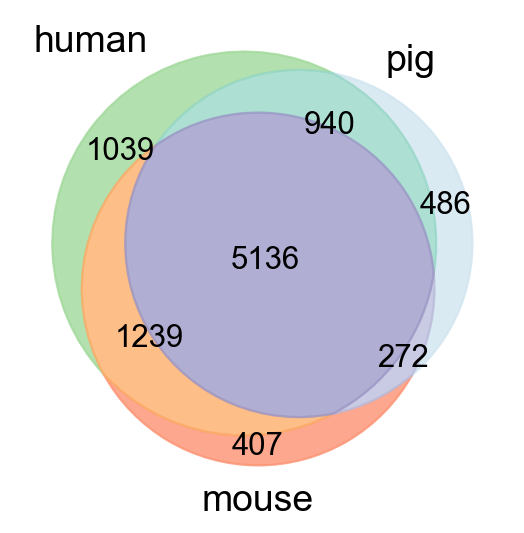

beta


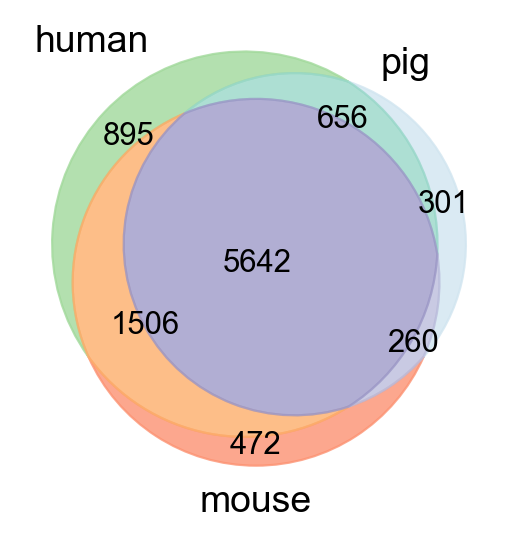

delta


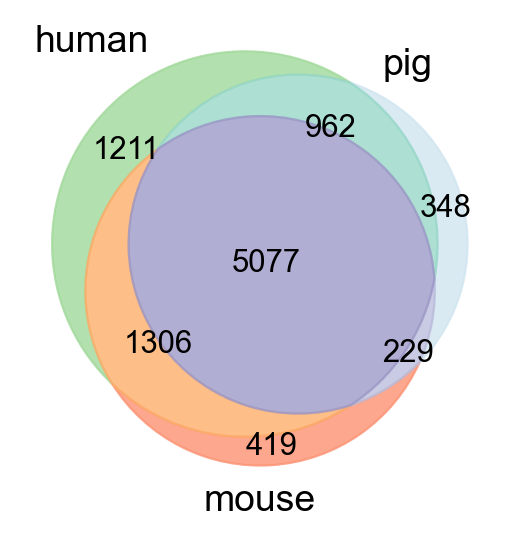

PP


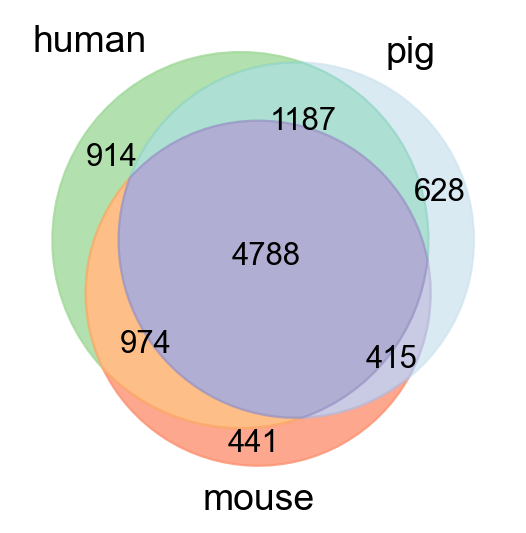

In [31]:
for key in human_comb_endo.obs.louvain_anno_broad.cat.categories:
    print(key)
    mk = venn_markers(expression_dict[key].index[expression_dict[key]['human']>0.05], 
                      expression_dict[key].index[expression_dict[key]['pig']>0.05], 
                      mouse=expression_dict[key].index[expression_dict[key]['mouse']>0.05], 
                      return_dict=True)

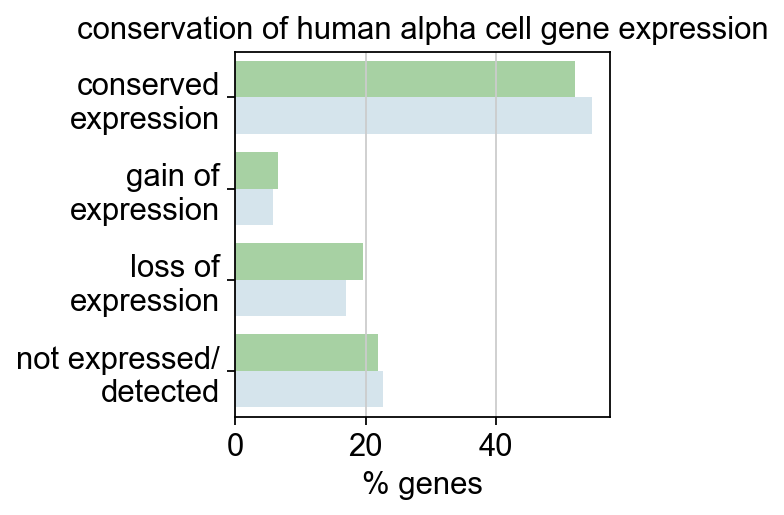

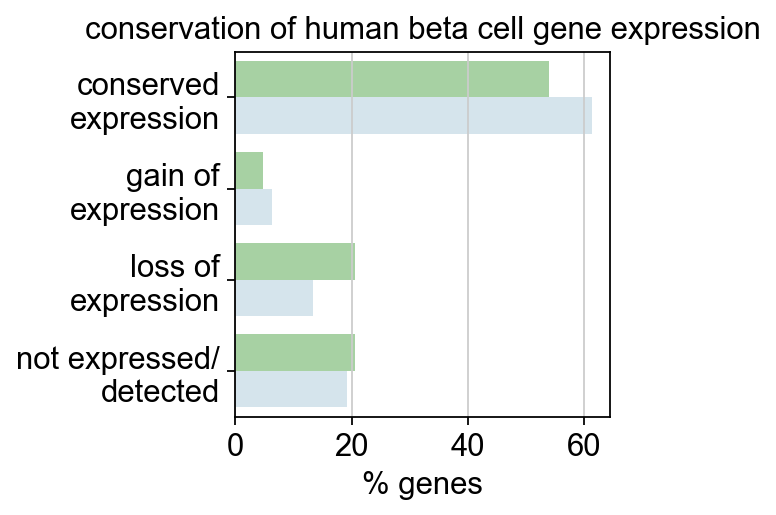

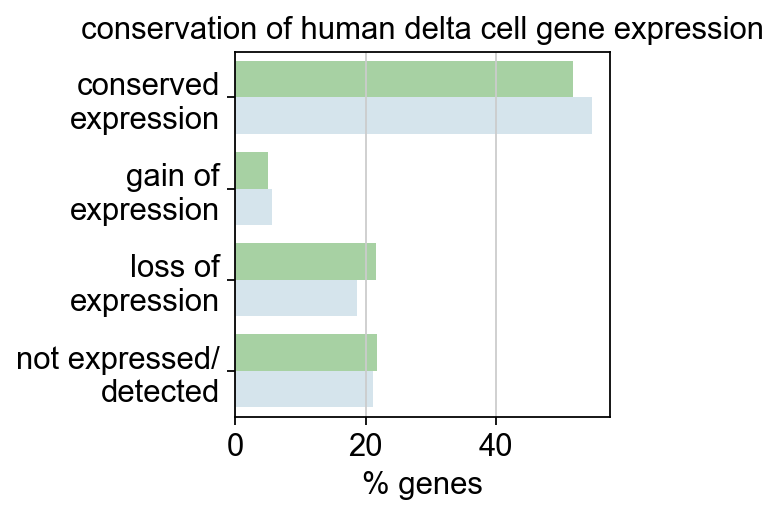

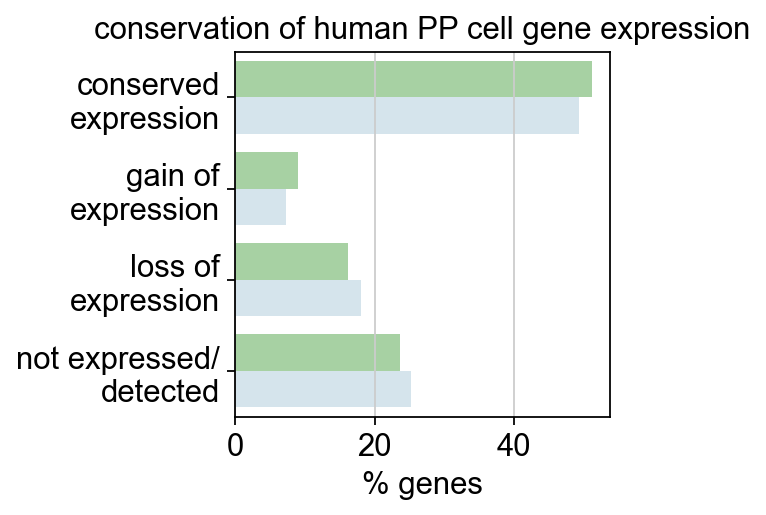

In [33]:
for key in ['alpha','beta', 'delta', 'PP']:
    df_bar = conservation_dict[key].melt()
    f, ax = pl.subplots(figsize=(3, 3))
    y='% genes'
    prop_df = (df_bar['value']
                        .groupby(df_bar['variable'])
                        .value_counts(normalize=True)
                        .rename(y)
                        .reset_index())
    prop_df[y] = prop_df[y]*100

    sns.barplot(x=y, y="value", data=prop_df, hue='variable', order=['conserved', 'gain', 'loss', 'not detected'], hue_order=['pig', 'mouse'], palette=['#a1d99b','#d1e5f0'])
    ax.set_yticklabels(['conserved\nexpression', 'gain of\nexpression', 'loss of\nexpression', 'not expressed/\ndetected'])
    ax.legend().remove()
    pl.ylabel('')
    pl.title(f'conservation of human {key} cell gene expression')

#### comparison to bulkRNA-seq Benner et al.

In [34]:
df = pd.read_excel('./data/12864_2014_6324_MOESM8_ESM.xlsx', skiprows=3)

In [35]:
df['gene name'] = df['gene name'].str.upper()

In [37]:
len(df['gene name'])

9474

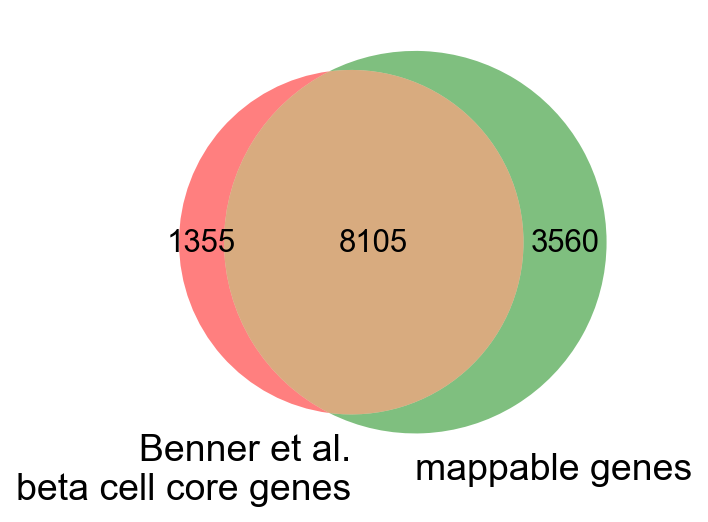

In [38]:
venn_markers(df['gene name'].tolist(),human_comb_endo.var_names,
             labels=['Benner et al.\nbeta cell core genes', 'mappable genes'],
            return_dict=False)

In [39]:
df = df.loc[[gene in human_comb_endo.var_names for gene in df['gene name']]]

In [41]:
print(f'{np.round(100-(8105/9474)*100,2)}% of core gene set not mappable')

14.45% of core gene set not mappable


In [42]:
df_map = pd.DataFrame(index=df['gene name'].tolist(), columns=['type'])

In [43]:
df_map['type'] = [conservation_dict['beta']['mouse'].loc[gene] for gene in df['gene name'].tolist()]

No handles with labels found to put in legend.


Text(0.5, 1.0, 'distribution of core beta cell gene set of Benner et al.')

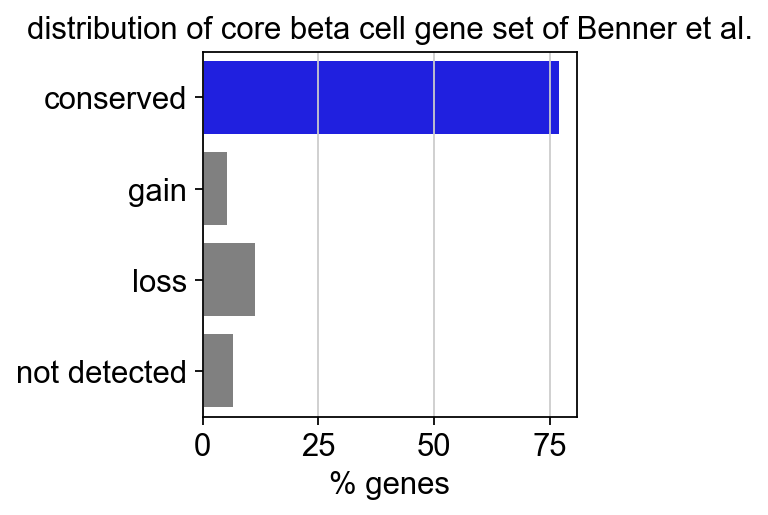

In [44]:
f, ax = pl.subplots(figsize=(3, 3))
y='% genes'
prop_df = (df_map['type'].value_counts(normalize=True).rename(y).reset_index())
prop_df[y] = prop_df[y]*100
sns.barplot(x=y, y="index", data=prop_df, order=['conserved', 'gain', 'loss', 'not detected'], palette=['blue', 'grey', 'grey', 'grey', 'lightgrey'])
#ax.set_yticklabels(['conserved\nexpression', 'gain of\nexpression', 'loss of\nexpression', 'not expressed/\ndetected'])
ax.legend().remove()
pl.ylabel('')
pl.title(f'distribution of core beta cell gene set of Benner et al.')

In [45]:
prop_df

,index,% genes
0,conserved,77.014189
1,loss,11.227637
2,not detected,6.452807
3,gain,5.305367


#### Selected example genes

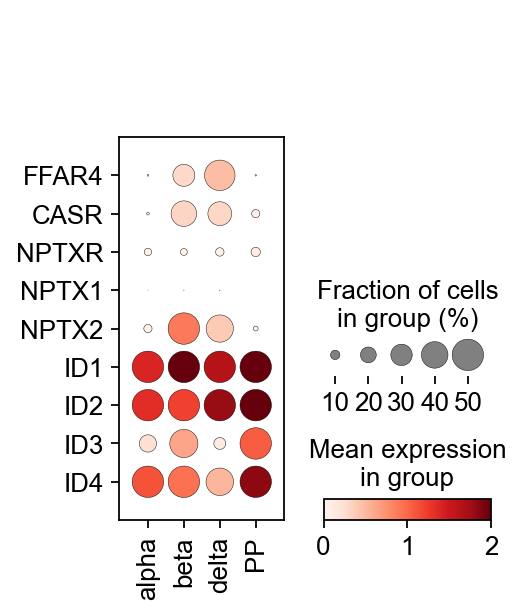

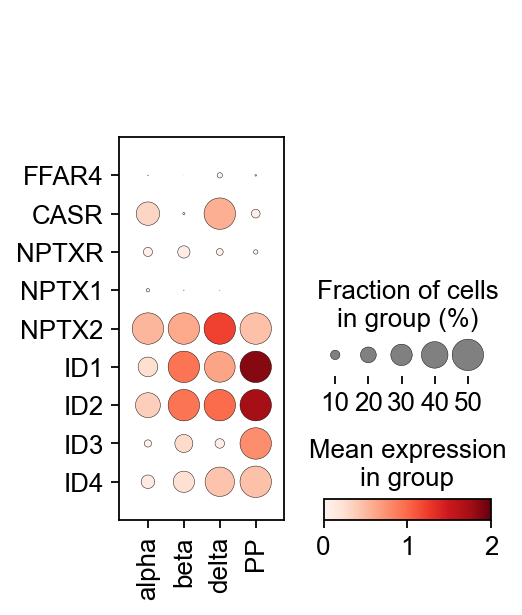

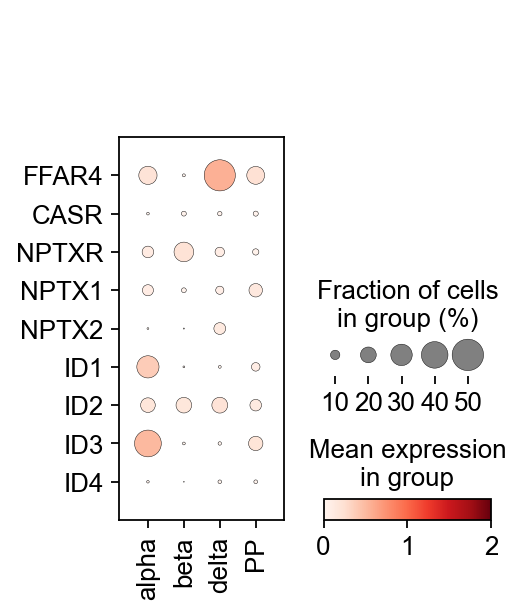

In [144]:
genes = ['FFAR4', 'CASR',  'NPTXR',  'NPTX1', 'NPTX2', 'ID1', 'ID2', 'ID3', 'ID4']
sc.pl.dotplot(human_comb_endo, groupby='louvain_anno_broad', var_names=genes, dot_max=0.5, swap_axes=True, vmin=0, vmax=2)
sc.pl.dotplot(pig_comb_endo, groupby='louvain_anno_broad', var_names=genes, dot_max=0.5, swap_axes=True, vmin=0, vmax=2)
sc.pl.dotplot(mouse_comb_endo, groupby='louvain_anno_broad', var_names=genes, dot_max=0.5, swap_axes=True, vmin=0, vmax=2)

### Conservation of enriched markers

In [48]:
mk_human = pd.read_excel('../human_islets_notebooks/output_files/marker_dict_endo_enriched.xlsx')

In [49]:
mk_pig = pd.read_excel('../pig_islets_notebooks/output_files/marker_dict_endo_enriched.xlsx')

In [50]:
mk_mouse = pd.read_excel('../mouse_islets_notebooks/output_files/marker_dict_endo_enriched.xlsx')

In [51]:
mk_human_map = {}
for col in mk_human.columns:
    mk_human_map[col] = [gene for gene in mk_human[col] if gene in conv.human_symbol.tolist()]

In [52]:
mk_pig_map = {}
for col in mk_pig.columns:
    mk_pig_map[col] = [conv.human_symbol[conv.pig_symbol==gene].values[0] for gene in mk_pig[col] if gene in conv.pig_symbol.tolist()]

In [53]:
mk_mouse_map = {}
for col in mk_mouse.columns:
    mk_mouse_map[col] = [conv.human_symbol[conv.mouse_symbol==gene].values[0] for gene in mk_mouse[col] if gene in conv.mouse_symbol.tolist()]

alpha


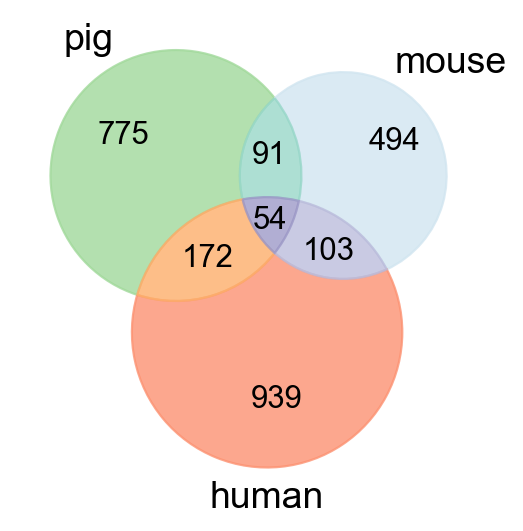

{'CLDN4', 'GRIA3', 'MDK', 'GATA6', 'SLC25A20', 'IRX2', 'SMC4', 'TMSB10', 'PAK6', 'DYNLT1', 'SERPIND1', 'NUCB1', 'KLB', 'SLC7A2', 'PLS3', 'HN1', 'MGAT4B', 'GPR137B', 'ACTG1', 'PDE4D', 'SEMA3E', 'NBEAL2', 'MYO1B', 'MAMLD1', 'KCNJ3', 'GLUD1', 'A1CF', 'C1orf21', 'GNAI1', 'SLC25A33', 'GCG', 'VASP', 'CRYBA2', 'CTSZ', 'IGFBP7', 'PAPPA2', 'ZNRF1', 'EFHD2', 'EFNA1', 'IFIH1', 'POU6F2', 'LMO4', 'BCAM', 'RHOC', 'RAB3C', 'HMGB3', 'GLS', 'GALNS', 'FAM107B', 'PSMB10', 'PDK4', 'PCSK2', 'TTR', 'ARRDC4'}
beta


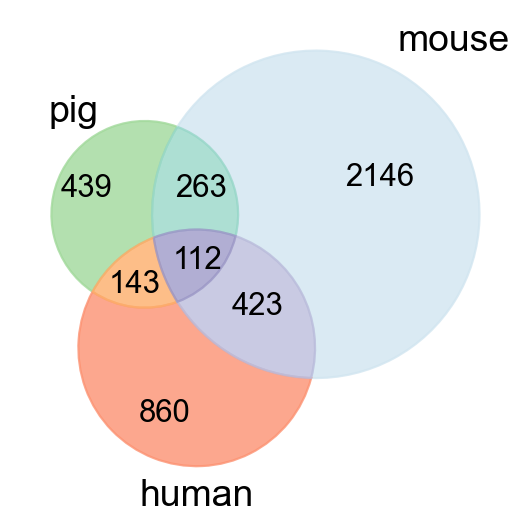

{'NR1D2', 'COBLL1', 'DAAM1', 'CACNA1D', 'SLC25A29', 'GJD2', 'MEGF9', 'CABP7', 'G6PC2', 'ENPP5', 'VEGFB', 'TMEM64', 'ENAH', 'CDC37L1', 'BHLHE41', 'C16orf72', 'DSTYK', 'TTC7B', 'MXRA7', 'USP2', 'DCX', 'PKIB', 'PIGA', 'FAM102A', 'FOXO1', 'NKX6-1', 'NUDT7', 'PPP1R1A', 'SLC30A8', 'SETD7', 'PREB', 'MSMO1', 'TMEM135', 'FAM222A', 'NHLRC3', 'TMEM50B', 'ATMIN', 'PDX1', 'VEGFA', 'OTUD3', 'TBC1D8', 'PLCL2', 'MT2A', 'ABAT', 'PAPD5', 'USP6NL', 'SLC2A13', 'CDK14', 'CYP2U1', 'HSPA1B', 'NLK', 'UBTD1', 'TNFAIP8', 'ZC3H3', 'DNAJB9', 'ABCA3', 'TMEM189', 'LMO1', 'KLHL2', 'CISH', 'ELAVL4', 'FICD', 'TP53INP2', 'GLIS3', 'SYT7', 'C12orf49', 'SPATA13', 'TRIM41', 'DBP', 'PCSK1', 'NR1D1', 'KAT2B', 'MT-CYB', 'WNT4', 'SLC35D3', 'FLCN', 'SLC2A2', 'BMI1', 'RASGRF1', 'ADRBK2', 'PTPRU', 'ELMO1', 'TSHZ1', 'GOLGB1', 'DOCK10', 'MLXIPL', 'JADE2', 'ERO1LB', 'ZFP36L2', 'ACLY', 'SORL1', 'AACS', 'C1orf51', 'REPS2', 'NEGR1', 'CEBPB', 'GPR158', 'FAM117A', 'MT-ATP6', 'INS', 'ZMAT3', 'HADH', 'HOPX', 'CREBRF', 'NFE2L1', 'KCNMA1', '

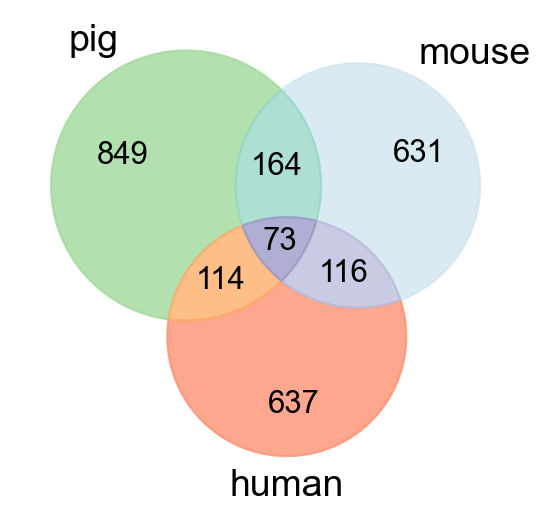

{'ZNF365', 'RABGAP1L', 'C3orf58', 'HSPB11', 'PROX1', 'EHF', 'SORD', 'UCHL1', 'TMEM237', 'FXYD6', 'ATXN10', 'TMEM59L', 'H3F3C', 'PAK3', 'EXOC6', 'MAN2A1', 'KCTD8', 'PBXIP1', 'PCDH9', 'CTXN1', 'TGIF1', 'VAT1L', 'VIM', 'HPCAL1', 'PRKCDBP', 'BTG2', 'ETV1', 'FGGY', 'PROS1', 'ACOT7', 'RBP1', 'HAUS1', 'CACNA2D2', 'SIM1', 'MAPK13', 'CDO1', 'CLSTN3', 'LRRC42', 'S100A10', 'BAMBI', 'ISL1', 'HAP1', 'LRRC49', 'TAGLN3', 'HHEX', 'SST', 'RBP4', 'UCP2', 'RHOC', 'PBX1', 'NRP2', 'PPFIA2', 'TSPO', 'CHGB', 'TMED6', 'MEST', 'GABRB3', 'TMEM130', 'AKAP7', 'LY6H', 'ST6GALNAC5', 'MOV10', 'KRT8', 'HMGN2', 'FGF14', 'PLEKHB1', 'NAB2', 'AMIGO2', 'CAPSL', 'TSPAN15', 'SYT1', 'TSPAN6', 'ST14'}
PP


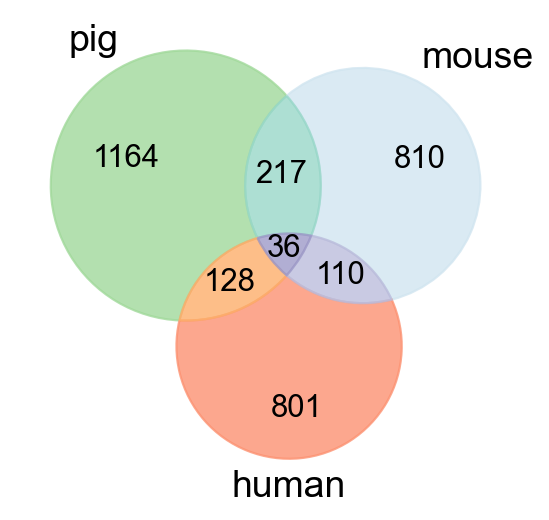

{'DMD', 'IFNGR2', 'PPY', 'HMGXB4', 'TMSB10', 'ID3', 'PLS3', 'EGR2', 'TUBB2B', 'LGMN', 'VMP1', 'PROS1', 'ETV1', 'PTP4A3', 'STMN1', 'TMEM176A', 'CLSTN3', 'FGFR1', 'CRIP2', 'HNMT', 'ID1', 'ARMCX4', 'ITM2C', 'IFT122', 'OCLN', 'TAPBPL', 'MOV10', 'RNF128', 'LGALS3BP', 'SMAD7', 'CRAT', 'PLEKHB1', 'FGF14', 'DZIP3', 'PSMB10', 'ARNT2'}


In [101]:
genes = []
for key in mk_human_map.keys():
    print(key)
    mk = venn_markers(mk_pig_map[key], mk_mouse_map[key],mk_human_map[key], labels=['pig', 'mouse', 'human'], return_dict=True)
    genes = genes + list(mk['h_p_m'])
    print(mk['h_p_m'])

In [98]:
enrichment_conservation_dict = {}

for key in ['alpha','beta', 'delta', 'PP']:

    refs = list(human_comb_endo.obs.louvain_anno_broad.cat.categories)
    refs.remove(key)
    genes_human = mk_human_map[key]
    df = pd.DataFrame(index=genes_human, columns=['mouse', 'pig'])  
    
    detected_key = expression_dict_species['pig']>0.05
    detected_key = detected_key.index[detected_key[key]].tolist()
    
    df['pig'] = ['conserved' if gene in mk_pig_map[key] else
                            'switch' if gene in mk_pig_map[refs[0]]+mk_pig_map[refs[1]]+mk_pig_map[refs[2]] else
                            'loss' if gene in detected_key else
                            'not detected' for gene in genes_human]
    
    df['pig_detected'] = ['detected' if gene in detected_key else
                            'not detected' for gene in genes_human]
    
    detected_key = expression_dict_species['mouse']>0.05
    detected_key = detected_key.index[detected_key[key]].tolist()
    
    df['mouse'] = ['conserved' if gene in mk_mouse_map[key] else
                            'switch' if gene in mk_mouse_map[refs[0]]+mk_mouse_map[refs[1]]+mk_mouse_map[refs[2]] else
                            'loss' if gene in detected_key else
                            'not detected' for gene in genes_human]
    
    df['mouse_detected'] = ['detected' if gene in detected_key else
                            'not detected' for gene in genes_human]
    enrichment_conservation_dict[key]=df

/Users/stritschler/code/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator


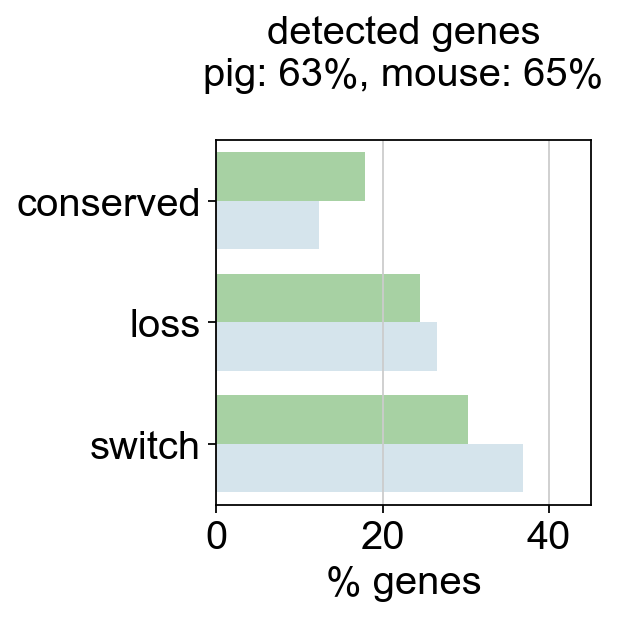

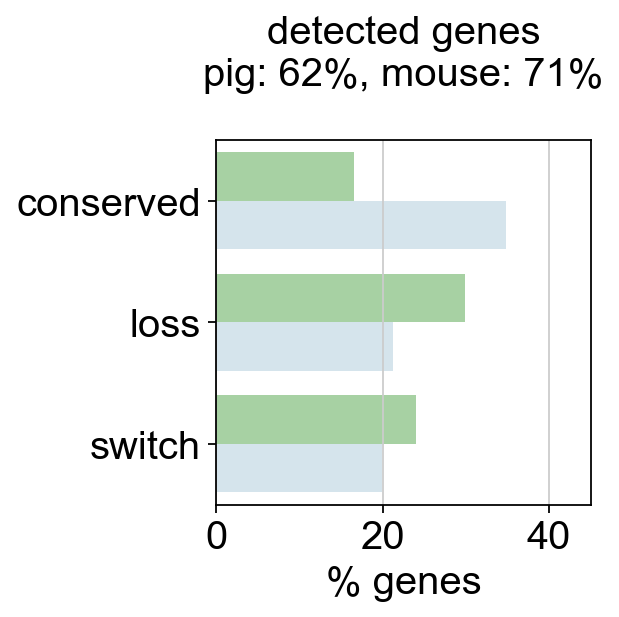

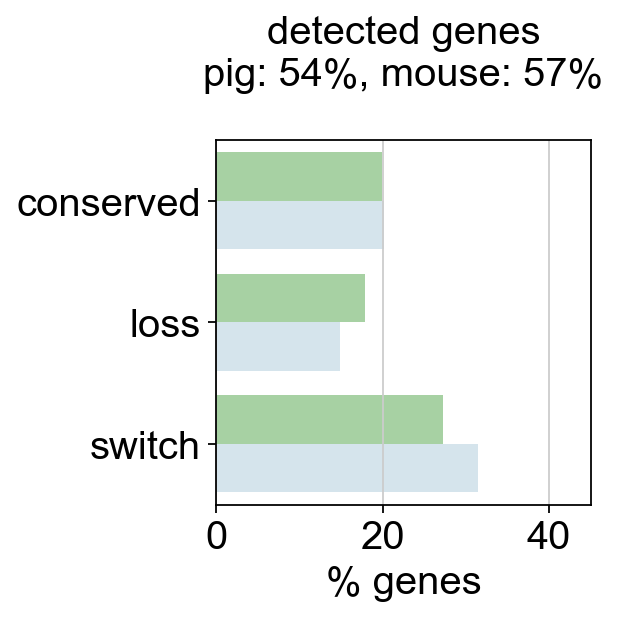

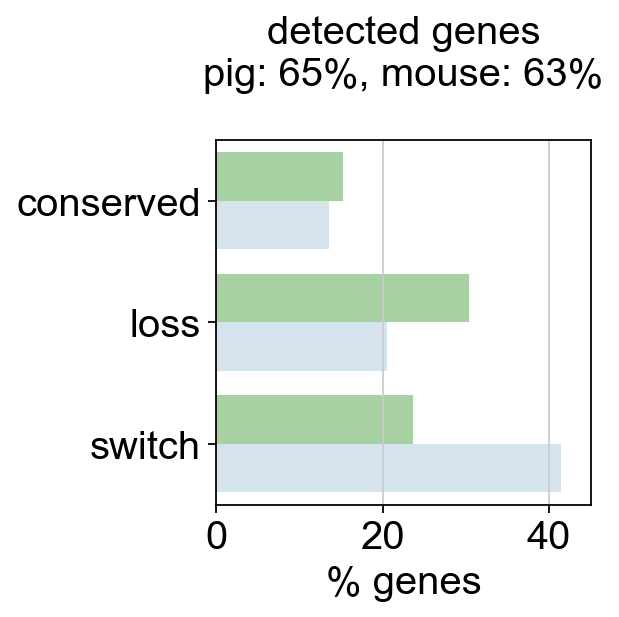

In [339]:
for key in ['alpha','beta', 'delta', 'PP']:
    df_bar = enrichment_conservation_dict[key][['pig', 'mouse']].melt()
    df = enrichment_conservation_dict[key][['pig_detected', 'mouse_detected']]=='detected'
    sum_pig = round(df.sum()['pig_detected']/len(mk_human_map[key])*100)
    sum_mouse = round(df.sum()['mouse_detected']/len(mk_human_map[key])*100)
    f, ax = pl.subplots(figsize=(3, 3))
    y='% genes'
    prop_df = (df_bar['value']
                        .groupby(df_bar['variable'])
                        .value_counts(normalize=True)
                        .rename(y)
                        .reset_index())
    prop_df[y] = prop_df[y]*100

    sns.barplot(x=y, y="value", data=prop_df, hue='variable', order=['conserved', 'loss', 'switch'], hue_order=['pig', 'mouse'], palette=['#a1d99b','#d1e5f0'])
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=18)
    ax.set_xticklabels([0,20,40], fontsize=18)
    ax.legend().remove()
    pl.ylabel('')
    pl.xlabel('% genes', fontsize=18)
    pl.xlim([0,45])
    pl.title(f'detected genes\npig: {sum_pig}%, mouse: {sum_mouse}%\n ', fontsize=18)

#### Supplementary Table 2

In [99]:
writer = pd.ExcelWriter('./Supplementary_table_2.xlsx')

for key in ['alpha', 'beta', 'delta', 'PP']:
    enrichment_conservation_dict[key][['pig', 'mouse', 'pig_detected', 'mouse_detected']].to_excel(writer, sheet_name=f'{key}_human_marker_conservation')
    if len(mk_pig_map[key])>len(mk_mouse_map[key]):
        df = pd.DataFrame(mk_pig_map[key] , columns=['pig markers'])
        df['mouse markers'] =  pd.Series(mk_mouse_map[key])
    else:
        df = pd.DataFrame(mk_mouse_map[key] , columns=['mouse markers'])
        df['pig markers'] =  pd.Series(mk_pig_map[key])
        df = df[['pig markers', 'mouse markers']].copy()
    df.to_excel(writer, sheet_name=f'{key}_pig_mouse_markers')
writer.save()

### Conservation of transcription factors

[Text(0.5, 0, 'alpha'),
 Text(1.5, 0, 'beta'),
 Text(2.5, 0, 'delta'),
 Text(3.5, 0, 'PP')]

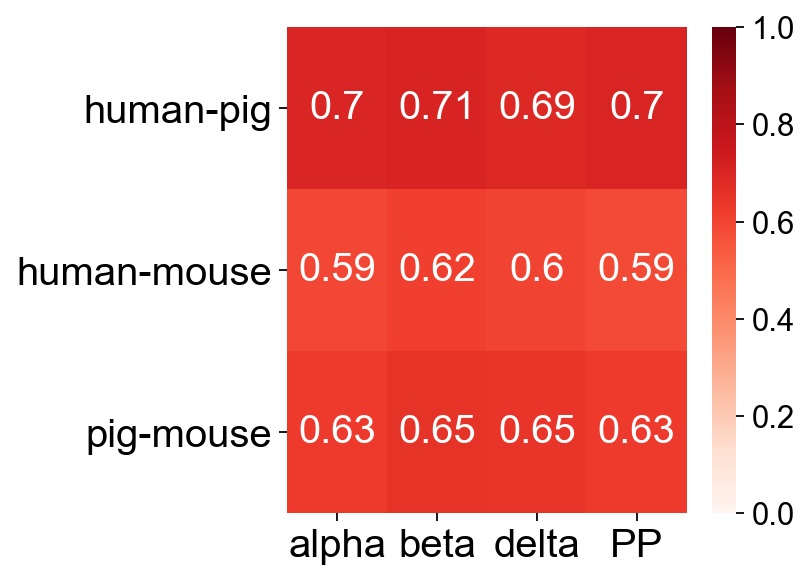

In [418]:
df.index = ['human-pig', 'human-mouse', 'pig-mouse']
ax = sns.heatmap(df.apply(pd.to_numeric), vmin=0, vmax=1, cmap='Reds', annot=df, annot_kws={'fontsize':18})
ax.set_yticklabels(ax.get_yticklabels(), fontsize=18)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=18)

#### Conserved human marker TFs

In [419]:
tfs = pd.read_csv('./data/TF_names_v_1.01_human.txt',sep='\t',header=None).unstack().tolist()

In [420]:
mk_tf = {}
for cat in mk_human_map.keys():
    tfs_h = [tf for tf in mk_human_map[cat] if tf in tfs]
    tfs_p = [tf for tf in mk_pig_map[cat] if tf in tfs]
    tfs_m = [tf for tf in mk_mouse_map[cat] if tf in tfs]
    
    mk_tf[cat] = list(set(tfs_h).intersection(tfs_p).intersection(tfs_m))

alpha


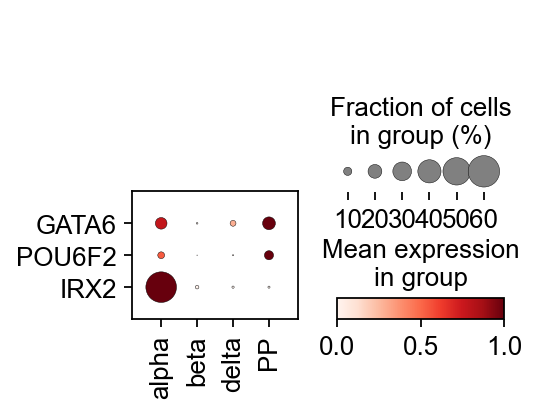

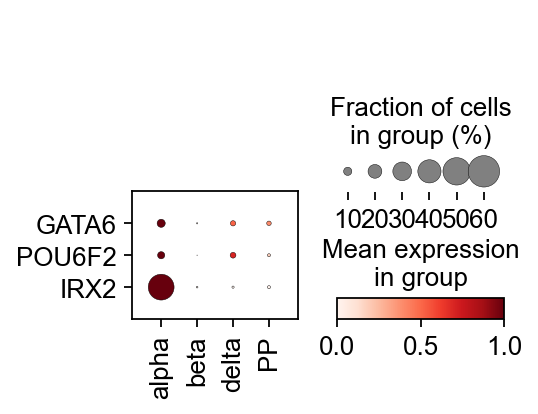

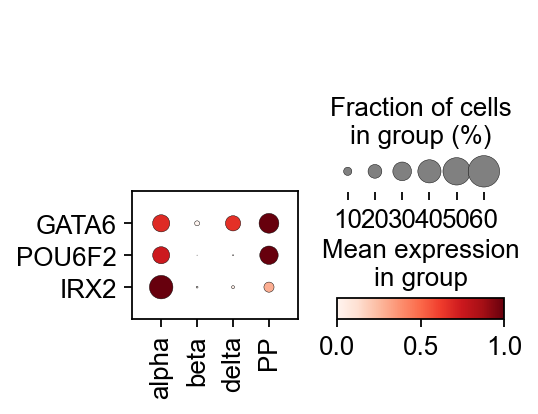

beta


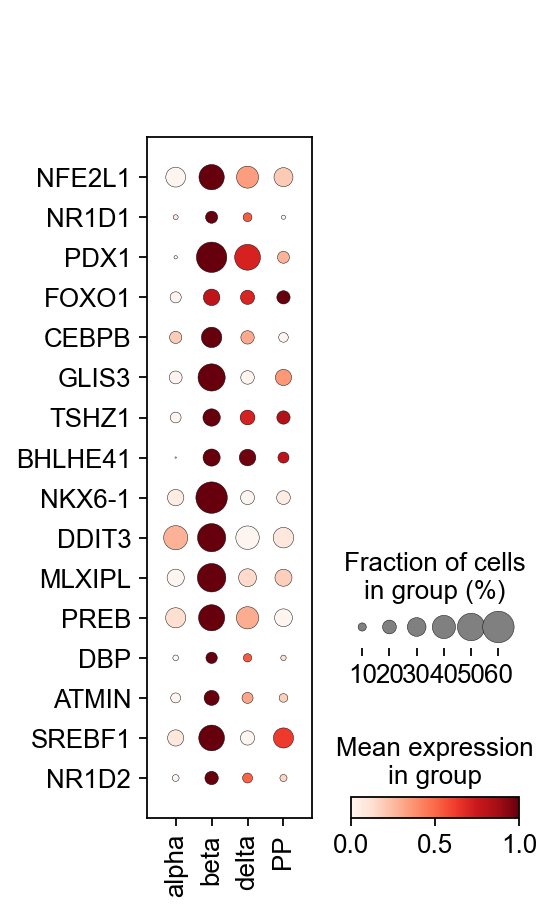

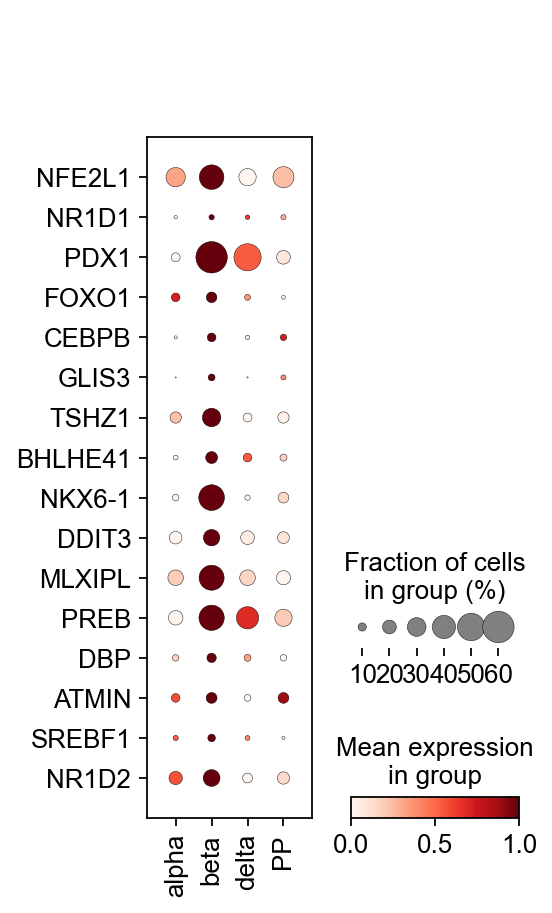

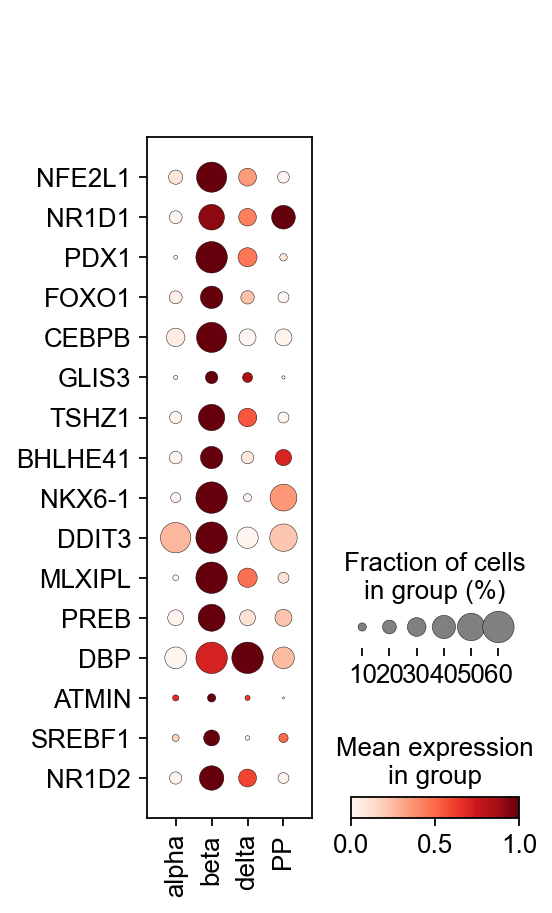

delta


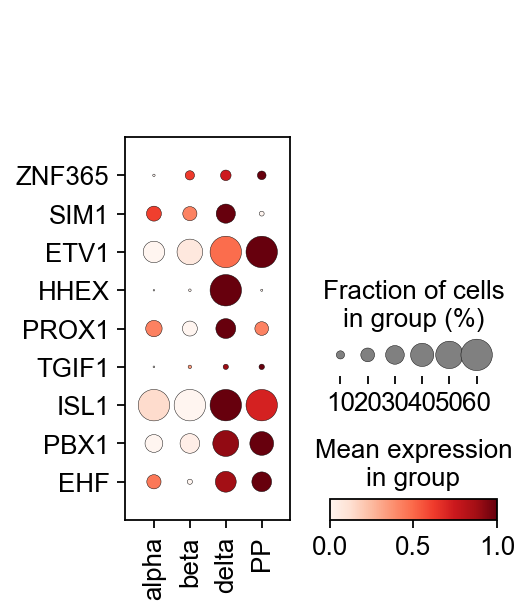

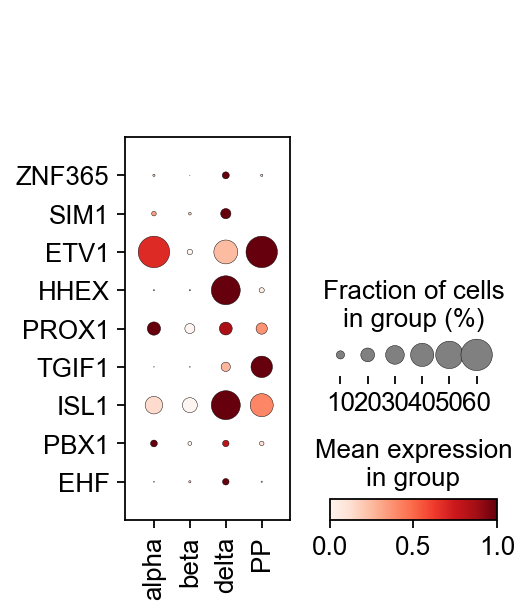

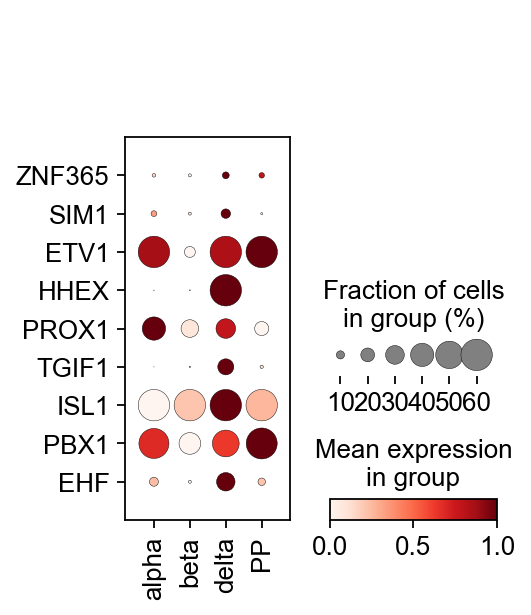

PP


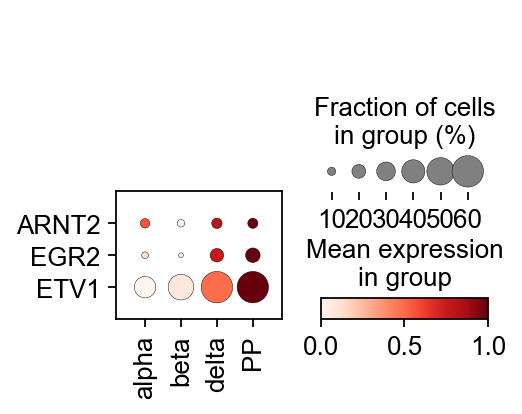

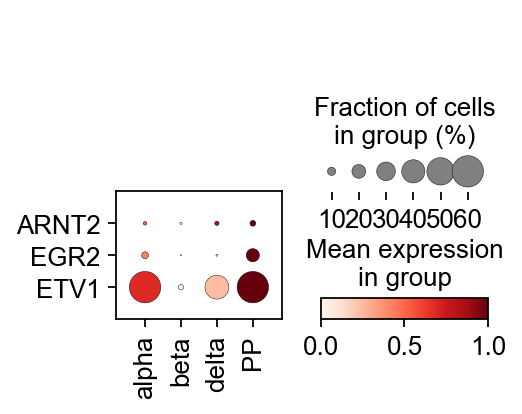

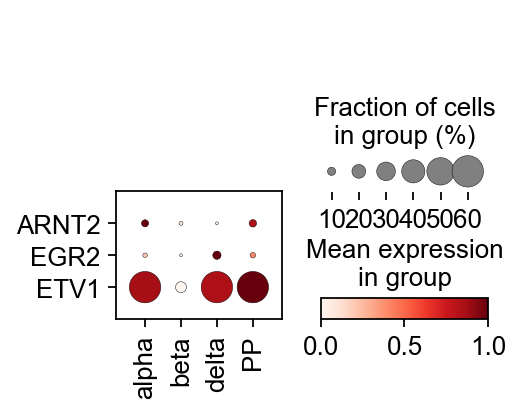

In [535]:
for key in mk_tf.keys():
    print(key)
    sc.pl.dotplot(human_comb_endo, groupby='louvain_anno_broad', var_names=mk_tf[key], standard_scale='var', dot_max=0.6, swap_axes=True)
    sc.pl.dotplot(pig_comb_endo, groupby='louvain_anno_broad', var_names=mk_tf[key], standard_scale='var', dot_max=0.6, swap_axes=True)
    sc.pl.dotplot(mouse_comb_endo, groupby='louvain_anno_broad', var_names=mk_tf[key], standard_scale='var', dot_max=0.6, swap_axes=True)

alpha: 3 TFs
human


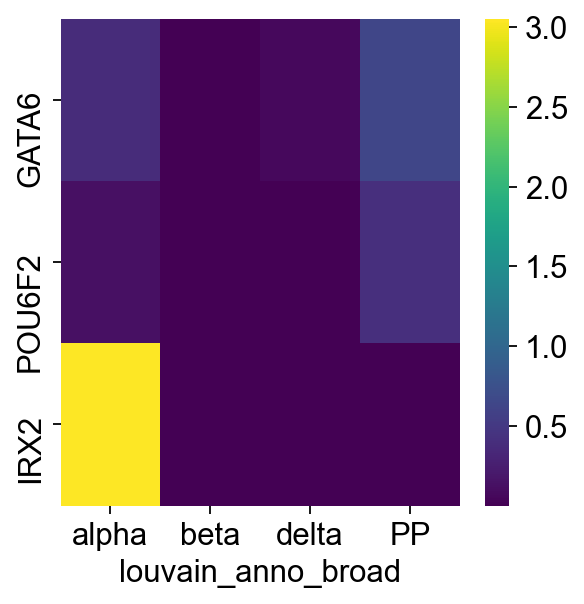

pig


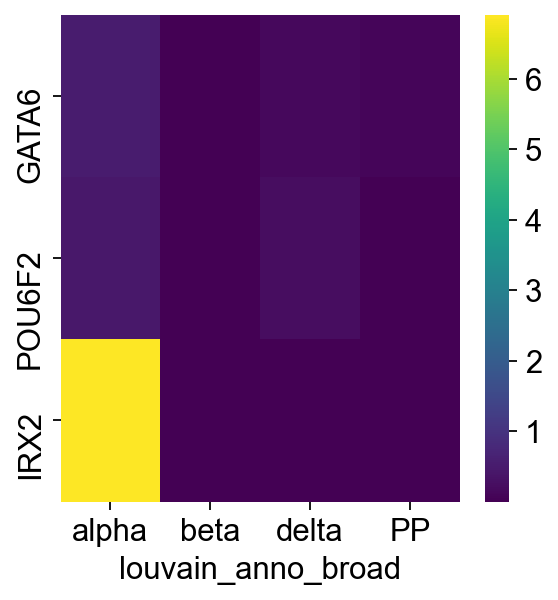

mouse


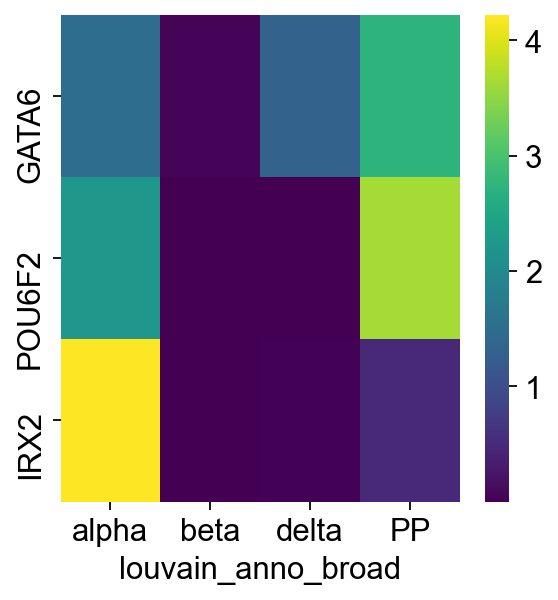

human-pig
across cell types: 0.9709336671989178 1.556129109668826e-07
wihtin cell type: 0.9975647548231166 0.04443801391123098
human-mouse
across cell types: 0.7346088062961538 0.006505489673579389
wihtin cell type: 0.9386781763541456 0.22410283112739218
pig-mouse
across cell types: 0.6069349109744802 0.036373394558989386
wihtin cell type: 0.9604404424718045 0.1796648172161598
beta: 16 TFs
human


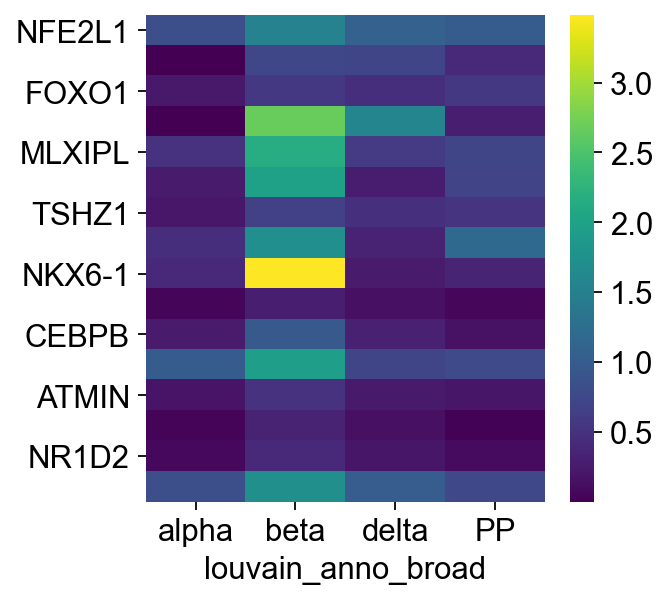

pig


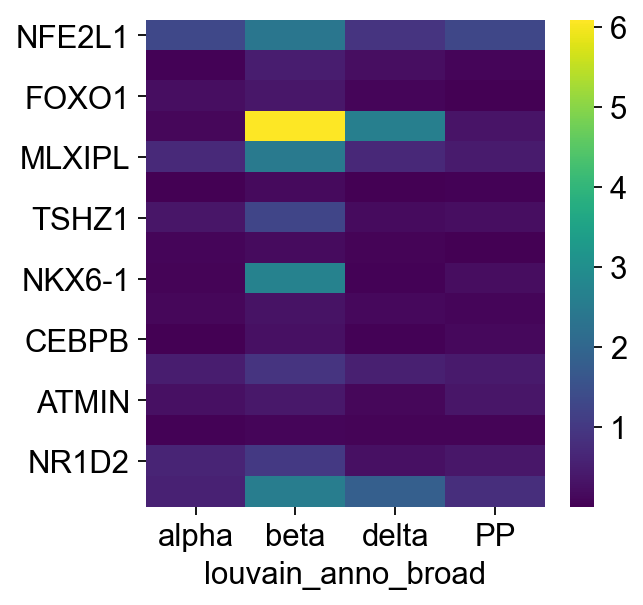

mouse


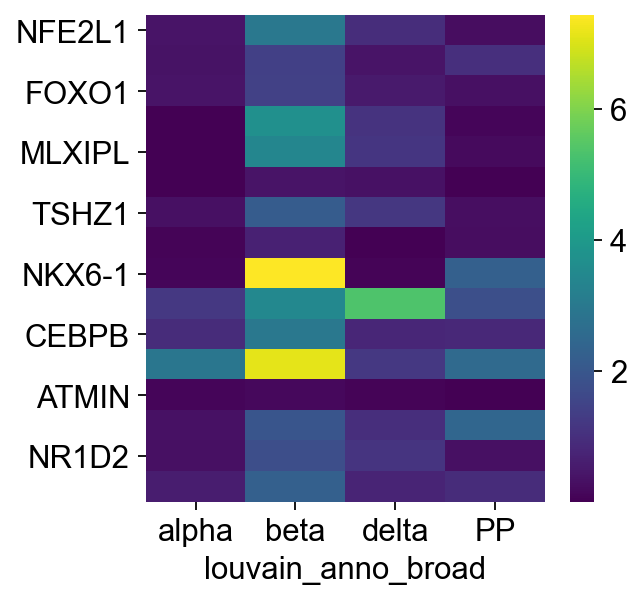

human-pig
across cell types: 0.7383577895972219 3.3380216211413956e-12
wihtin cell type: 0.649632855147679 0.006455745361842287
human-mouse
across cell types: 0.572211052662152 7.823393867942813e-07
wihtin cell type: 0.5850079876459933 0.017293141757678918
pig-mouse
across cell types: 0.44302937598591063 0.00024630674344139564
wihtin cell type: 0.4007135624119767 0.12401679337753611
delta: 9 TFs
human


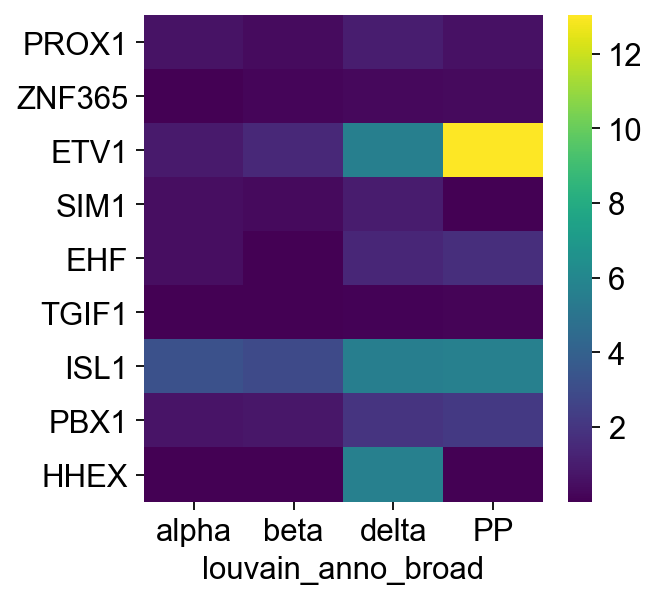

pig


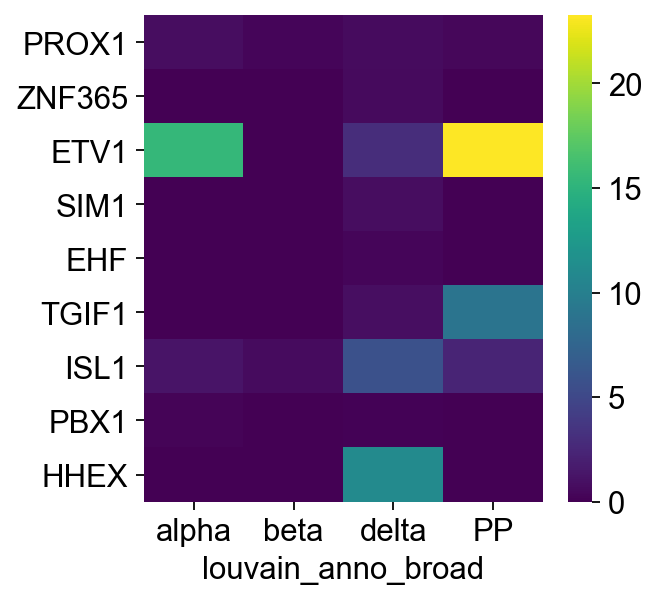

mouse


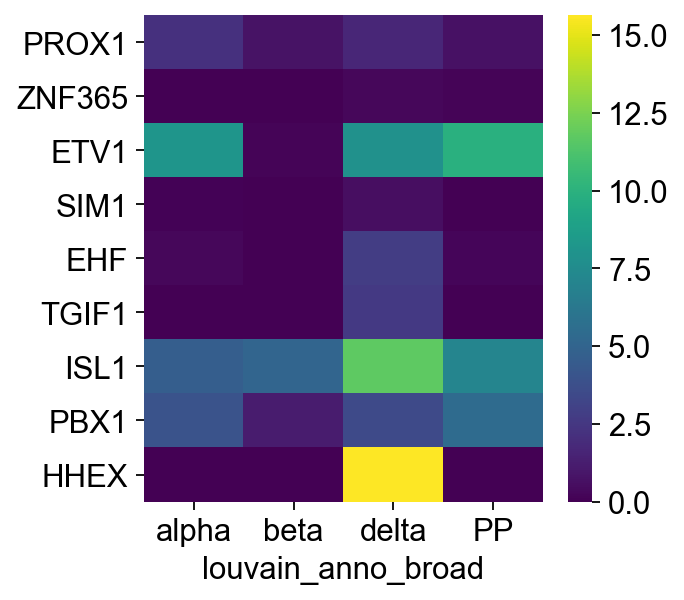

human-pig
across cell types: 0.7144404910486889 9.886520410537122e-07
wihtin cell type: 0.7932468782146418 0.010738318778355
human-mouse
across cell types: 0.7784725264925446 2.2766719386839068e-08
wihtin cell type: 0.9129859787984749 0.0005871855161109546
pig-mouse
across cell types: 0.660951158339924 1.145373151906488e-05
wihtin cell type: 0.9471247944512371 0.00010626241368300271
PP: 3 TFs
human


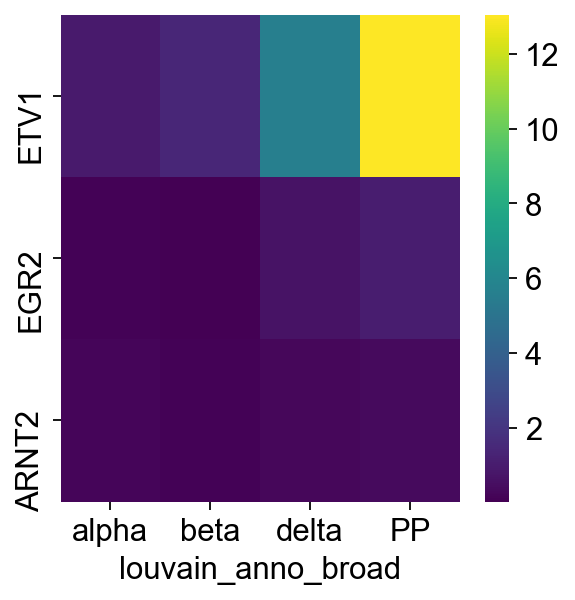

pig


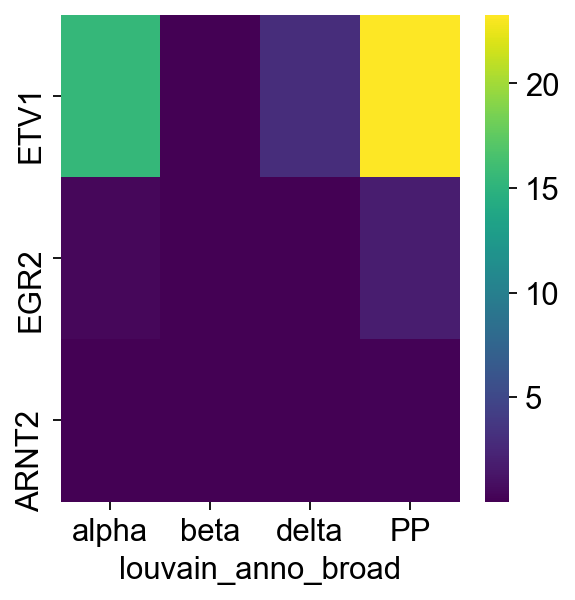

mouse


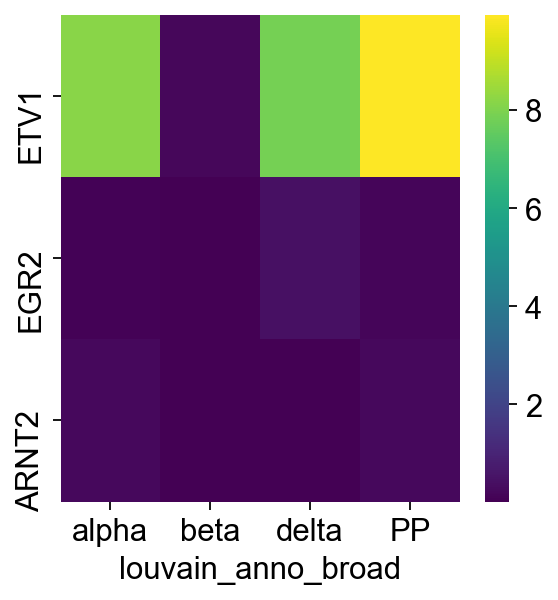

human-pig
across cell types: 0.7856738185292855 0.002453849438748189
wihtin cell type: 0.9999168096452821 0.008211729210373735
human-mouse
across cell types: 0.7872561266104651 0.002371387328329492
wihtin cell type: 0.9980868060273004 0.03938618240781258
pig-mouse
across cell types: 0.8679069143043521 0.00025267448801057784
wihtin cell type: 0.9972062776970392 0.04759791161819072


In [421]:
# TF pattern correlation

df = pd.DataFrame(columns=['alpha', 'beta', 'delta', 'PP'])
df_p = pd.DataFrame(columns=['alpha', 'beta', 'delta', 'PP'])

for key in mk_tf.keys():
    
    print(f'{key}: {len(mk_tf[key])} TFs')

    adata_dict = {
        'human': sc.pp.scale(human_comb_endo[:, mk_tf[key]], zero_center=False, copy=True),
        'pig': sc.pp.scale(pig_comb_endo[:, mk_tf[key]], zero_center=False, copy=True),
        'mouse': sc.pp.scale(mouse_comb_endo[:, mk_tf[key]], zero_center=False, copy=True)
    }  
    
    mean_dict = {}
    for k, v in adata_dict.items():
        mean_dict[k] = sc.get.obs_df(
            v,
            keys=['louvain_anno_broad'] + mk_tf[key]
        ).groupby('louvain_anno_broad').mean().T.loc[mk_tf[key]]      
        
    frac_expressed_dict = {}
    for s in ['human', 'pig', 'mouse']:
        frac_expressed_dict[s] = expression_dict_species[s].loc[mk_tf[key]] / expression_dict_species[s].mean(axis=0)

    harmonic_avg = {}
    for s in ['human', 'pig', 'mouse']:
        print(s)        
        harmonic_avg[s] = mean_dict[s] * frac_expressed_dict[s]
        sns.heatmap(harmonic_avg[s], cmap='viridis')
        pl.show()       
        
    for i, combi in enumerate(itertools.combinations(['human', 'pig', 'mouse'], 2)):
        print('-'.join(combi))
        rho, p = pearsonr(harmonic_avg[combi[0]].values.flatten(), harmonic_avg[combi[1]].values.flatten())
        print('across cell types:', rho, p)
        df.loc[i, key] = rho
        df_p.loc[i, key] = round(p,4)
        
        rho, p = pearsonr(harmonic_avg[combi[0]][key], harmonic_avg[combi[1]][key])
        print('wihtin cell type:', rho, p)


[Text(0.5, 0, 'alpha'),
 Text(1.5, 0, 'beta'),
 Text(2.5, 0, 'delta'),
 Text(3.5, 0, 'PP')]

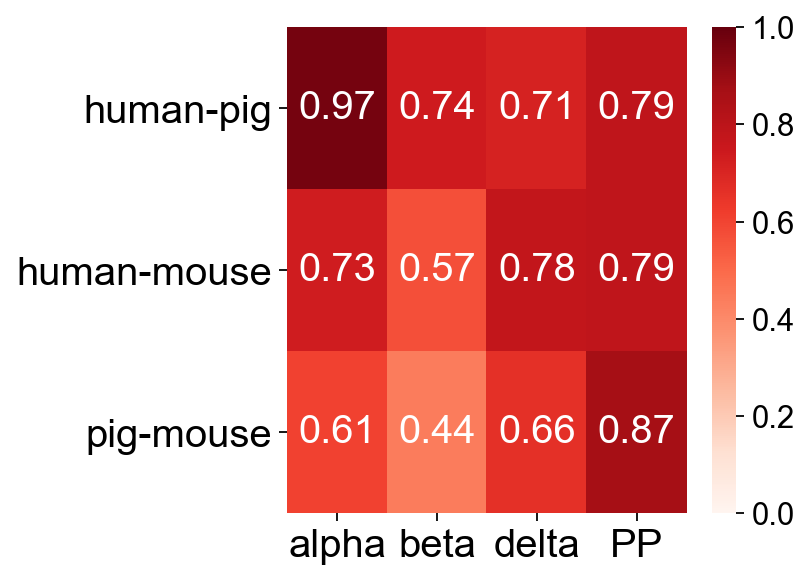

In [422]:
df.index = ['human-pig', 'human-mouse', 'pig-mouse']
ax = sns.heatmap(df.apply(pd.to_numeric), vmin=0, vmax=1, cmap='Reds', annot=df, annot_kws={'fontsize':18})
ax.set_yticklabels(ax.get_yticklabels(), fontsize=18)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=18)

#### enriched human marker TFs

In [396]:
tfs = pd.read_csv('./data/TF_names_v_1.01_human.txt',sep='\t',header=None).unstack().tolist()

In [423]:
mk_human_tf = {}

for key in mk_human_map.keys():

#     detected = expression_dict_species['human'] > 0.05
#     genes = detected.index[detected[cat]].tolist()
    
    mk_human_tf[key] = [tf for tf in mk_human_map[key] if tf in tfs]

alpha: 59 TFs
human


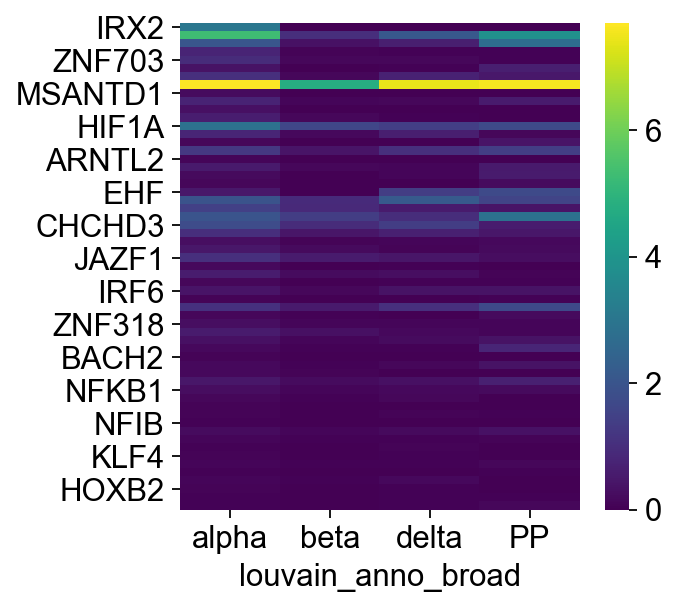

pig


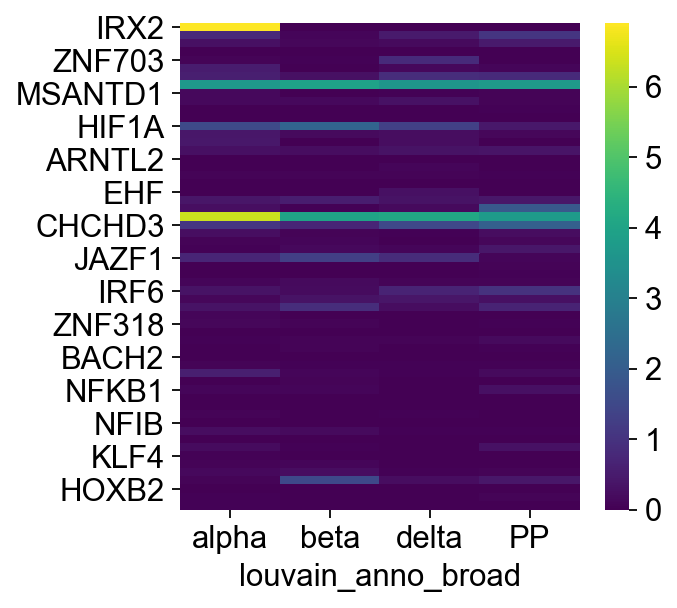

mouse


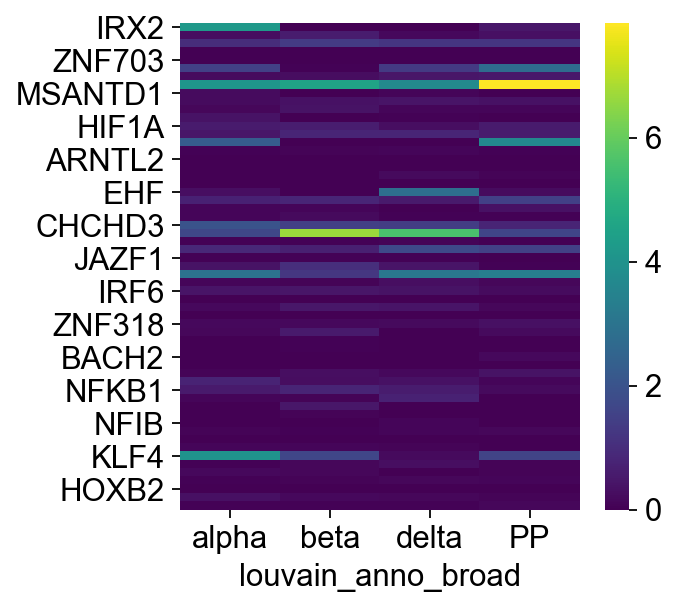

human-pig
across cell types: 0.651183458484484 7.355476645573886e-30
wihtin cell type: 0.5833312812108141 1.2437501640087495e-06
human-mouse
across cell types: 0.5243834056169697 4.503874491174406e-18
wihtin cell type: 0.48060841570970797 0.00011685060724663315
pig-mouse
across cell types: 0.3716443107524138 3.830300642026035e-09
wihtin cell type: 0.483265659202564 0.00010573636373610877
beta: 129 TFs
human


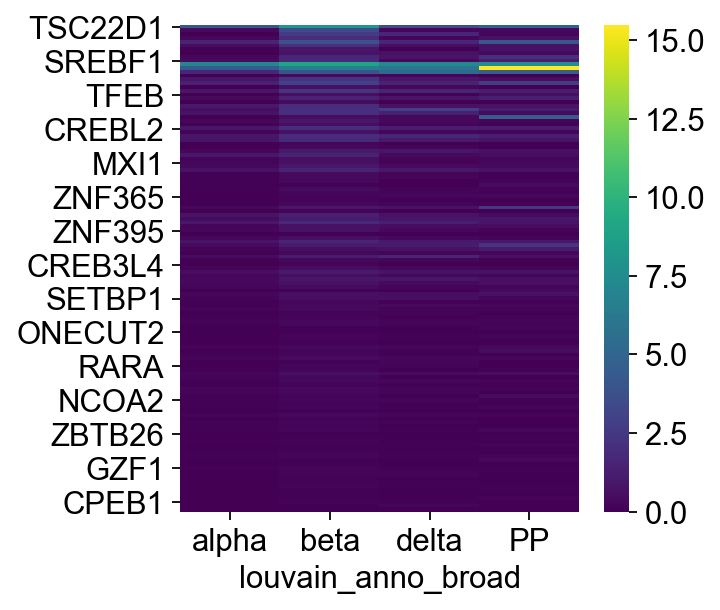

pig


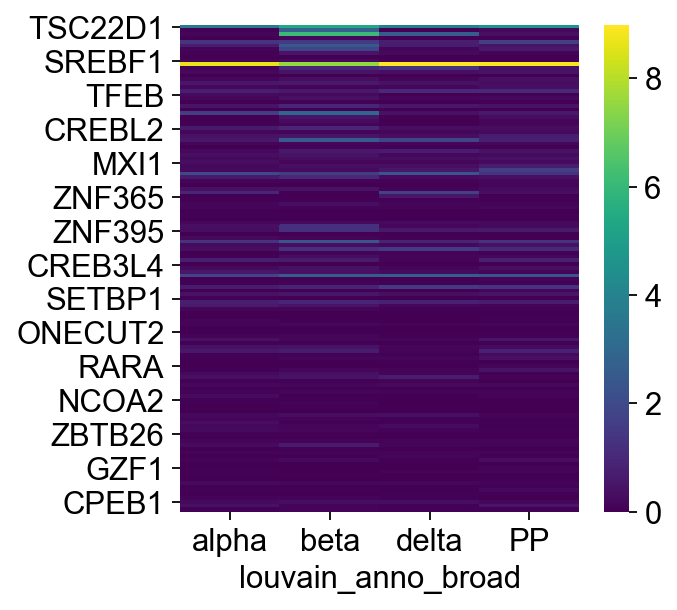

mouse


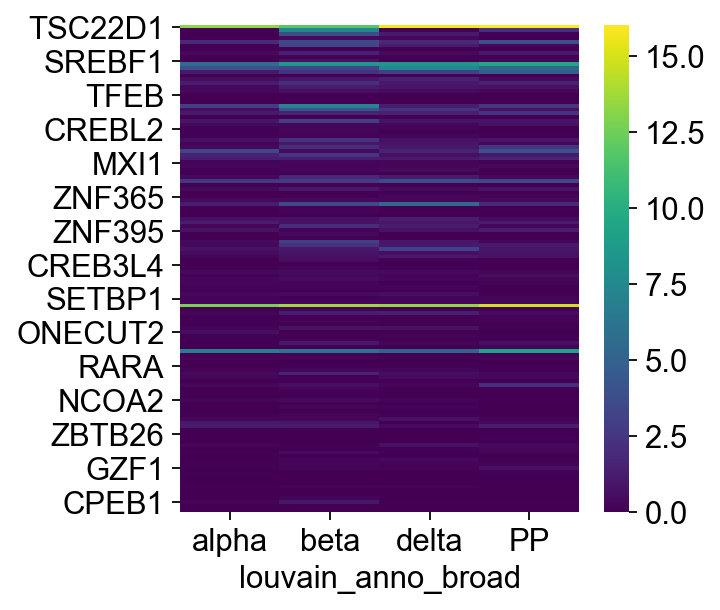

human-pig
across cell types: 0.6111196716077082 3.743436774779521e-54
wihtin cell type: 0.7230559856356941 3.836120801013668e-22
human-mouse
across cell types: 0.5223524914731222 1.8327898121834437e-37
wihtin cell type: 0.6141359770666266 9.960904701152045e-15
pig-mouse
across cell types: 0.5267287870545377 3.569397203349373e-38
wihtin cell type: 0.5809168675418422 5.314659306397346e-13
delta: 57 TFs
human


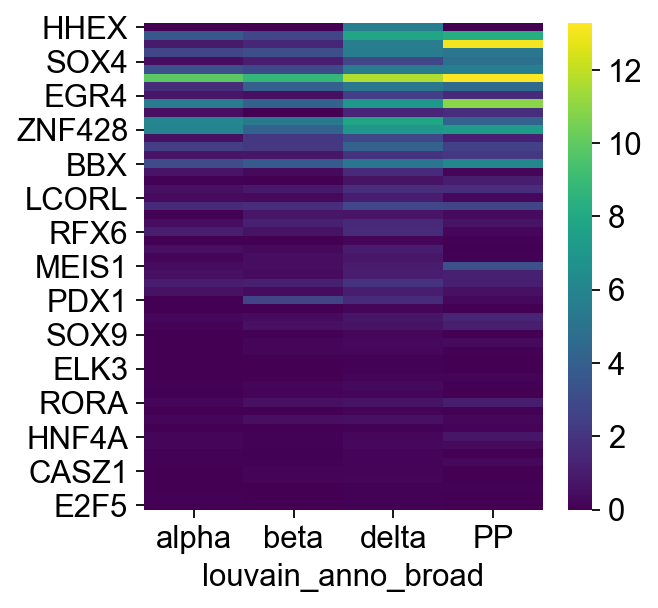

pig


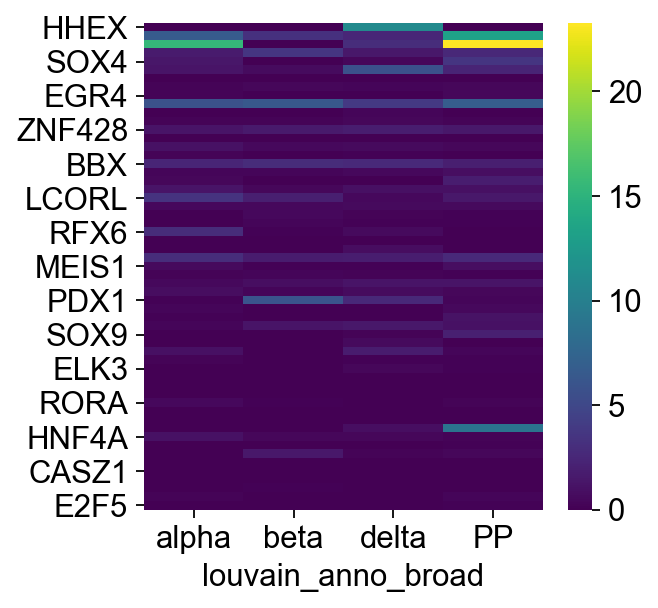

mouse


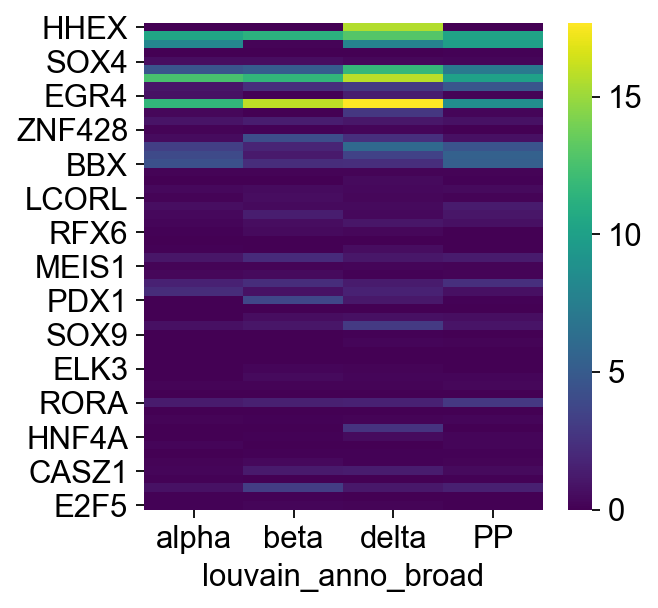

human-pig
across cell types: 0.46771165118927305 8.568018709213732e-14
wihtin cell type: 0.4443302245580549 0.0005351558759990366
human-mouse
across cell types: 0.7098796988484612 2.9363008037081282e-36
wihtin cell type: 0.7312112898417994 1.0538246305242127e-10
pig-mouse
across cell types: 0.532332405230033 4.378556776210525e-18
wihtin cell type: 0.6699931731266039 1.1990463234295202e-08
PP: 100 TFs
human


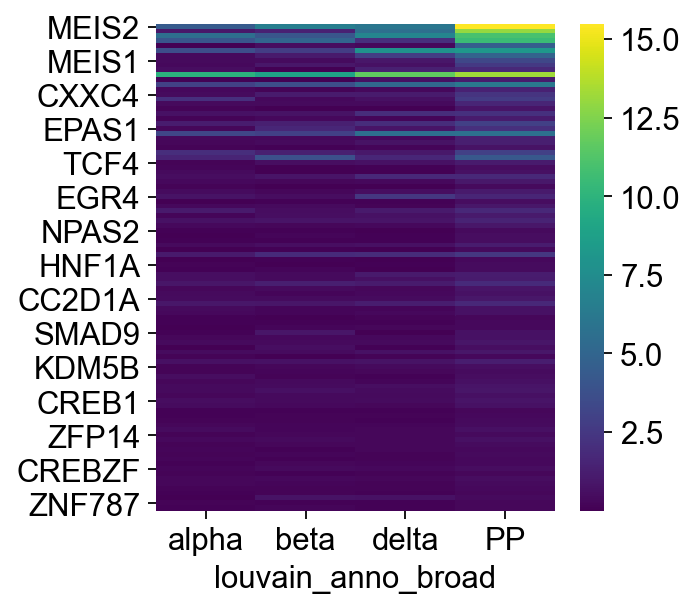

pig


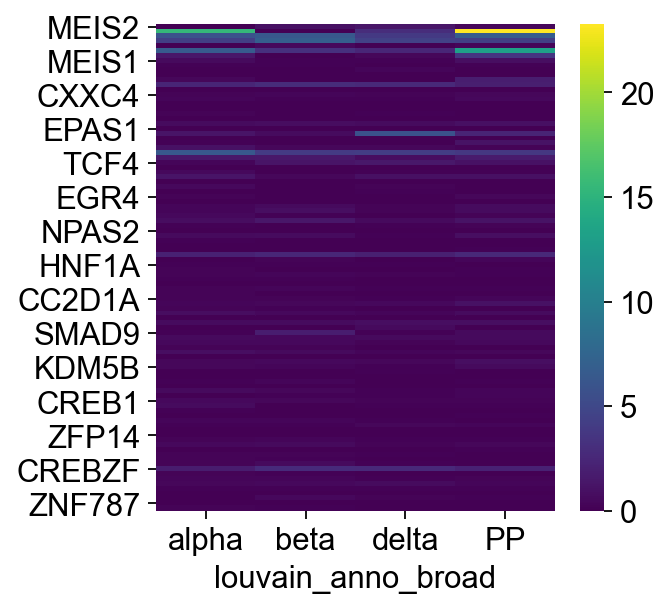

mouse


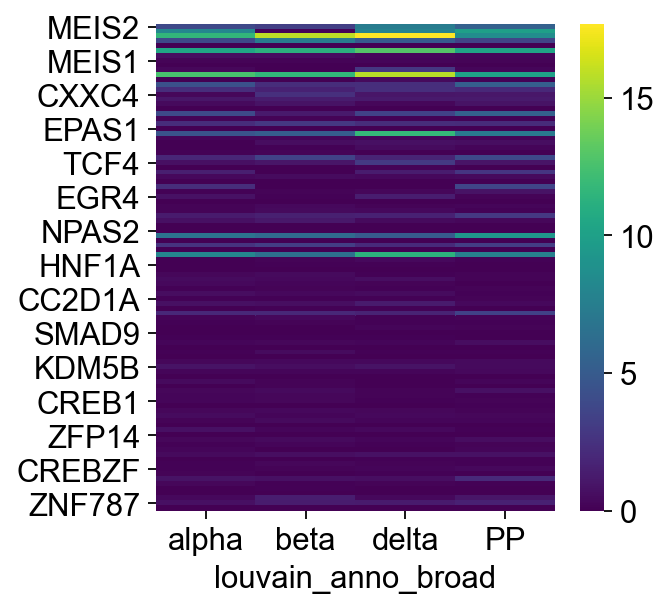

human-pig
across cell types: 0.5087885800255163 1.0037028515592877e-27
wihtin cell type: 0.5993741893171712 4.444760470360057e-11
human-mouse
across cell types: 0.711720981971734 5.061978012662952e-63
wihtin cell type: 0.7146581171606557 6.833822083585688e-17
pig-mouse
across cell types: 0.5241688305544665 1.3065944871451916e-29
wihtin cell type: 0.5927964697556053 8.151733376368442e-11


In [424]:
# TF pattern correlation

df = pd.DataFrame(columns=['alpha', 'beta', 'delta', 'PP'])
df_p = pd.DataFrame(columns=['alpha', 'beta', 'delta', 'PP'])

for key in df.columns:
    
    print(f'{key}: {len(mk_human_tf[key])} TFs')

    adata_dict = {
        'human': sc.pp.scale(human_comb_endo[:, mk_human_tf[key]], zero_center=False, copy=True),
        'pig': sc.pp.scale(pig_comb_endo[:, mk_human_tf[key]], zero_center=False, copy=True),
        'mouse': sc.pp.scale(mouse_comb_endo[:, mk_human_tf[key]], zero_center=False, copy=True)
    }  
    
    mean_dict = {}
    for k, v in adata_dict.items():
        mean_dict[k] = sc.get.obs_df(
            v,
            keys=['louvain_anno_broad'] + mk_human_tf[key]
        ).groupby('louvain_anno_broad').mean().T.loc[mk_human_tf[key]]      
        
    frac_expressed_dict = {}
    for s in ['human', 'pig', 'mouse']:
        frac_expressed_dict[s] = expression_dict_species[s].loc[mk_human_tf[key]] / expression_dict_species[s].mean(axis=0)

    harmonic_avg = {}
    for s in ['human', 'pig', 'mouse']:
        print(s)        
        harmonic_avg[s] = mean_dict[s] * frac_expressed_dict[s]
        sns.heatmap(harmonic_avg[s], cmap='viridis')
        pl.show()       
        
    for i, combi in enumerate(itertools.combinations(['human', 'pig', 'mouse'], 2)):
        print('-'.join(combi))
        rho, p = pearsonr(harmonic_avg[combi[0]].values.flatten(), harmonic_avg[combi[1]].values.flatten())
        print('across cell types:', rho, p)
        
        df.loc[i, key] = rho
        df_p.loc[i, key] = round(p,4)

        rho, p = pearsonr(harmonic_avg[combi[0]][key], harmonic_avg[combi[1]][key])
        print('wihtin cell type:', rho, p)
        #df.loc[i, key] = [f'rho={rho}, p={p}']

[Text(0.5, 0, 'alpha'),
 Text(1.5, 0, 'beta'),
 Text(2.5, 0, 'delta'),
 Text(3.5, 0, 'PP')]

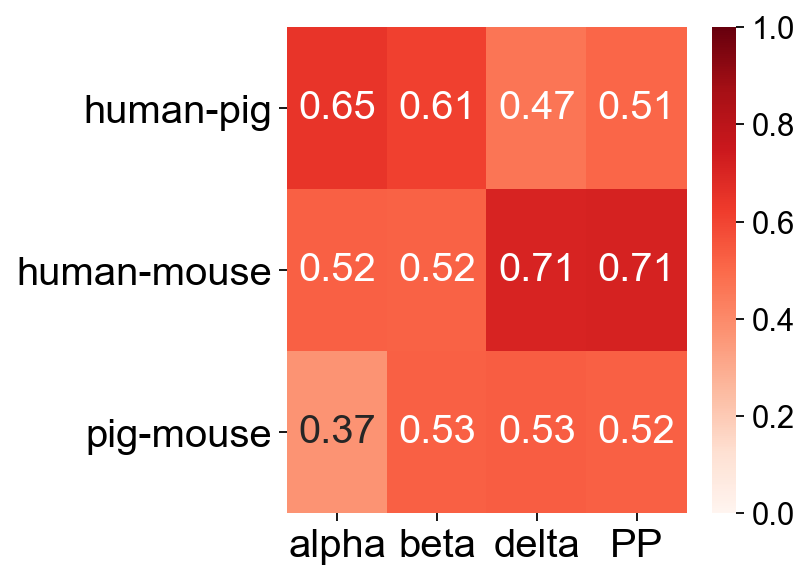

In [425]:
df.index = ['human-pig', 'human-mouse', 'pig-mouse']
ax = sns.heatmap(df.apply(pd.to_numeric), vmin=0, vmax=1, cmap='Reds', annot=df, annot_kws={'fontsize':18})
ax.set_yticklabels(ax.get_yticklabels(), fontsize=18)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=18)

#### Expressed human TFs

In [400]:
tfs = pd.read_csv('./data/TF_names_v_1.01_human.txt', sep='\t', header=None).unstack().tolist()

In [412]:
# TF pattern correlation

df = pd.DataFrame(columns=['alpha', 'beta', 'delta', 'PP'])
df_p = pd.DataFrame(columns=['alpha', 'beta', 'delta', 'PP'])

for key in ['alpha', 'beta', 'delta', 'PP']:
    
    consv = conservation_dict[key].loc[(conservation_dict[key]['pig']=='conserved')&(conservation_dict[key]['mouse']=='conserved')].index.tolist()
    consv_tf = [tf for tf in tfs if tf in consv]
    
    print(f'{key}: {len(consv_tf)} TFs')
    
    
    adata_dict = {
        'human': sc.pp.scale(human_comb_endo[:, consv_tf], zero_center=False, copy=True),
        'pig': sc.pp.scale(pig_comb_endo[:, consv_tf], zero_center=False, copy=True),
        'mouse': sc.pp.scale(mouse_comb_endo[:, consv_tf], zero_center=False, copy=True)
    }  
    
    mean_dict = {}
    for k, v in adata_dict.items():
        mean_dict[k] = sc.get.obs_df(
            v,
            keys=['louvain_anno_broad'] + consv_tf
        ).groupby('louvain_anno_broad').mean().T.loc[consv_tf]      
        
    frac_expressed_dict = {}
    for s in ['human', 'pig', 'mouse']:
        frac_expressed_dict[s] = expression_dict_species[s].loc[consv_tf] / expression_dict_species[s].mean(axis=0)

    harmonic_avg = {}
    for s in ['human', 'pig', 'mouse']:
        harmonic_avg[s] = mean_dict[s] * frac_expressed_dict[s]
        
    for i, combi in enumerate(itertools.combinations(['human', 'pig', 'mouse'], 2)):
        print('-'.join(combi))
        rho, p = pearsonr(harmonic_avg[combi[0]].values.flatten(), harmonic_avg[combi[1]].values.flatten())
        print('across cell types:', rho, p)
        df.loc[i, key] = rho
        df_p.loc[i, key] = round(p,4)
        
        rho, p = pearsonr(harmonic_avg[combi[0]][key], harmonic_avg[combi[1]][key])
        print('wihtin cell type:', rho, p)


alpha: 277 TFs
human-pig
across cell types: 0.7001369259378879 5.375071389952845e-164
wihtin cell type: 0.6330675797499206 1.9804941029337893e-32
human-mouse
across cell types: 0.5902541328111283 5.492268289020444e-105
wihtin cell type: 0.5503825241730139 2.4488339172146063e-23
pig-mouse
across cell types: 0.6259316206528676 1.4597964057588597e-121
wihtin cell type: 0.6363744276395974 7.494515586690709e-33
beta: 318 TFs
human-pig
across cell types: 0.7081264405783823 3.534938494667536e-194
wihtin cell type: 0.752000140888654 3.7688782459090903e-59
human-mouse
across cell types: 0.6164522601308956 5.275520428276385e-134
wihtin cell type: 0.6240895643397316 9.865053889789328e-36
pig-mouse
across cell types: 0.6531892738167763 1.342902217067978e-155
wihtin cell type: 0.7132056790319841 1.08461864332046e-50
delta: 264 TFs
human-pig
across cell types: 0.6909943828786492 9.855834850591756e-151
wihtin cell type: 0.7349661620984778 4.2103107257228856e-46
human-mouse
across cell types: 0.601634

### PCA representation and correlation of endocrine profiles

In [65]:
adata_comb_endo = sc.pp.scale(
    human_comb_endo, copy=True, zero_center=False).concatenate(
    sc.pp.scale(pig_comb_endo, copy=True, zero_center=False), 
    sc.pp.scale(mouse_comb_endo, copy=True, zero_center=False), 
    batch_categories=['human', 'pig', 'mouse'])

In [67]:
adata_comb_endo.obs.louvain_anno_broad.value_counts()

beta     36605
alpha    14178
delta     4458
PP         300
Name: louvain_anno_broad, dtype: int64

In [68]:
# subset beta, alpha, delta to equal representation
x_beta = sc.pp.subsample(adata_comb_endo[adata_comb_endo.obs.louvain_anno_broad.isin(['beta'])].copy(),n_obs=2000, copy=True).obs_names
x_alpha = sc.pp.subsample(adata_comb_endo[adata_comb_endo.obs.louvain_anno_broad.isin(['alpha'])].copy(),n_obs=2000, copy=True).obs_names
x_delta = sc.pp.subsample(adata_comb_endo[adata_comb_endo.obs.louvain_anno_broad.isin(['delta'])].copy(),n_obs=2000, copy=True).obs_names
x_pp= adata_comb_endo[adata_comb_endo.obs.louvain_anno_broad.isin(['PP'])].copy().obs_names

In [69]:
adata_comb_endo_sub = adata_comb_endo[list(x_beta)+list(x_alpha)+list(x_delta)+list(x_pp)].copy()

In [71]:
adata_comb_endo_sub.obs.louvain_anno_broad.value_counts()

delta    2000
beta     2000
alpha    2000
PP        300
Name: louvain_anno_broad, dtype: int64

In [72]:
sc.pp.filter_genes(adata_comb_endo_sub, min_cells=20)

filtered out 347 genes that are detected in less than 20 cells


In [73]:
sc.pp.highly_variable_genes(adata_comb_endo_sub, n_top_genes=4000, flavor='cell_ranger')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [152]:
sc.pp.pca(adata_comb_endo_sub)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:09)


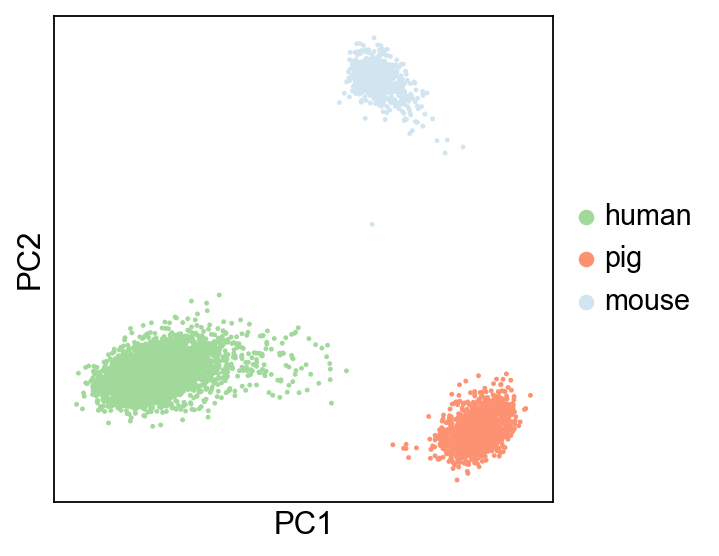

In [156]:
sc.set_figure_params()
sc.pl.pca(adata_comb_endo_sub, color='batch', components=['1,2'], title=[''], palette=['#a1d99b', '#fc9272', '#d1e5f0'])

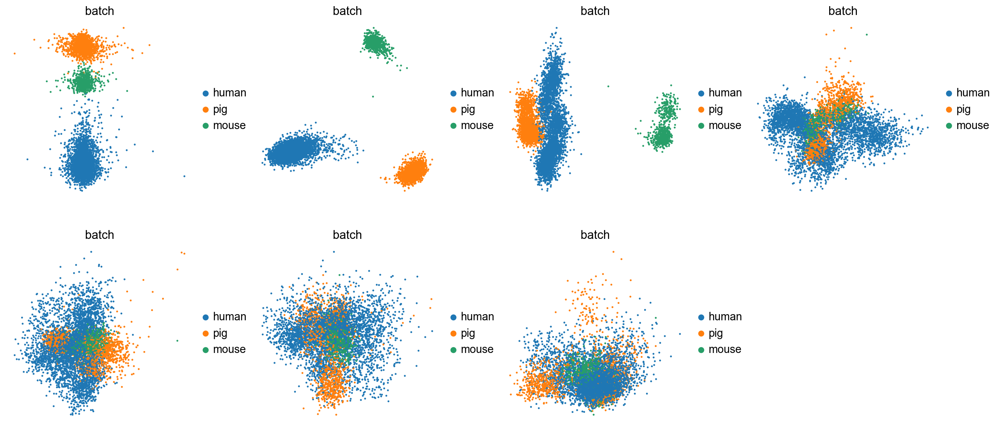

In [77]:
sc.pl.pca(adata_comb_endo_sub, color='batch', components=['0,1', '1,2', '2,3', '3,4', '4,5', '5,6', '6,7'])

In [78]:
#removing PC1 and 2 that show strong species effect
adata_comb_endo_sub.obsm['X_pca'] = np.delete(adata_comb_endo_sub.obsm['X_pca'],0,axis=1)
adata_comb_endo_sub.obsm['X_pca'] = np.delete(adata_comb_endo_sub.obsm['X_pca'],0,axis=1)

In [79]:
adata_comb_endo_sub.obs['louvain_species'] = ['_'.join([a,b]) for a,b in zip(adata_comb_endo_sub.obs.louvain_anno_broad,adata_comb_endo_sub.obs.batch)]

In [80]:
%%time
genedf = sc.get.obs_df(
        adata_comb_endo_sub,
        keys=['louvain_species'],
        obsm_keys=[('X_pca', i) for i in range(0,48)] #if i not in [1]]
    )
grouped = genedf.groupby('louvain_species')
mean_df = grouped.mean()

CPU times: user 20.4 ms, sys: 4.29 ms, total: 24.7 ms
Wall time: 26.5 ms


In [117]:
df_corr = mean_df.T.corr(method='pearson')

In [118]:
adata_comb_endo.obs.louvain_anno_broad.cat.categories

Index(['alpha', 'beta', 'delta', 'PP'], dtype='object')

In [119]:
col_dict_1

{'alpha': '#33a02c', 'delta': '#e31a1c', 'PP': '#1f78b4', 'beta': '#b15928'}

/Users/stritschler/code/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: UserWarning: Use the colorbar set_ticks() method instead.
/Users/stritschler/code/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: UserWarning: Use the colorbar set_ticks() method instead.


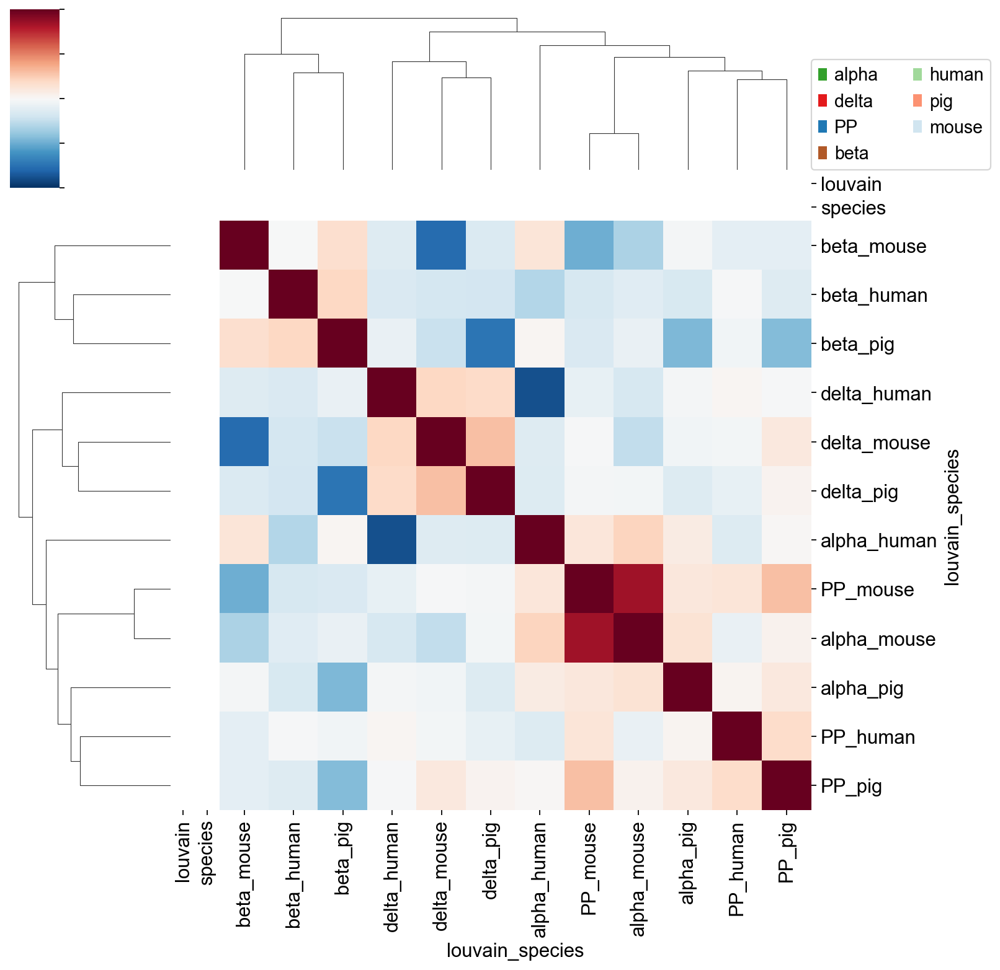

In [120]:
# set row colors
cols = pd.DataFrame(index = df_corr.index)

col_dict_1 = dict(zip(set(adata_comb_endo.obs.louvain_anno_broad.cat.categories), human_comb_endo.uns['louvain_anno_broad_colors']))
cols['louvain'] = pd.DataFrame([g.split('_')[1] for g in mean_df.index], index=df_corr.index)[0].map(col_dict_1)

col_dict_2 = dict(zip(set(adata_comb_endo.obs.batch.cat.categories), ['#a1d99b', '#fc9272', '#d1e5f0']))
cols['species'] = pd.DataFrame([g.split('_')[0] for g in mean_df.index], index=df_corr.index)[0].map(col_dict_2)

g = sns.clustermap(df_corr, col_colors=cols, row_colors=cols, vmin=-1,vmax=1, cmap='RdBu_r')

# add legend for colors
for label in col_dict_1.keys():
    g.ax_col_dendrogram.bar(0, 0, color=col_dict_1[label],
                            label=label, linewidth=0)
for label in col_dict_2.keys():
    g.ax_col_dendrogram.bar(0, 0, color=col_dict_2[label],
                            label=label, linewidth=0)
g.cax.set_xticklabels([])
g.cax.set_yticklabels([])
g.cax.set_xticks([])
g.cax.set_yticks([])

g.ax_col_dendrogram.legend(loc=(1,0), ncol=2)

In [148]:
for key in ['alpha', 'beta', 'delta', 'PP', 'human', 'pig', 'mouse']:
    df_sub = df_corr.loc[[x for x in df_corr.index if key in x], [x for x in df_corr.columns if key in x]]
    avg = np.round(np.array(df_sub)[np.triu_indices(3, k = 1)].mean(), 2)
    print(f'average correlation {key}: {avg}')

average correlation alpha: 0.15
average correlation beta: 0.12
average correlation delta: 0.23
average correlation PP: 0.2
average correlation human: -0.15
average correlation pig: -0.26
average correlation mouse: 0.02


## Beta cells

In [22]:
human = sc.read('./data/adata_human_beta.h5ad')

In [23]:
pig = sc.read('../pig_islets/data/adata_beta_pig.h5ad')

In [24]:
mouse = sc.read('../mouse_islets/data/mouse_beta.h5ad')

In [113]:
conv = pd.read_csv('/Users/stritschler/Documents/ICB/pancreatic-endocrine-cells-cross-species/BED_data/mappable_genes.csv')

### Explained variance by mappable genes

In [114]:
conv = conv.loc[[gene in human.var_names for gene in conv['human_symbol']]]
conv = conv.loc[[gene in pig.var_names for gene in conv['pig_symbol']]]
conv = conv.loc[[gene in mouse.var_names for gene in conv['mouse_symbol']]]

In [103]:
df_var = pd.DataFrame(index=['all genes'], columns=['human', 'pig', 'mouse'])

In [71]:
# human
df = np.var(human.to_df(), axis=0)
var_tot = df.sum()
var_sub = df.loc[conv['human_symbol'].tolist()].sum()
print(f'explained variance human - all cells: {var_sub/var_tot}')
df_var.loc['all cells', 'human'] = var_sub/var_tot

explained variance human - all cells: 0.8630590438842773


In [65]:
# pig
df = np.var(pig.to_df(), axis=0)
var_tot = df.sum()
var_sub = df.loc[conv['pig_symbol'].tolist()].sum()
print(f'explained variance pig: {var_sub/var_tot}')
df_var.loc['all cells', 'pig'] = var_sub/var_tot

explained variance pig: 0.9356309175491333


In [66]:
# mouse
df = np.var(mouse.to_df(), axis=0)
var_tot = df.sum()
var_sub = df.loc[conv['mouse_symbol'].tolist()].sum()
print(f'explained variance mouse: {var_sub/var_tot}')
df_var.loc['all cells', 'mouse'] = var_sub/var_tot

explained variance mouse: 0.8816480040550232


In [67]:
df_var

,human,pig,mouse
all cells,0.863059,0.935631,0.881648


### Subset data to mappable genes and scaling

In [28]:
human_comb = human[:,conv['human_symbol'].tolist()].copy()

In [29]:
human_comb.var_names

Index(['MT-ND1', 'MT-ND2', 'MT-CO1', 'MT-CO2', 'MT-ATP8', 'MT-ATP6', 'MT-CO3',
       'MT-ND3', 'MT-ND4L', 'MT-ND4',
       ...
       'BACH1', 'FAM83H-AS1', 'FAM53C', 'GTPBP10', 'SUMF1', 'BCAR3', 'SMIM8',
       'PDE10A', 'ST7', 'AHSA2'],
      dtype='object', name='index', length=11385)

In [30]:
pig_comb = pig[:,conv['pig_symbol'].tolist()].copy()
pig_comb.var_names

Index(['ND1', 'ND2', 'COX1', 'COX2', 'ATP8', 'ATP6', 'COX3', 'ND3', 'ND4L',
       'ND4',
       ...
       'BACH1', 'IQANK1', 'FAM53C', 'ENSSSCG00000015305', 'SUMF1', 'BCAR3',
       'SMIM8', 'PDE10A', 'ST7', 'ENSSSCG00000008383'],
      dtype='object', length=11385)

In [31]:
mouse_comb = mouse[:,conv['mouse_symbol'].tolist()].copy()
mouse_comb.var_names

Index(['mt-Nd1', 'mt-Nd2', 'mt-Co1', 'mt-Co2', 'mt-Atp8', 'mt-Atp6', 'mt-Co3',
       'mt-Nd3', 'mt-Nd4l', 'mt-Nd4',
       ...
       'Bach1', 'K230010J24Rik', 'Fam53c', 'Gtpbp10', 'Sumf1', 'Bcar3',
       'Smim8', 'Pde10a', 'St7', 'Ahsa2'],
      dtype='object', name='index', length=11385)

In [32]:
pig_comb.var_names = human_comb.var_names
mouse_comb.var_names = human_comb.var_names

In [33]:
human_comb_scaled = sc.pp.scale(human_comb, copy=True)
pig_comb_scaled = sc.pp.scale(pig_comb, copy=True)
mouse_comb_scaled = sc.pp.scale(mouse_comb, copy=True)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


### Mapping to human beta cell gene set space

In [39]:
mk_human = pd.read_excel('./output_files/gene_sets_beta.xlsx')
mk_human_map = {}
genes = []
for col in mk_human.columns:
    mk_human_map[col] = [gene for gene in mk_human[col] if gene in conv.human_symbol.tolist()]
    genes = genes + mk_human_map[col]

In [40]:
sc.settings.verbosity=1
for key in mk_human_map.keys():
    sc.tl.score_genes(human_comb, gene_list=[gene for gene in mk_human_map[key] if gene in human_comb.var_names], score_name=f'human_G{key}')
    sc.tl.score_genes(pig_comb, gene_list=[gene for gene in mk_human_map[key] if gene in pig_comb.var_names], score_name=f'human_G{key}')
    sc.tl.score_genes(mouse_comb, gene_list=[gene for gene in mk_human_map[key] if gene in mouse_comb.var_names], score_name=f'human_G{key}')

In [41]:
sc.set_figure_params()

In [42]:
# sorted gene sets
obs_g = ['_'.join(['human',a]) for a in ['G7', 'G8', 'G10', 'G11','G3', 'G17', 'G1', 'G2', 'G5', 'G6', 'G4', 'G12', 'G13', 'G14', 'G18', 'G19', 'G9', 'G16']]

# gene set space adata
human_comb_beta_g = sc.AnnData(human_comb.obs[obs_g])
human_comb_beta_g.obs = human_comb.obs
pig_comb_beta_g = sc.AnnData(pig_comb.obs[obs_g])
pig_comb_beta_g.obs = pig_comb.obs
mouse_comb_beta_g = sc.AnnData(mouse_comb.obs[obs_g])
mouse_comb_beta_g.obs = mouse_comb.obs

In [43]:
# scale gene set activation scores
human_comb_beta_g_scaled = sc.pp.scale(human_comb_beta_g, copy=True)
pig_comb_beta_g_scaled = sc.pp.scale(pig_comb_beta_g, copy=True)
mouse_comb_beta_g_scaled = sc.pp.scale(mouse_comb_beta_g, copy=True)

In [44]:
# compute human manifold in gene set space
sc.pp.pca(human_comb_beta_g_scaled)
sc.pp.neighbors(human_comb_beta_g_scaled)
sc.tl.umap(human_comb_beta_g_scaled)

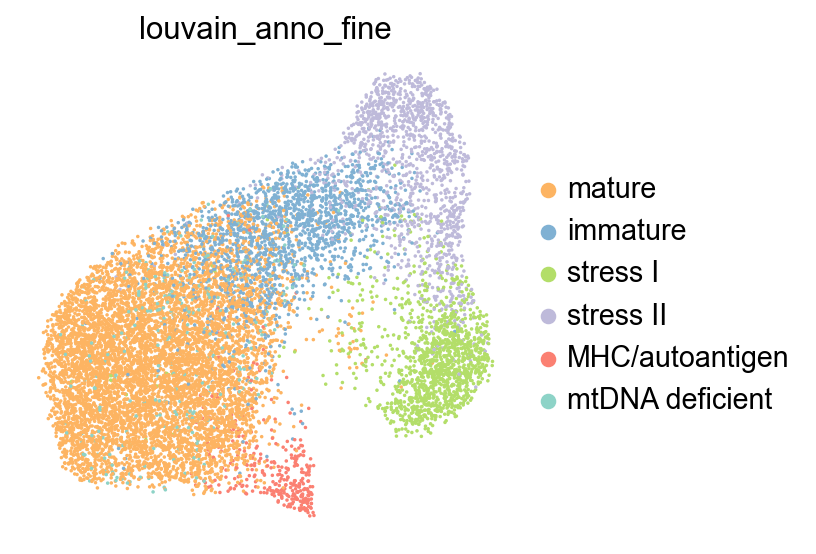

In [45]:
sc.set_figure_params(frameon=False)
# add colors and plot
human_comb_beta_g_scaled.uns['louvain_anno_fine_colors']=['#fdb462', '#80b1d3', '#b3de69', '#bebada', '#fb8072', '#8dd3c7']
sc.pl.umap(human_comb_beta_g_scaled, color='louvain_anno_fine')

In [46]:
# map pig to human embedding and annotate cells
sc.tl.ingest(pig_comb_beta_g_scaled, human_comb_beta_g_scaled , obs='louvain_anno_fine', neighbors_key='neighbors', )

In [47]:
# map mouse to human embedding and annotate cells
sc.tl.ingest(mouse_comb_beta_g_scaled, human_comb_beta_g_scaled , obs='louvain_anno_fine', neighbors_key='neighbors', )

In [48]:
# add colors
pig_comb_beta_g_scaled.uns['louvain_anno_fine_colors'] = human_comb_beta_g_scaled.uns['louvain_anno_fine_colors']
mouse_comb_beta_g_scaled.uns['louvain_anno_fine_colors'] = human_comb_beta_g_scaled.uns['louvain_anno_fine_colors']

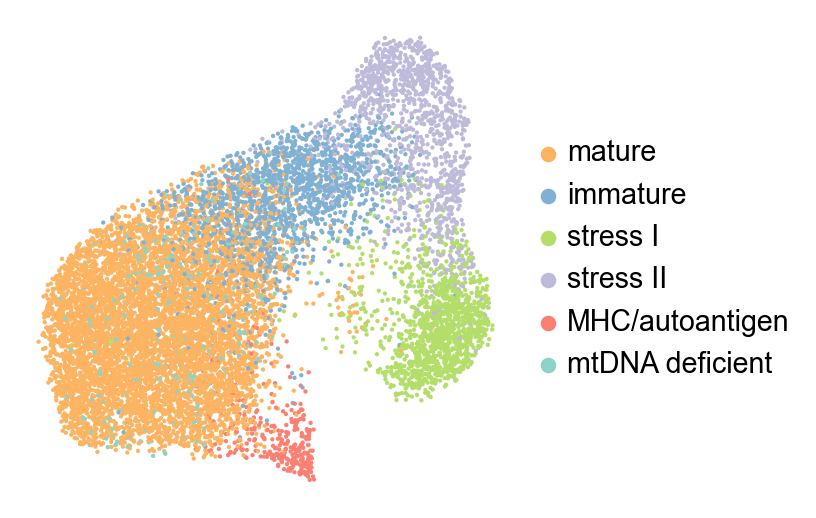

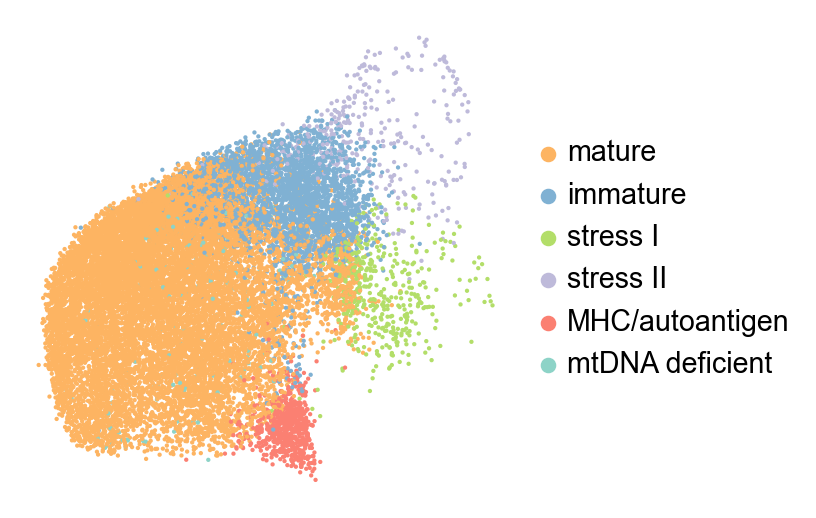

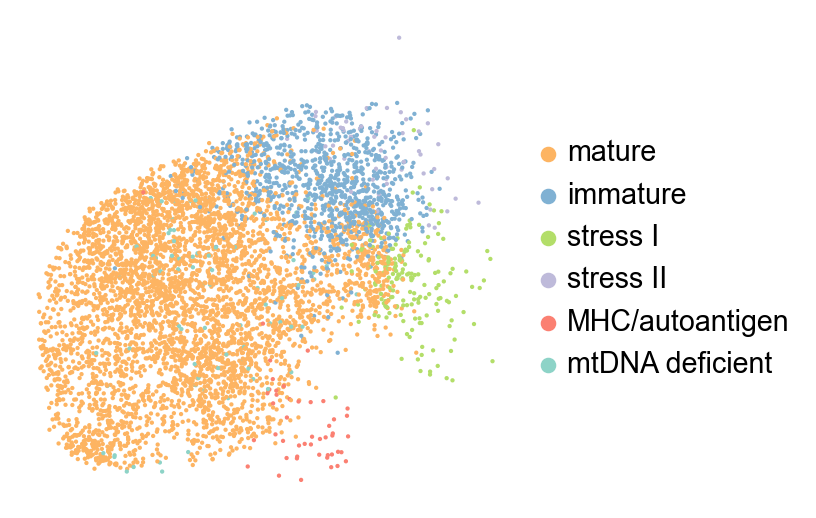

In [49]:
sc.pl.umap(human_comb_beta_g_scaled, color='louvain_anno_fine', size=15, title='')
sc.pl.umap(pig_comb_beta_g_scaled, color=['louvain_anno_fine'], size=15, title='')
sc.pl.umap(mouse_comb_beta_g_scaled, color=['louvain_anno_fine'], size=15, title='')

#### composition

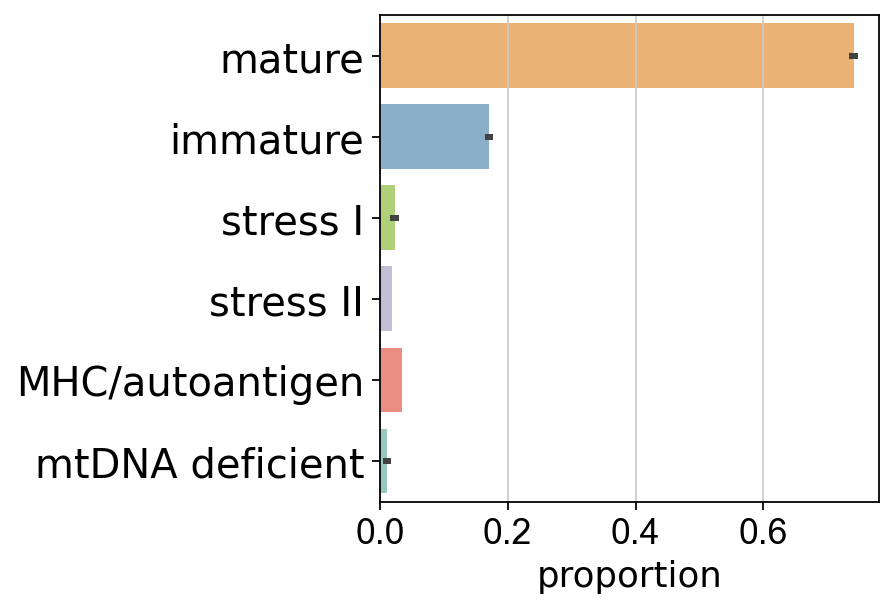

In [63]:
df = pig_comb_beta_g_scaled.obs[['louvain_anno_fine', 'donor']]

pl.subplots()
x = 'louvain_anno_fine'
hue = 'donor'
y = 'proportion'
prop_df = (df[x]
            .groupby(df[hue])
            .value_counts(normalize=True)
            .rename(y)
            .reset_index())

sns.barplot(x=y, y=x, data=prop_df,palette=pig_comb_beta_g_scaled.uns['louvain_anno_fine_colors'],orient='h')
pl.xticks(rotation=0,fontsize=16)
pl.yticks(rotation=0,fontsize=18,fontname='Helvetica Light')

pl.ylabel('')
pl.xlabel('proportion',fontsize=16,fontname='Helvetica Light')
#pl.tight_layout()
#pl.legend('')
#pl.savefig('/Users/stritschler/Documents/ICB/2020_10X_specied_comparison/human_islets/figures/beta_proportion.pdf',dpi=300)
pl.show()

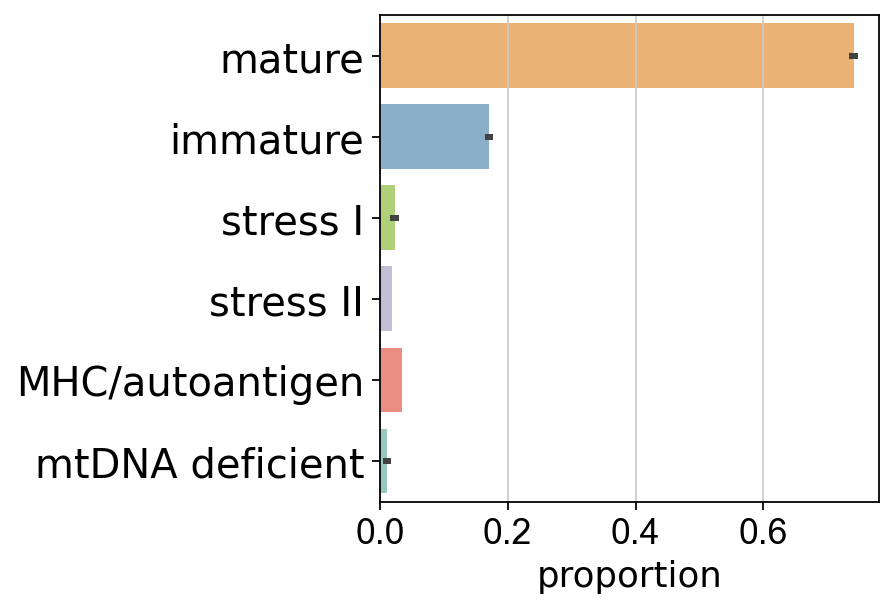

In [52]:
x1='louvain_anno_fine'
hue='donor'
y='proportion'
df = pd.crosstab(pig_comb_beta_g_scaled.obs[x1], pig_comb_beta_g_scaled.obs[hue], normalize=1)
df.index = df.index.tolist()
df.columns = df.columns.tolist()
prop_df = df.reset_index().melt(id_vars=['index'])


pl.subplots()
ax = sns.barplot(y='index', x='value', data=prop_df,palette = pig_comb_beta_g_scaled.uns['louvain_anno_fine_colors'], orient='h')
pl.xticks(rotation=0,fontsize=16)
pl.yticks(rotation=0,fontsize=18,fontname='Helvetica Light')
pl.ylabel('')
pl.xlabel('proportion',fontsize=16,fontname='Helvetica Light')
pl.show()

In [112]:
pig_comb_beta_g_scaled.obs['louvain_anno_fine'].value_counts()

mature             14095
immature            3258
MHC/autoantigen      662
stress I             444
stress II            352
mtDNA deficient      207
Name: louvain_anno_fine, dtype: int64

In [59]:
prop_df[['index', 'value']].groupby('index').mean()

,value
index,
MHC/autoantigen,0.034825
immature,0.171354
mature,0.741065
mtDNA deficient,0.010833
stress I,0.023409
stress II,0.018514


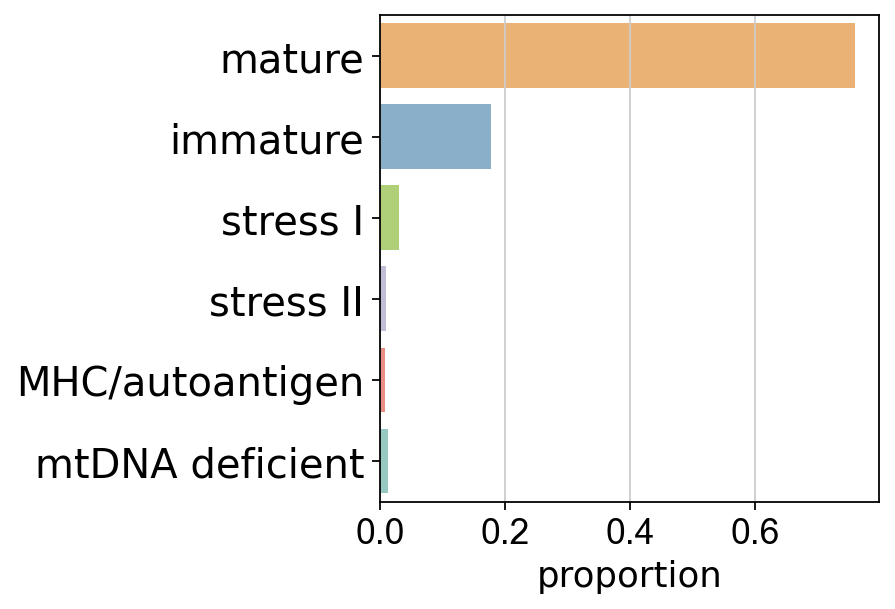

In [174]:
df=mouse_comb_beta_g_scaled.obs[['louvain_anno_fine']]

pl.subplots()
x='louvain_anno_fine'
y='proportion'
prop_df = (df[x]
            .value_counts(normalize=True)
            .rename(y)
            .reset_index())

sns.barplot(x='proportion', y='index', data=prop_df,palette=pig_comb_beta_g_scaled.uns['louvain_anno_fine_colors'],orient='h')
pl.xticks(rotation=0,fontsize=16)
pl.yticks(rotation=0,fontsize=18,fontname='Helvetica Light')

pl.ylabel('')
pl.xlabel('proportion',fontsize=16,fontname='Helvetica Light')
pl.show()

In [175]:
prop_df

,index,proportion
0,mature,0.760064
1,immature,0.177260
2,stress I,0.030720
3,mtDNA deficient,0.013595
4,stress II,0.010064
5,MHC/autoantigen,0.008298


In [111]:
mouse_comb_beta_g_scaled.obs['louvain_anno_fine'].value_counts()

mature             4305
immature           1004
stress I            174
mtDNA deficient      77
stress II            57
MHC/autoantigen      47
Name: louvain_anno_fine, dtype: int64

In [173]:
pig_comb_beta_g_scaled.obs['louvain_anno_fine'].value_counts()

mature             14095
immature            3258
MHC/autoantigen      662
stress I             444
stress II            352
mtDNA deficient      207
Name: louvain_anno_fine, dtype: int64

#### gene set activation

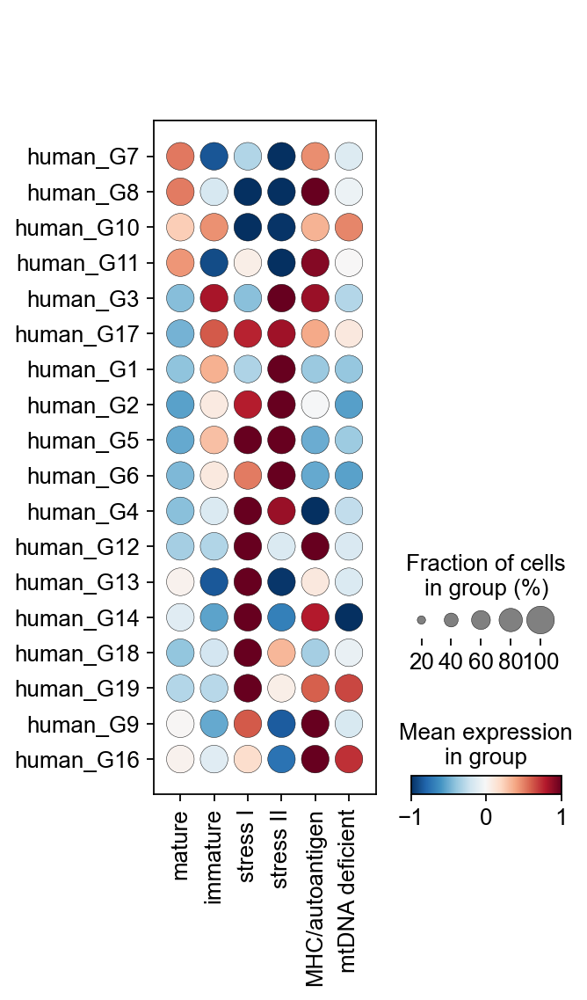

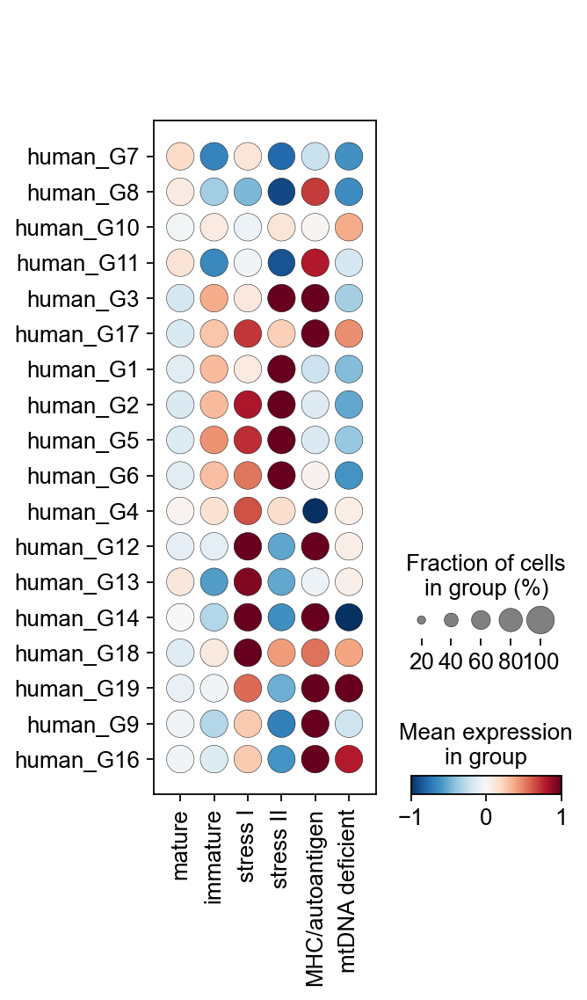

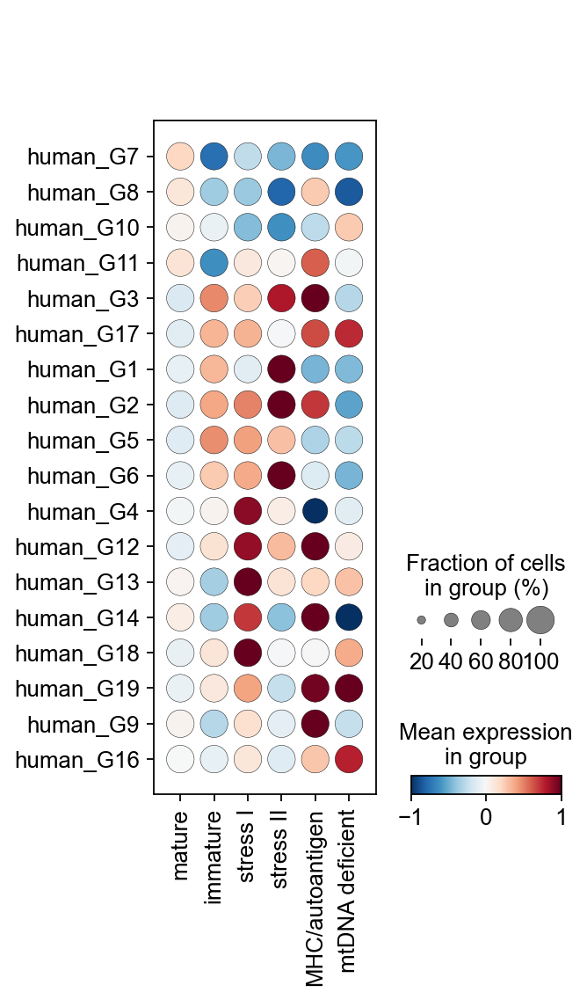

In [46]:
sc.pl.dotplot(human_comb_beta_g_scaled, groupby='louvain_anno_fine', 
              var_names=obs_g, swap_axes=True,  
              expression_cutoff=-3, vmax=1, vmin=-1, cmap='RdBu_r')
sc.pl.dotplot(pig_comb_beta_g_scaled, groupby='louvain_anno_fine', 
              var_names=obs_g, swap_axes=True,  
              expression_cutoff=-3, vmax=1, vmin=-1, cmap='RdBu_r')
sc.pl.dotplot(mouse_comb_beta_g_scaled, groupby='louvain_anno_fine', 
              var_names=obs_g, swap_axes=True,  
              expression_cutoff=-3, vmax=1, vmin=-1, cmap='RdBu_r')

#### marker gene expression

In [126]:
# add mappings to gene expression manifold
pig_comb.obs['louvain_anno_fine'] = pig_comb_beta_g_scaled.obs['louvain_anno_fine']
mouse_comb.obs['louvain_anno_fine'] = mouse_comb_beta_g_scaled.obs['louvain_anno_fine']

# pig_comb.obsm['X_umap'] = pig_comb_beta_g_scaled.obsm['X_umap']
# mouse_comb.obsm['X_umap'] = mouse_comb_beta_g_scaled.obsm['X_umap']

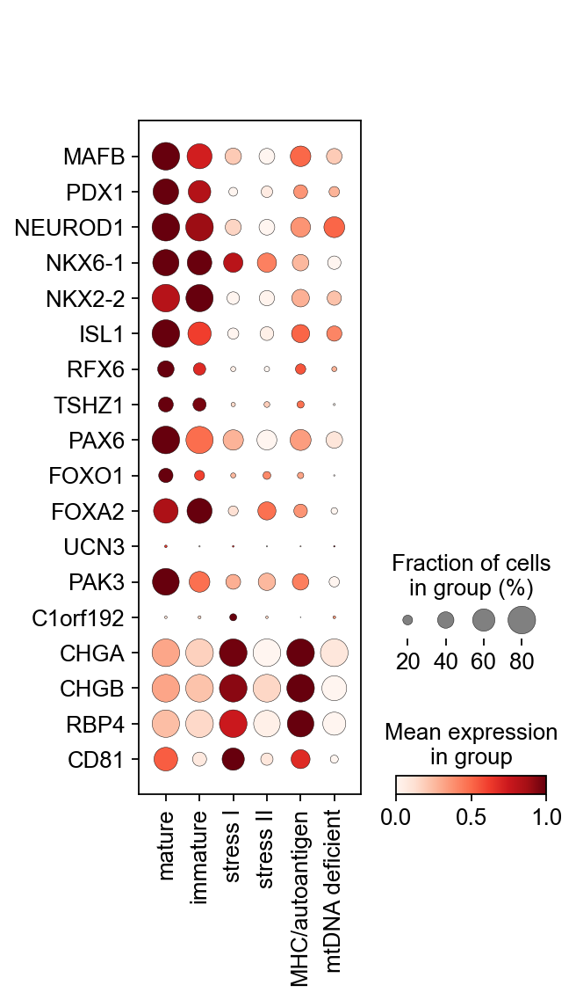

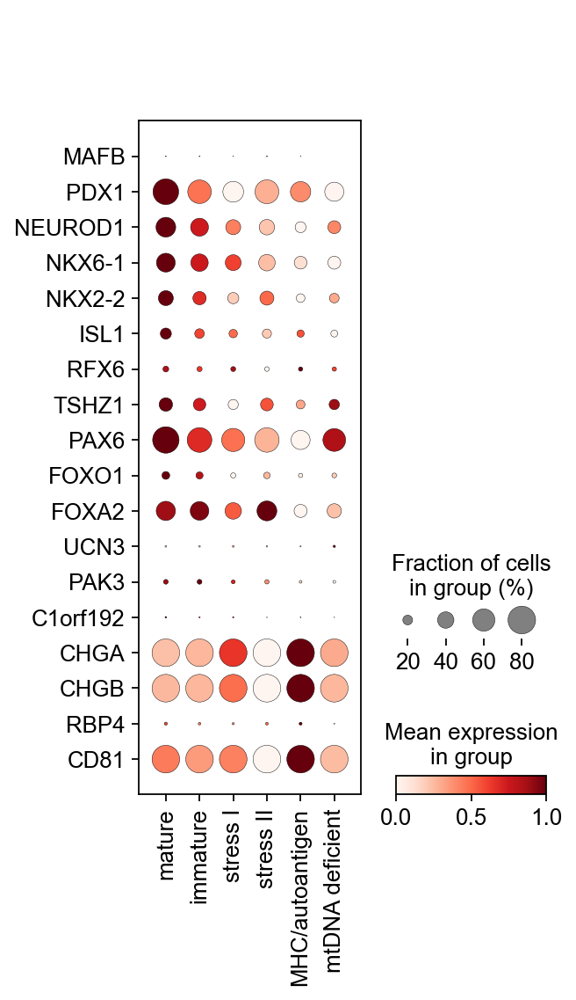

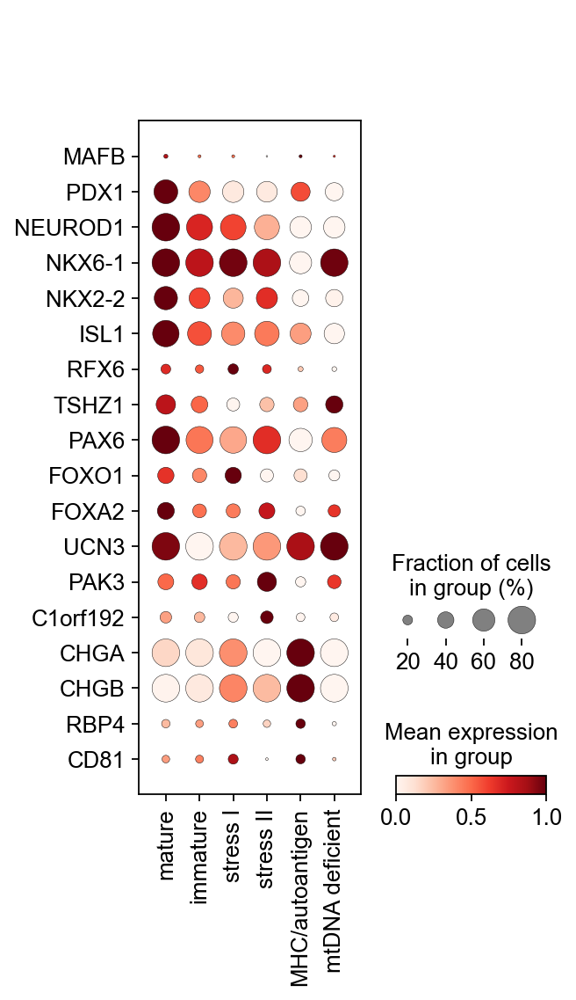

In [240]:
sc.pl.dotplot(human_comb, groupby='louvain_anno_fine',
              var_names=['MAFB', 'PDX1', 'NEUROD1', 'NKX6-1', 'NKX2-2', 'ISL1', 'RFX6', 
                         'TSHZ1', 'PAX6', 'FOXO1', 'FOXA2', 'UCN3', 'PAK3', 'C1orf192',
                         'CHGA', 'CHGB', 'RBP4', 'CD81'],
              standard_scale='var', dot_max=0.8, swap_axes=True)
sc.pl.dotplot(pig_comb, groupby='louvain_anno_fine',
              var_names=['MAFB', 'PDX1', 'NEUROD1', 'NKX6-1', 'NKX2-2', 'ISL1', 'RFX6', 
                         'TSHZ1', 'PAX6', 'FOXO1', 'FOXA2', 'UCN3', 'PAK3', 'C1orf192',
                         'CHGA', 'CHGB', 'RBP4', 'CD81'],
              standard_scale='var', dot_max=0.8, swap_axes=True)
sc.pl.dotplot(mouse_comb, groupby='louvain_anno_fine',
              var_names=['MAFB', 'PDX1', 'NEUROD1', 'NKX6-1', 'NKX2-2', 'ISL1', 'RFX6', 
                         'TSHZ1', 'PAX6', 'FOXO1', 'FOXA2', 'UCN3', 'PAK3', 'C1orf192',
                         'CHGA', 'CHGB', 'RBP4', 'CD81'],
              standard_scale='var', dot_max=0.8, swap_axes=True)

### Correlation of beta cell subtypes in PC space

In [55]:
adata_comb_beta = sc.pp.scale(human_comb, copy=True).concatenate(sc.pp.scale(pig_comb, copy=True), sc.pp.scale(mouse_comb, copy=True), batch_categories=['human', 'pig', 'mouse'])

In [64]:
sc.pp.highly_variable_genes(adata_comb_beta, n_top_genes=4000, flavor='cell_ranger')
sc.pp.pca(adata_comb_beta)

In [65]:
adata_comb_beta.obs['louvain_species'] = ['_'.join([a,b]) for a,b in zip(adata_comb_beta.obs.batch, adata_comb_beta.obs.louvain_anno_fine)]

In [115]:
%%time
genedf = sc.get.obs_df(
        adata_comb_beta,
        keys=['louvain_species'],
        obsm_keys=[('X_pca', i) for i in range(0,50)] #if i not in [1]]
    )
grouped = genedf.groupby('louvain_species')
mean_df = grouped.mean()

CPU times: user 48 ms, sys: 43.7 ms, total: 91.7 ms
Wall time: 132 ms


In [119]:
df_corr = mean_df.T.corr(method='pearson')

#### Clustering and heatmap 

In [120]:
human_comb.uns['louvain_anno_fine_colors']

array(['#fdb462', '#80b1d3', '#b3de69', '#bebada', '#fb8072', '#8dd3c7'],
      dtype=object)

/Users/stritschler/code/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: Use the colorbar set_ticks() method instead.
/Users/stritschler/code/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: Use the colorbar set_ticks() method instead.


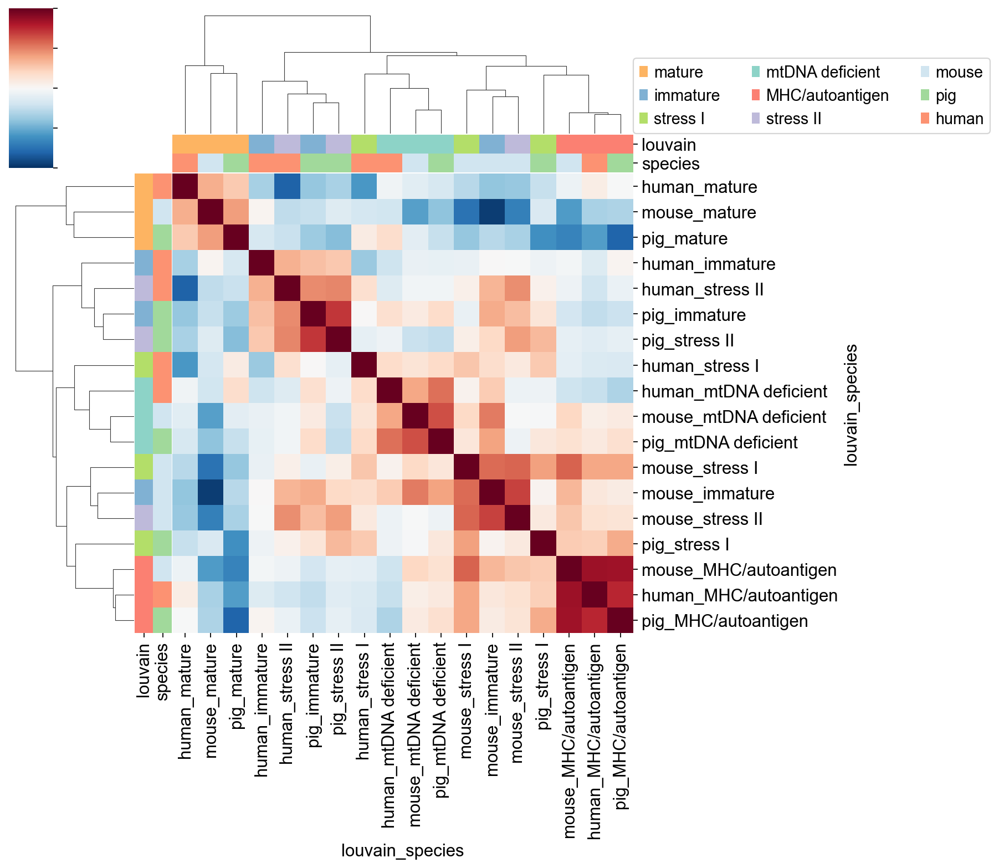

In [121]:
cols = pd.DataFrame(index = df_corr.index)
col_dict_1 = dict(zip(set(adata_comb_beta.obs.louvain_anno_fine.cat.categories), ['#fdb462', '#80b1d3', '#b3de69', '#8dd3c7',  '#fb8072','#bebada']))
cols['louvain'] = pd.DataFrame([g.split('_',1)[1] for g in mean_df.index], index=df_corr.index)[0].map(col_dict_1)
col_dict_2 = dict(zip(set(adata_comb_beta.obs.batch.cat.categories), ['#d1e5f0', '#a1d99b', '#fc9272' ]))
cols['species'] = pd.DataFrame([g.split('_')[0] for g in mean_df.index], index=df_corr.index)[0].map(col_dict_2)

g = sns.clustermap(df_corr,
               col_colors=cols,row_colors=cols, vmin=-1,vmax=1,
               cmap='RdBu_r')

for label in col_dict_1.keys():
    g.ax_col_dendrogram.bar(0, 0, color=col_dict_1[label],
                           label=label, linewidth=0)
for label in col_dict_2.keys():
    g.ax_col_dendrogram.bar(0, 0, color=col_dict_2[label],
                            label=label, linewidth=0)
    
g.cax.set_xticklabels([])
g.cax.set_yticklabels([])
g.cax.set_xticks([])
g.cax.set_yticks([])


g.ax_col_dendrogram.legend(loc=(1,0), ncol=3)

#### Graph representation

In [ ]:
# use paga functionality for plotting correlations
sc.pp.neighbors(adata_comb_beta)
sc.tl.paga(adata_comb_beta, groups='louvain_species')

In [194]:
adata_comb_beta.uns['paga']['connectivities'] = csr_matrix(df_corr.to_numpy().copy())

In [356]:
adata_comb_beta.uns['paga']['connectivities_low_thr'] = csr_matrix(df_corr.to_numpy()+0.1)

In [349]:
pos = np.array([[ 1.62191405,  1.52937668],
       [ 1.23332803,  1.009166 ],
       [ 0.07928282,  1.48927375],
       [-0.2287415, -2.88148255],#h
       [- 0.24961311, -0.50232758],#m
       [-1.0590353, -2.26346964],#p
       [-2.62506038, -1.43752191],#h
       [-2.58476716, -0.2336543 ],
       [-3.2529614 , -0.68265099],
       [ 3.34791657, -1.03029484],#h
       [ 2.51190543, -0.50126031],
       [ 2.51983171, -1.55057058],
       [ 0.85409415, -2.26346964],#h
       [-1.745026  , -0.93045428],
       [-0.0287415 , -1.63648541],
       [-0.24350365,  0.58598068],#h
       [-1.47740348,  0.02772971],
       [ 1.24261767,  0.02772971]])

In [350]:
human_comb_beta_g_scaled.uns['louvain_anno_fine_colors']

['#fdb462', '#80b1d3', '#b3de69', '#bebada', '#fb8072', '#8dd3c7']

In [351]:
adata_comb_beta.uns['louvain_species_colors'] = ['#fb8072','#fb8072','#fb8072',
                                                 '#80b1d3','#80b1d3','#80b1d3',
                                                 '#fdb462','#fdb462','#fdb462',
                                                 '#8dd3c7','#8dd3c7','#8dd3c7',
                                                 '#bebada','#bebada','#bebada',
                                                 '#b3de69','#b3de69','#b3de69']

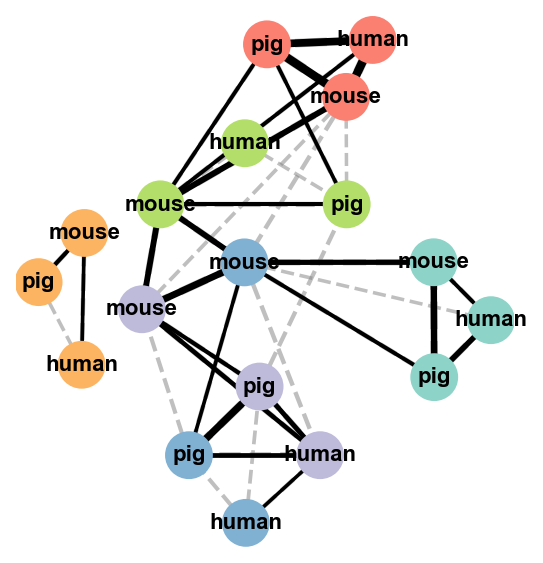

In [357]:
sc.pl.paga(adata_comb_beta, threshold=0.35, edge_width_scale=0.6, fontsize=10, dashed_edges='connectivities_low_thr',
           pos = pos, node_size_power=0, node_size_scale=3,
           labels=['human', 'mouse', 'pig', 'human', 'mouse', 'pig', 
                   'human', 'mouse', 'pig', 'human', 'mouse', 'pig', 
                   'human', 'mouse', 'pig', 'human', 'mouse', 'pig'])

### Conservation of gene sets

In [115]:
mk_human = pd.read_excel('./output_files/gene_sets_beta.xlsx')
gene_sets_map = {}
for col in mk_human.columns:
    gene_sets_map[f'G{col}'] = [gene for gene in mk_human[col] if gene in conv.human_symbol.tolist()]

In [116]:
gs_dict = {'mature': ['G7', 'G8', 'G10', 'G11'],
           'immature': ['G3', 'G17'],
           'stress II': ['G1', 'G2', 'G5', 'G6'],
           'stress I': ['G4', 'G12', 'G13', 'G14', 'G18', 'G19'],
           'MHC/autoantigen': ['G9', 'G16']}

In [117]:
gene_sets_louvain = {}
for key in gs_dict.keys():
    genes = []
    for gs in gs_dict[key]:
        genes = genes + gene_sets_map[gs]
        
    gene_sets_louvain[key] = genes

In [118]:
tfs = pd.read_csv('./data/TF_names_v_1.01_human.txt',sep='\t',header=None).unstack().tolist()

In [119]:
gene_sets_tf = {}
for key in gene_sets_map.keys():
    gene_sets_tf[key] = [tf for tf in gene_sets_map[key] if tf in tfs]

In [120]:
gene_sets_tf_louvain = {}

for key in gs_dict.keys():
    tfs = []
    for gs in gs_dict[key]:
        tfs = tfs + gene_sets_tf[gs]
        
    gene_sets_tf_louvain[key]=tfs

In [121]:
human_comb.obs['human_louvain_anno_fine'] = human_comb.obs['louvain_anno_fine']

In [127]:
expression_dict_beta_species={}

df = pd.DataFrame(index=human_comb.var_names, columns=human_comb.obs.louvain_anno_fine.cat.categories)
for key in human_comb.obs.louvain_anno_fine.cat.categories:
    human_sub = human_comb[human_comb.obs.louvain_anno_fine.isin([key])].copy()
    genes = (human_sub.X > 0).sum(0) / human_sub.n_obs
    df[key] = genes.A1
expression_dict_beta_species['human'] = df

df = pd.DataFrame(index=pig_comb.var_names, columns=pig_comb.obs.louvain_anno_fine.cat.categories)
for key in pig_comb.obs.louvain_anno_fine.cat.categories:
    pig_sub = pig_comb[pig_comb.obs.louvain_anno_fine.isin([key])].copy()
    genes = (pig_sub.X > 0).sum(0) / pig_sub.n_obs
    df[key] = genes.A1
expression_dict_beta_species['pig'] = df 

df = pd.DataFrame(index=mouse_comb.var_names, columns=mouse_comb.obs.louvain_anno_fine.cat.categories)
for key in mouse_comb.obs.louvain_anno_fine.cat.categories:
    mouse_sub = mouse_comb[mouse_comb.obs.louvain_anno_fine.isin([key])].copy()
    genes = (mouse_sub.X > 0).sum(0) / mouse_sub.n_obs
    df[key] = genes.A1
expression_dict_beta_species['mouse'] = df

In [128]:
tfs_mapped = [tf for tf in tfs if tf in human_comb.var_names]

In [129]:
gene_set_conservation_dict = {}

for key in ['mature', 'immature', 'stress I', 'stress II', 'MHC/autoantigen']:

    genes_human = gene_sets_louvain[key]
    df = pd.DataFrame(index=genes_human, columns=['mouse', 'pig'])  
    
    
    detected = expression_dict_beta_species['pig']>0.05
    detected = detected.index[detected.any(axis=1)].tolist()
    
    detected_key = expression_dict_beta_species['pig']>0.05
    detected_key = detected_key.index[detected_key[key]].tolist()
    
    df['pig'] = ['conserved' if gene in detected_key else
                 'loss' if gene in detected else
                 'not detected' for gene in genes_human]
    
    detected = expression_dict_beta_species['mouse']>0.05
    detected = detected.index[detected.any(axis=1)].tolist()
    
    detected_key = expression_dict_beta_species['mouse']>0.05
    detected_key = detected_key.index[detected_key[key]].tolist()
    
    df['mouse'] = ['conserved' if gene in detected_key else
                   'loss' if gene in detected else
                   'not detected' for gene in genes_human]
    
    gene_set_conservation_dict[key]=df


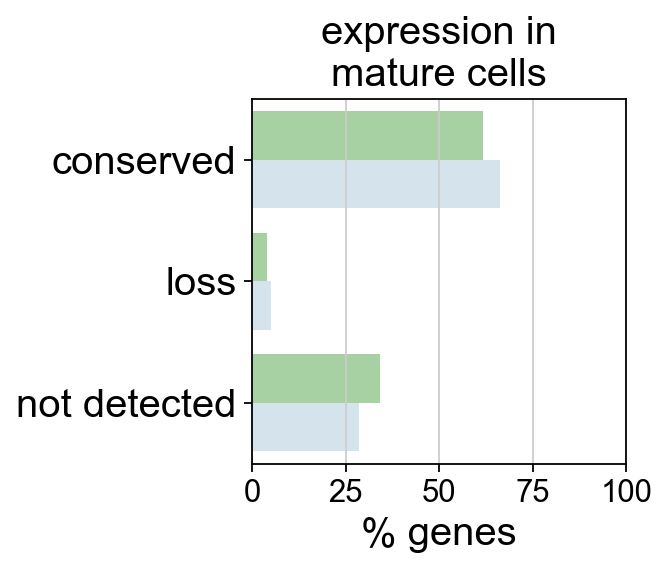

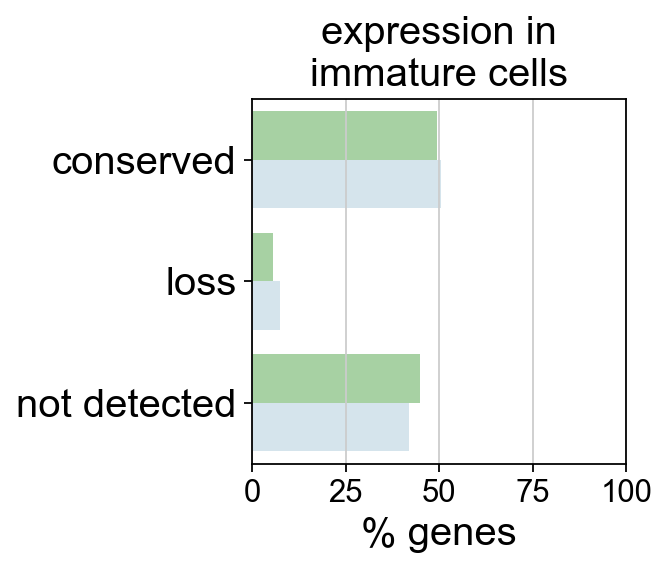

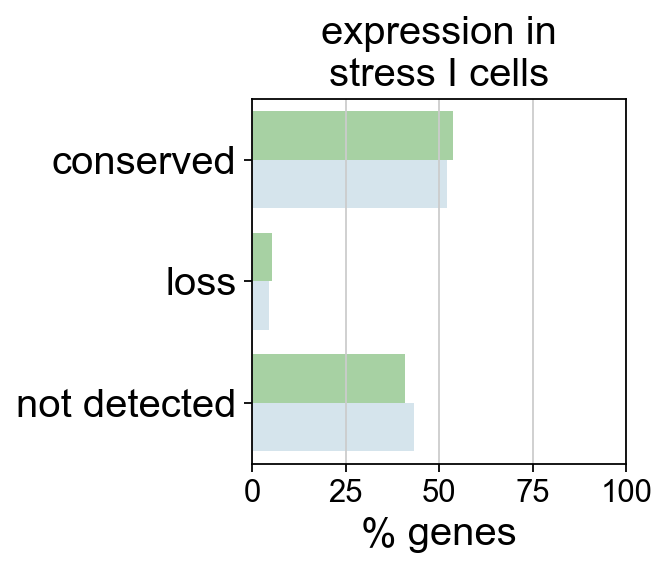

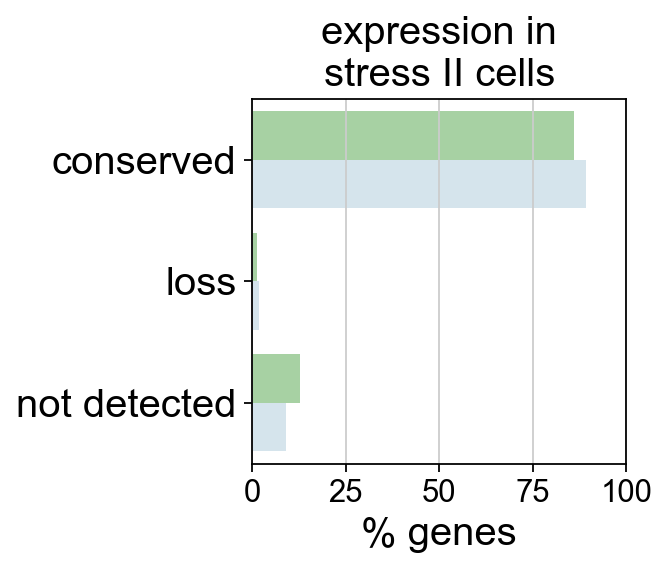

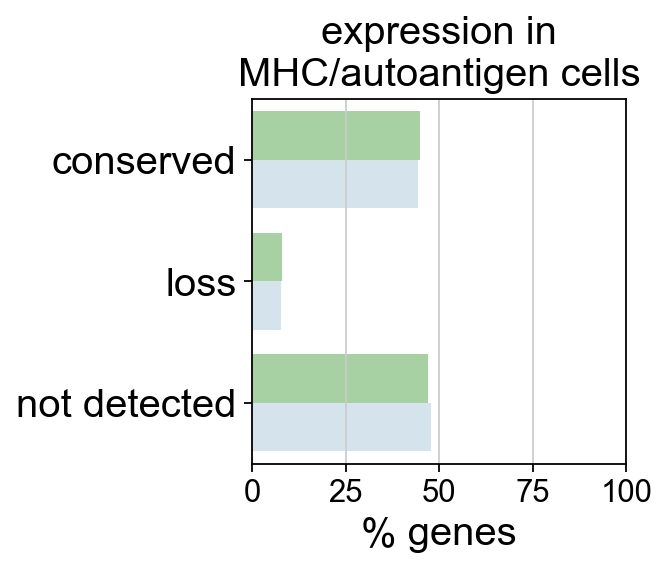

In [70]:
for key in ['mature', 'immature', 'stress I', 'stress II', 'MHC/autoantigen']:
    df_bar = gene_set_conservation_dict[key][['pig', 'mouse']].melt()

    f, ax = pl.subplots(figsize=(3, 3))
    y='% genes'
    prop_df = (df_bar['value']
                        .groupby(df_bar['variable'])
                        .value_counts(normalize=True)
                        .rename(y)
                        .reset_index())
    prop_df[y] = prop_df[y]*100

    sns.barplot(x=y, y="value", data=prop_df, hue='variable', order=['conserved', 'loss', 'not detected'], hue_order=['pig', 'mouse'], palette=['#a1d99b','#d1e5f0'])
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=18)
    #ax.set_xticklabels([0,20,40,60,80], fontsize=18)
    ax.legend().remove()
    pl.ylabel('')
    pl.xlabel('% genes', fontsize=18)
    pl.xlim([0,100])
    pl.title(f'expression in\n{key} cells', fontsize=18)

### Expression of selected genes

In [302]:
pig_beta_all = sc.read('../data/adata_beta_pig.h5ad')
pig_beta_all.var_names = ['WNT4' if var in ['ENSSSCG00000003521'] else var for var in pig_all.var_names]

In [304]:
pig_beta_all.obs['louvain_anno_fine'] = pig_comb_beta_g_scaled.obs['louvain_anno_fine']
pig_beta_all.obsm['X_umap'] = pig_comb_beta_g_scaled.obsm['X_umap']

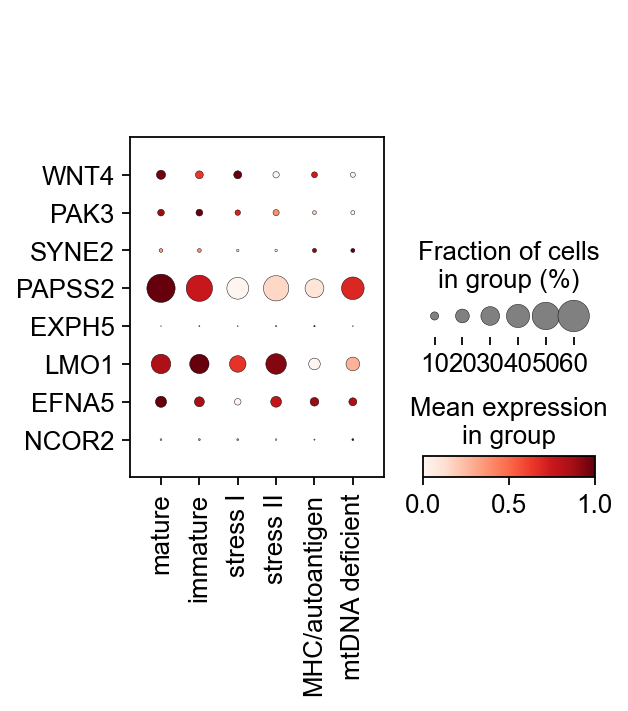

In [305]:
sc.pl.dotplot(pig_beta_all, groupby='louvain_anno_fine',
              var_names=['WNT4', 'PAK3', 'SYNE2', 'PAPSS2', 'EXPH5', 'LMO1', 'EFNA5', 'NCOR2'],
              standard_scale='var', dot_max=0.6, swap_axes=True) #'MAFA', 'MNX1','WNT4', 'BMP5', 'C1orf192',

In [296]:
mouse_beta_all = sc.read('../mouse_islets/data/mouse_beta.h5ad')
mouse_all = sc.read('../mouse_islets/data/mouse_all.h5ad')

In [297]:
mouse_beta_all.obs['louvain_anno_fine'] = mouse_comb_beta_g_scaled.obs['louvain_anno_fine']
mouse_beta_all.obsm['X_umap'] = mouse_comb_beta_g_scaled.obsm['X_umap']

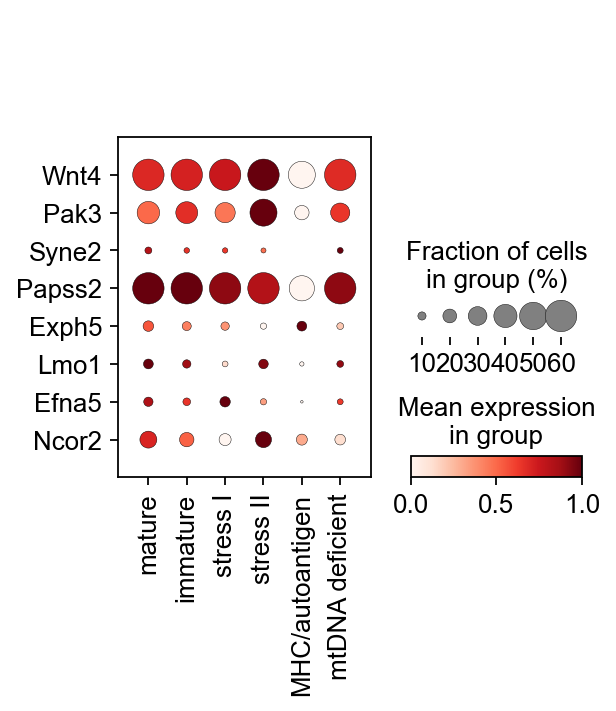

In [298]:
genes=['Wnt4', 'Pak3', 'Syne2', 'Papss2', 'Exph5', 'Lmo1', 'Efna5', 'Ncor2']
sc.pl.dotplot(mouse_beta_all, groupby='louvain_anno_fine', var_names=genes, standard_scale='var', dot_max=0.6, swap_axes=True)

In [299]:
human_beta_all = sc.read('./data/adata_human_beta.h5ad')
human_beta_all.obsm['X_umap'] = human_comb_beta_g_scaled.obsm['X_umap']

In [300]:
human_all = sc.read('./data/adata_human_endo.h5ad')

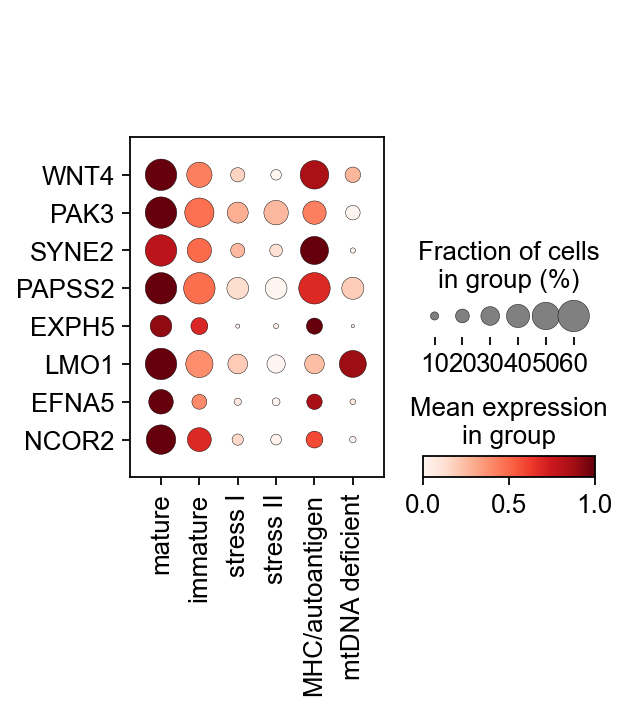

In [301]:
genes=['WNT4', 'PAK3', 'SYNE2', 'PAPSS2', 'EXPH5', 'LMO1', 'EFNA5', 'NCOR2']
sc.pl.dotplot(human_beta_all, groupby='louvain_anno_fine', var_names=genes, standard_scale='var', dot_max=0.6, swap_axes=True)

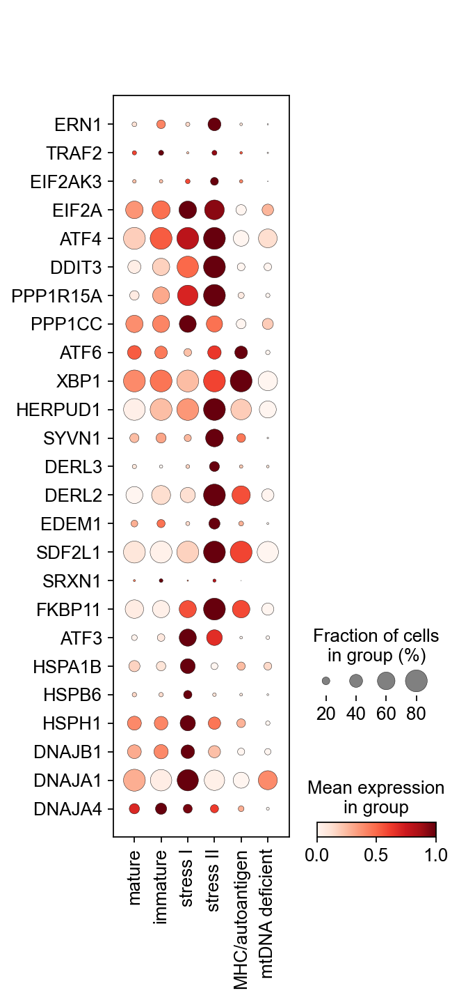

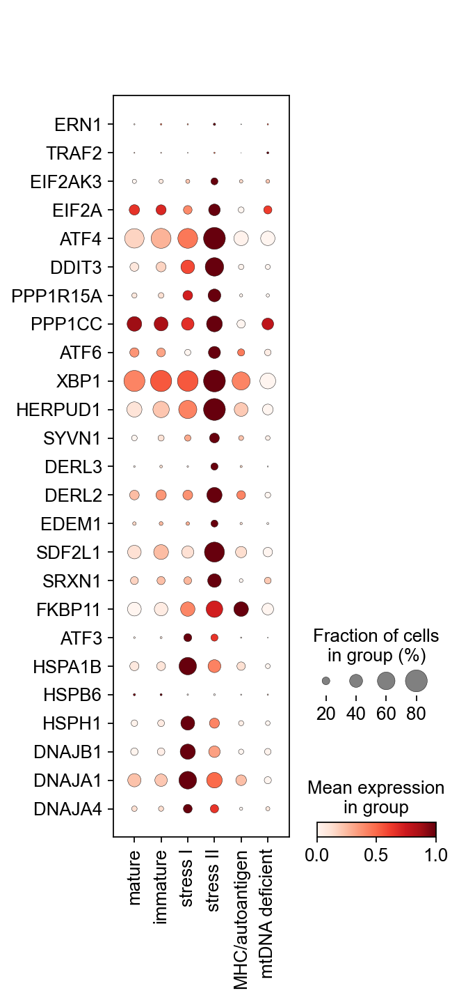

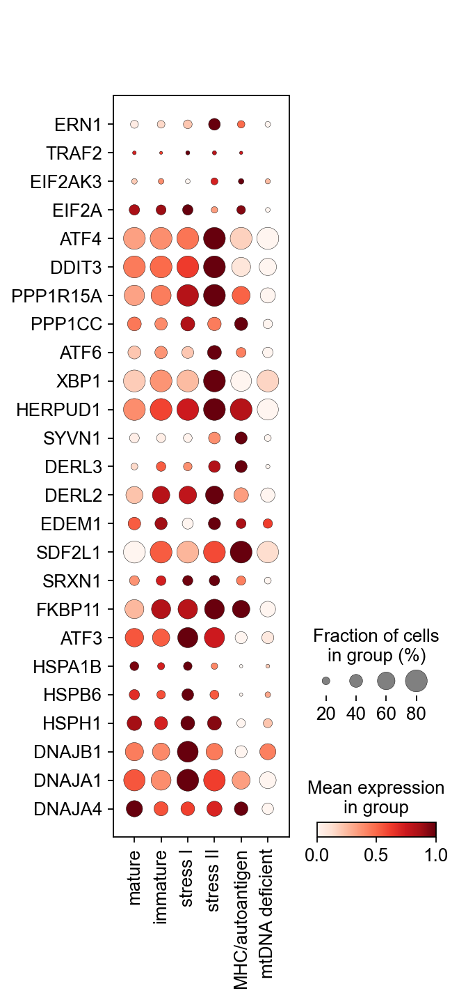

In [379]:
stress_genes = ['ERN1', 'TRAF2', 'EIF2AK3', 'EIF2A', 'ATF4', 'DDIT3', 'PPP1R15A', 'PPP1CC', 'ATF6', 'XBP1', 
                'HERPUD1', 'SYVN1', 'DERL3', 'DERL2', 'EDEM1', 'SDF2L1', 'SRXN1', 'FKBP11', 'ATF3', 'HSPA1B', 
                'HSPB6', 'HSPH1', 'DNAJB1', 'DNAJA1', 'DNAJA4']
sc.pl.dotplot(human_comb, groupby='louvain_anno_fine', var_names=stress_genes,  dot_max=0.8, standard_scale='var', swap_axes=True)
sc.pl.dotplot(pig_comb, groupby='louvain_anno_fine', var_names=stress_genes, dot_max=0.8, standard_scale='var', swap_axes=True)
sc.pl.dotplot(mouse_comb, groupby='louvain_anno_fine', var_names=stress_genes, dot_max=0.8, standard_scale='var', swap_axes=True)

## Alpha cells

### Subset data to mappable genes and scaling

In [21]:
human_alpha = sc.read('./data/adata_human_alpha.h5ad')
pig_alpha = sc.read('../pig_islets/data/adata_pig_endo.h5ad')
pig_alpha = pig_alpha[pig_alpha.obs.louvain_anno_broad.isin(['alpha'])].copy()
mouse_alpha = sc.read('../mouse_islets/data/mouse_all.h5ad')
mouse_alpha = mouse_alpha[mouse_alpha.obs.louvain_anno_broad.isin(['alpha'])].copy()

In [22]:
conv = pd.read_csv('./BED_mapping_genes.csv')

In [23]:
conv = conv.loc[[gene in human_alpha.var_names for gene in conv['human_symbol']]]
conv = conv.loc[[gene in pig_alpha.var_names for gene in conv['pig_symbol']]]
conv = conv.loc[[gene in mouse_alpha.var_names for gene in conv['mouse_symbol']]]

In [24]:
human_comb_alpha = human_alpha[:,conv['human_symbol'].tolist()].copy()

In [25]:
human_comb_alpha.var_names

Index(['MT-ND1', 'MT-ND2', 'MT-CO1', 'MT-CO2', 'MT-ATP8', 'MT-ATP6', 'MT-CO3',
       'MT-ND3', 'MT-ND4L', 'MT-ND4',
       ...
       'BACH1', 'FAM83H-AS1', 'FAM53C', 'GTPBP10', 'SUMF1', 'BCAR3', 'SMIM8',
       'PDE10A', 'ST7', 'AHSA2'],
      dtype='object', name='index', length=11319)

In [26]:
pig_comb_alpha = pig_alpha[:,conv['pig_symbol'].tolist()].copy()
pig_comb_alpha.var_names

Index(['ND1', 'ND2', 'COX1', 'COX2', 'ATP8', 'ATP6', 'COX3', 'ND3', 'ND4L',
       'ND4',
       ...
       'BACH1', 'IQANK1', 'FAM53C', 'ENSSSCG00000015305', 'SUMF1', 'BCAR3',
       'SMIM8', 'PDE10A', 'ST7', 'ENSSSCG00000008383'],
      dtype='object', name='index', length=11319)

In [27]:
mouse_comb_alpha = mouse_alpha[:,conv['mouse_symbol'].tolist()].copy()
mouse_comb_alpha.var_names

Index(['mt-Nd1', 'mt-Nd2', 'mt-Co1', 'mt-Co2', 'mt-Atp8', 'mt-Atp6', 'mt-Co3',
       'mt-Nd3', 'mt-Nd4l', 'mt-Nd4',
       ...
       'Bach1', 'K230010J24Rik', 'Fam53c', 'Gtpbp10', 'Sumf1', 'Bcar3',
       'Smim8', 'Pde10a', 'St7', 'Ahsa2'],
      dtype='object', name='index', length=11319)

In [28]:
pig_comb_alpha.var_names = human_comb_alpha.var_names
mouse_comb_alpha.var_names = human_comb_alpha.var_names

In [29]:
human_comb_alpha_scaled = sc.pp.scale(human_comb_alpha, copy=True)
pig_comb_alpha_scaled = sc.pp.scale(pig_comb_alpha, copy=True)
mouse_comb_alpha_scaled = sc.pp.scale(mouse_comb_alpha, copy=True)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [30]:
sc.pp.pca(human_comb_alpha_scaled)
sc.pp.neighbors(human_comb_alpha_scaled)
sc.tl.umap(human_comb_alpha_scaled)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50


/Users/stritschler/code/miniconda3/lib/python3.7/site-packages/numba/np/ufunc/parallel.py:355: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 11000. The TBB threading layer is disabled.
  warnings.warn(problem)


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


### Mapping to human alpha cell gene set space

In [32]:
mk_human = pd.read_excel('./output_files/gene_sets_alpha.xlsx')
mk_human_map = {}
for col in mk_human.columns:
    #mk_human_map[col] = [gene if gene in conv.human_symbol.tolist() else '-' for gene in mk_human[col]]
    mk_human_map[col] = [gene for gene in mk_human[col] if gene in conv.human_symbol.tolist()]


In [33]:
sc.settings.verbosity=1
for key in mk_human_map.keys():
    sc.tl.score_genes(human_comb_alpha, gene_list=[gene for gene in mk_human_map[key] if gene in human_comb_alpha.var_names], score_name=f'human_G{key}')
    sc.tl.score_genes(pig_comb_alpha, gene_list=[gene for gene in mk_human_map[key] if gene in pig_comb_alpha.var_names], score_name=f'human_G{key}')
    sc.tl.score_genes(mouse_comb_alpha, gene_list=[gene for gene in mk_human_map[key] if gene in mouse_comb_alpha.var_names], score_name=f'human_G{key}')

In [34]:
sc.set_figure_params()

In [35]:
# sorted gene sets
obs_g = ['_'.join(['human',a]) for a in ['G7', 'G8', 'G12', 'G13', 'G3', 'G4', 'G2', 'G5', 'G1', 'G6', 'G14', 'G10']]

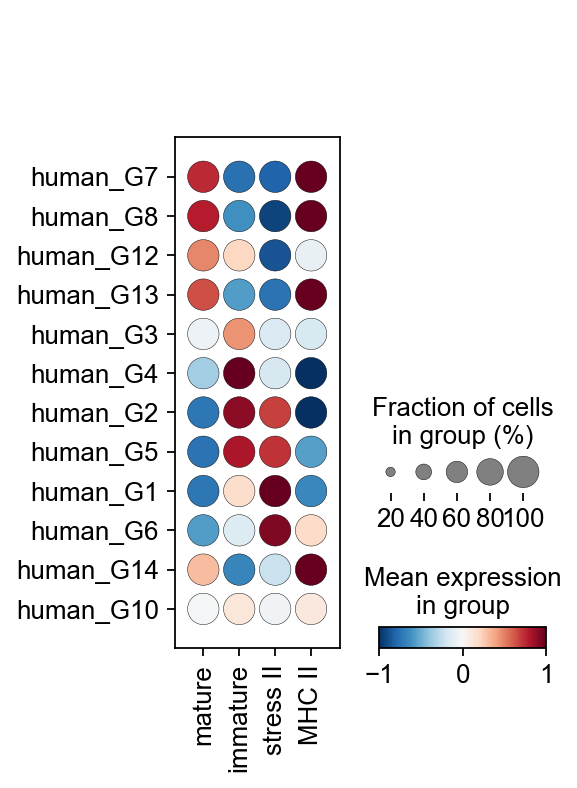

In [36]:
human_comb_alpha_g = sc.AnnData(human_comb_alpha.obs[obs_g])
human_comb_alpha_g.obs = human_comb_alpha.obs
sc.pl.dotplot(sc.pp.scale(human_comb_alpha_g, copy=True), groupby='louvain_anno_fine', 
              var_names=human_comb_alpha_g.var_names, swap_axes=True,  
              expression_cutoff=-3, vmax=1, vmin=-1, cmap='RdBu_r')

In [37]:
pig_comb_alpha_g = sc.AnnData(pig_comb_alpha.obs[obs_g])
pig_comb_alpha_g.obs = pig_comb_alpha.obs

In [38]:
mouse_comb_alpha_g = sc.AnnData(mouse_comb_alpha.obs[obs_g])
mouse_comb_alpha_g.obs = mouse_comb_alpha.obs

In [39]:
human_comb_alpha_g_scaled = sc.pp.scale(human_comb_alpha_g, copy=True)
pig_comb_alpha_g_scaled = sc.pp.scale(pig_comb_alpha_g, copy=True)
mouse_comb_alpha_g_scaled = sc.pp.scale(mouse_comb_alpha_g, copy=True)

In [40]:
human_comb_alpha_g_scaled.uns['louvain_anno_fine_colors']=['#fdb462', '#80b1d3', '#bebada', '#fb8072', '#8dd3c7']
pig_comb_alpha_g_scaled.uns['louvain_anno_fine_colors'] = ['#fdb462', '#80b1d3', '#bebada', '#fb8072', '#b15928']
mouse_comb_alpha_g_scaled.uns['louvain_anno_fine_colors'] = ['#fdb462', '#80b1d3', '#bebada', '#fb8072']

In [41]:
sc.pp.pca(human_comb_alpha_g_scaled)
sc.pp.neighbors(human_comb_alpha_g_scaled)
sc.tl.umap(human_comb_alpha_g_scaled)

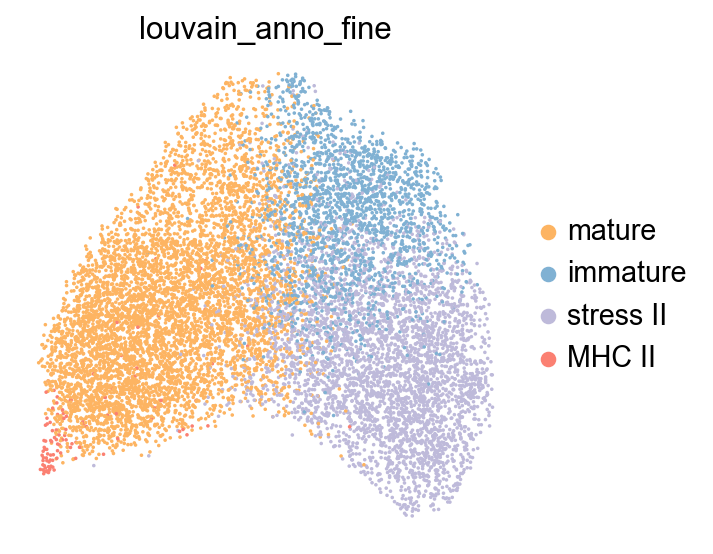

In [42]:
sc.set_figure_params(frameon=False)
sc.pl.umap(human_comb_alpha_g_scaled, color='louvain_anno_fine')

In [43]:
sc.tl.ingest(pig_comb_alpha_g_scaled, human_comb_alpha_g_scaled , obs='louvain_anno_fine', neighbors_key='neighbors')

In [44]:
sc.tl.ingest(mouse_comb_alpha_g_scaled, human_comb_alpha_g_scaled , obs='louvain_anno_fine', neighbors_key='neighbors')

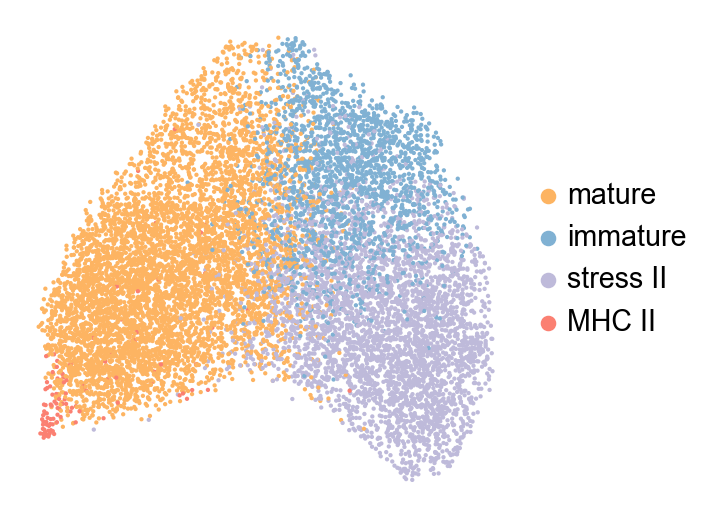

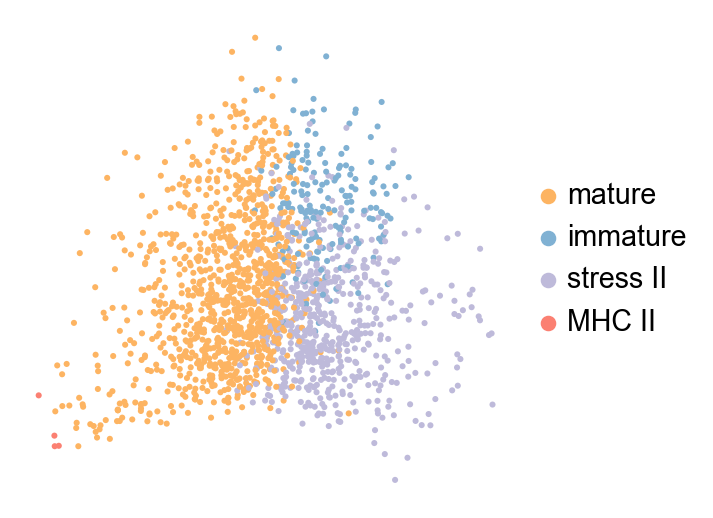

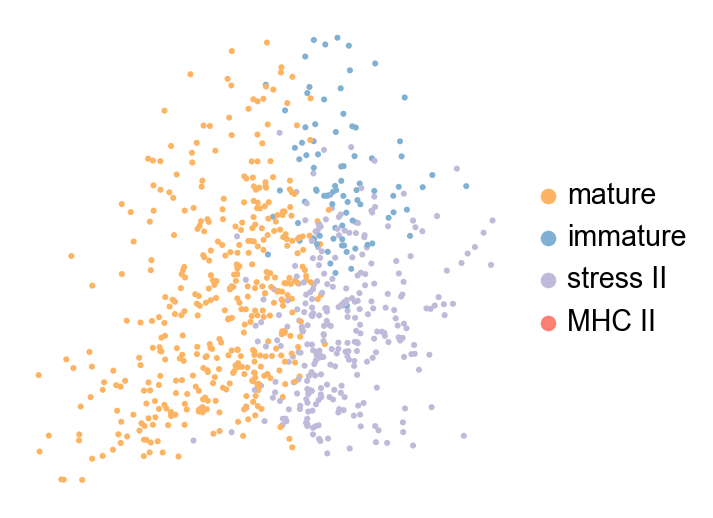

In [45]:
sc.pl.umap(human_comb_alpha_g_scaled, color='louvain_anno_fine', size=15, title='')
sc.pl.umap(pig_comb_alpha_g_scaled, color=['louvain_anno_fine'], size=30, title='')
sc.pl.umap(mouse_comb_alpha_g_scaled, color=['louvain_anno_fine'], size=30, title='')

findfont: Font family ['Helvetica Light'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica Light'] not found. Falling back to DejaVu Sans.


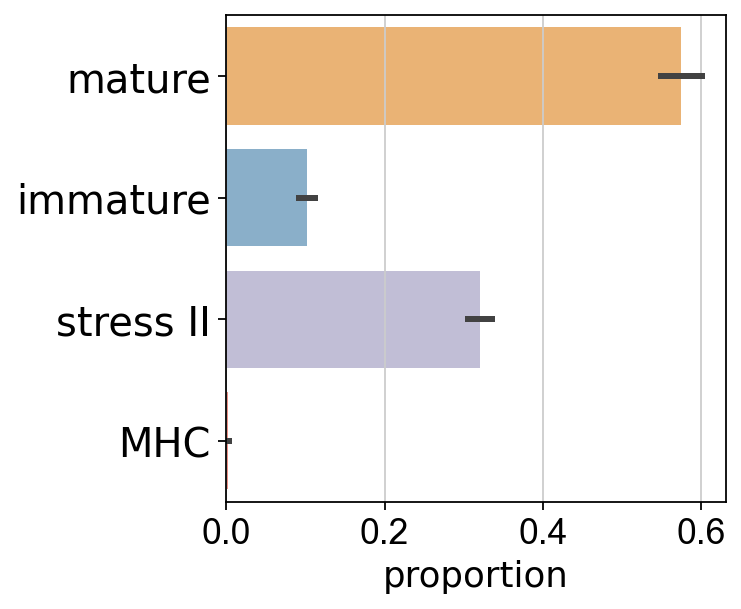

In [46]:
x1='louvain_anno_fine'
hue='donor'
y='proportion'
df = pd.crosstab(pig_comb_alpha_g_scaled.obs[x1], pig_comb_alpha_g_scaled.obs[hue], normalize=1)
df.index = df.index.tolist()
df.columns = df.columns.tolist()
prop_df = df.reset_index().melt(id_vars=['index'])

pl.subplots()

ax = sns.barplot(y='index', x='value', data=prop_df,palette = pig_comb_alpha_g_scaled.uns['louvain_anno_fine_colors'], orient='h')
ax.set_yticklabels(['mature', 'immature', 'stress II', 'MHC'])
pl.xticks(rotation=0,fontsize=16)
pl.yticks(rotation=0,fontsize=18,fontname='Helvetica Light')

pl.ylabel('')
pl.xlabel('proportion',fontsize=16,fontname='Helvetica Light')
#pl.tight_layout()
#pl.legend('')
#pl.savefig('/Users/stritschler/Documents/ICB/2020_10X_specied_comparison/human_islets/figures/beta_proportion.pdf',dpi=300)
pl.show()

In [47]:
prop_df

,index,variable,value
0,mature,01,0.549744
1,immature,01,0.111795
2,stress II,01,0.335385
3,MHC II,01,0.003077
4,mature,02,0.600912
5,immature,02,0.092360
6,stress II,02,0.305587
7,MHC II,02,0.001140


In [48]:
mouse_comb_alpha_g_scaled.obs['louvain_anno_fine'].cat.remove_unused_categories(inplace=True)

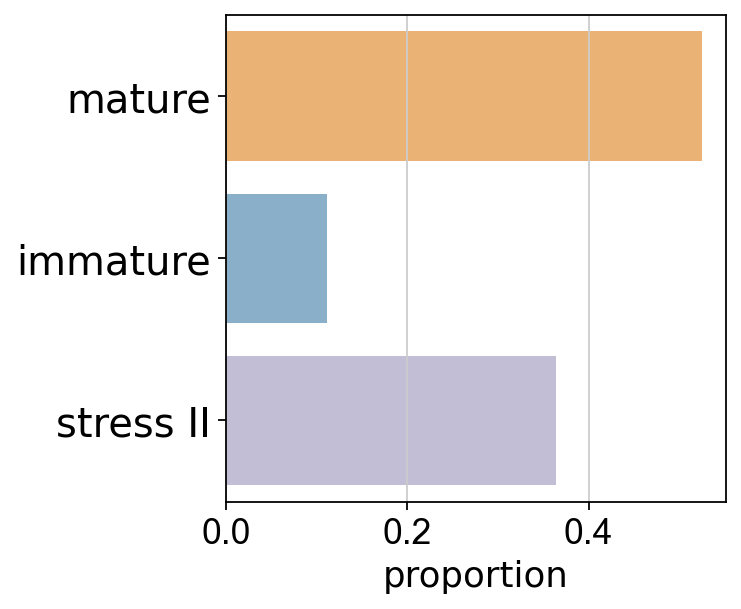

In [49]:
df=mouse_comb_alpha_g_scaled.obs[['louvain_anno_fine']]

pl.subplots()
x='louvain_anno_fine'
y='proportion'
prop_df = (df[x]
            .value_counts(normalize=True)
            .rename(y)
            .reset_index())

sns.barplot(x='proportion', y='index', data=prop_df,palette=pig_comb_alpha_g_scaled.uns['louvain_anno_fine_colors'],orient='h')
pl.xticks(rotation=0,fontsize=16)
pl.yticks(rotation=0,fontsize=18,fontname='Helvetica Light')

pl.ylabel('')
pl.xlabel('proportion',fontsize=16,fontname='Helvetica Light')
#pl.tight_layout()
#pl.legend('')
#pl.savefig('/Users/stritschler/Documents/ICB/2020_10X_specied_comparison/human_islets/figures/beta_proportion.pdf',dpi=300)
pl.show()

In [220]:
human_comb_alpha_g_scaled_sub = human_comb_alpha_g_scaled[np.invert(human_comb_alpha_g_scaled.obs.louvain_anno_fine.isin(['MHC II']))].copy()
pig_comb_alpha_g_scaled_sub = pig_comb_alpha_g_scaled[np.invert(pig_comb_alpha_g_scaled.obs.louvain_anno_fine.isin(['MHC II']))].copy()

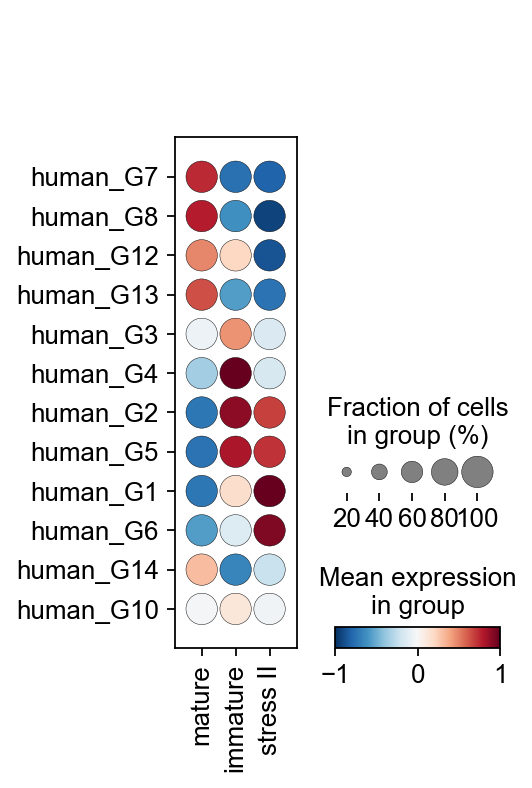

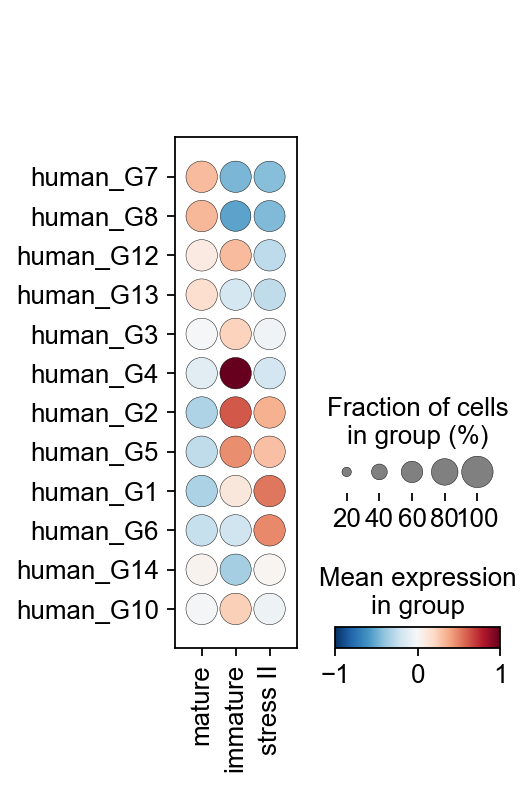

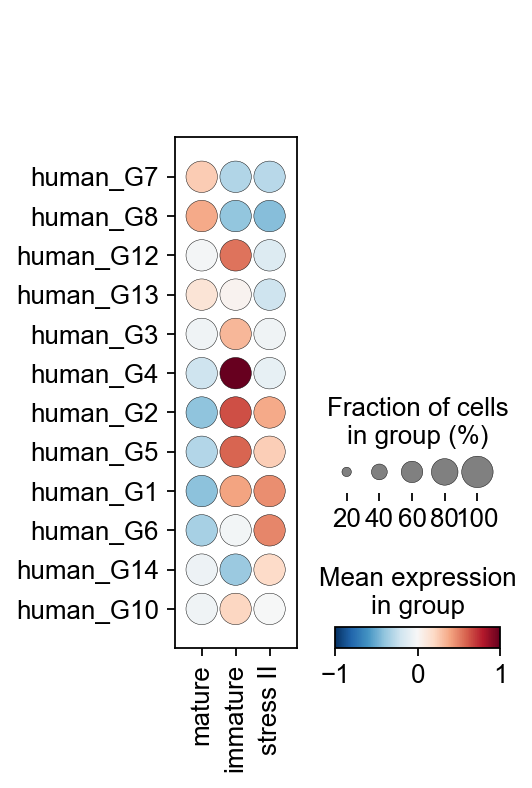

In [221]:
sc.pl.dotplot(human_comb_alpha_g_scaled_sub, groupby='louvain_anno_fine', 
              var_names=obs_g, swap_axes=True,  
              expression_cutoff=-3, vmax=1, vmin=-1, cmap='RdBu_r')
sc.pl.dotplot(pig_comb_alpha_g_scaled_sub, groupby='louvain_anno_fine', 
              var_names=obs_g, swap_axes=True,  
              expression_cutoff=-3, vmax=1, vmin=-1, cmap='RdBu_r')
sc.pl.dotplot(mouse_comb_alpha_g_scaled, groupby='louvain_anno_fine', 
              var_names=obs_g, swap_axes=True,  
              expression_cutoff=-3, vmax=1, vmin=-1, cmap='RdBu_r')

In [106]:
pig_comb_alpha.obs['louvain_anno_fine'] = pig_comb_alpha_g_scaled.obs['louvain_anno_fine']
mouse_comb_alpha.obs['louvain_anno_fine'] = mouse_comb_alpha_g_scaled.obs['louvain_anno_fine']

In [107]:
pig_comb_alpha.obsm['X_umap'] = pig_comb_alpha_g_scaled.obsm['X_umap']
mouse_comb_alpha.obsm['X_umap'] = mouse_comb_alpha_g_scaled.obsm['X_umap']

In [108]:
pig_comb_alpha = pig_comb_alpha[np.invert(pig_comb_alpha.obs.louvain_anno_fine.isin(['MHC II']))].copy()

### Selected marker gene expression

#### Identity genes

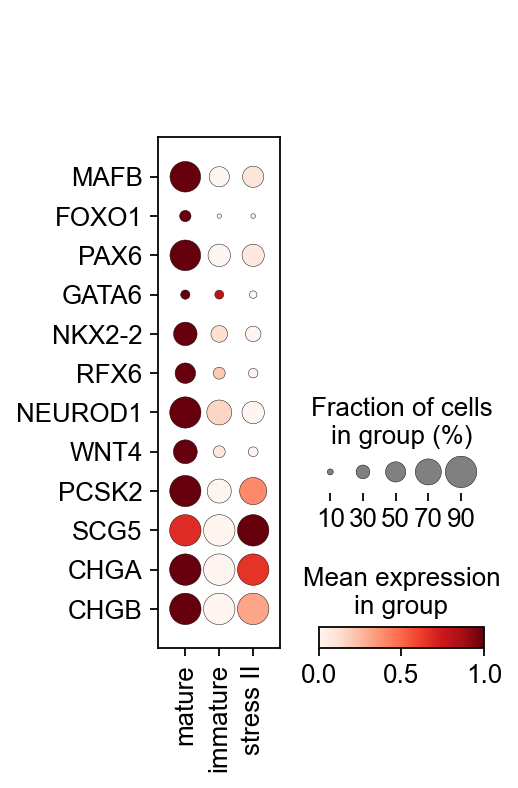

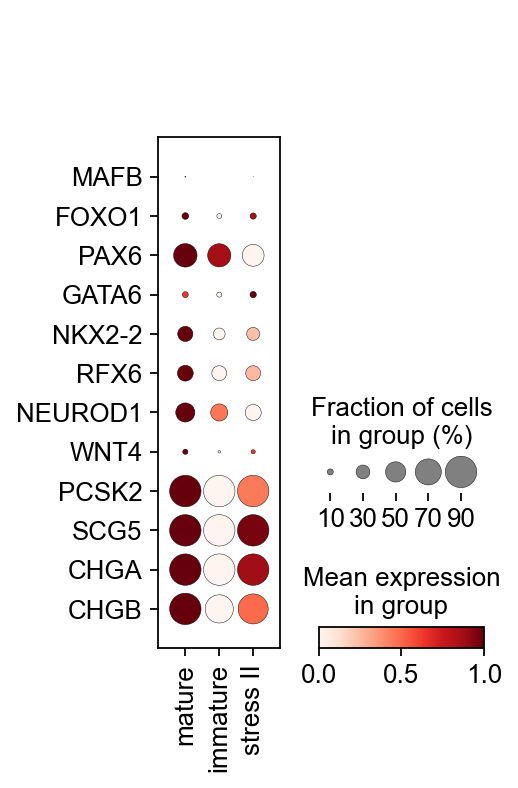

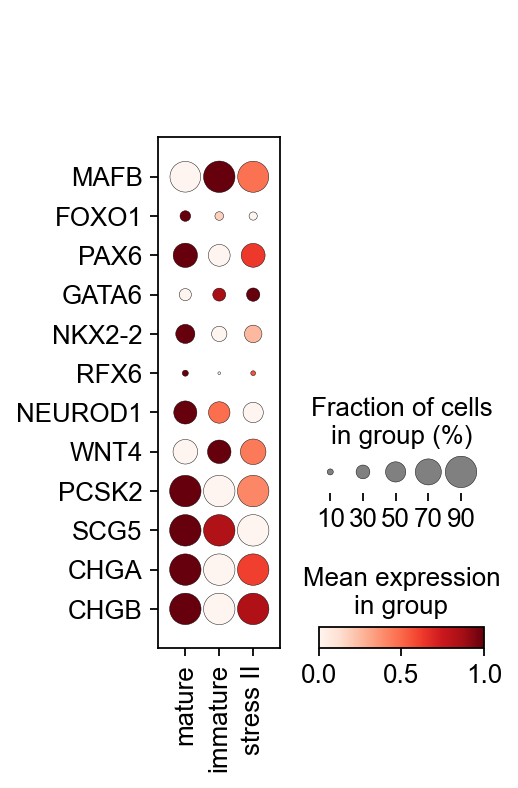

In [230]:
genes = ['MAFB', 'FOXO1', 'PAX6', 'GATA6', 'NKX2-2', 'RFX6', 'NEUROD1', 'WNT4', 'PCSK2', 'SCG5', 'CHGA', 'CHGB']
sc.pl.dotplot(human_comb_alpha_sub, groupby='louvain_anno_fine', var_names = genes, standard_scale='var', 
              var_group_rotation=0, dot_max=0.9, swap_axes=True)
sc.pl.dotplot(pig_comb_alpha, groupby='louvain_anno_fine', var_names = genes,
              standard_scale='var', var_group_rotation=0, dot_max=0.9, swap_axes=True)
sc.pl.dotplot(mouse_comb_alpha, groupby='louvain_anno_fine', var_names = genes, 
              standard_scale='var', var_group_rotation=0, dot_max=0.9, swap_axes=True)

#### Immaturity genes

In [231]:
gc_dict = {'developmental\nfactors': ['SOX4', 'NRG1', 'EPHB2',  'EPHB6', 'SPOCK1'],
            'growth factors/\nhormones': ['VEGFC', 'IGF2BP2', 'NPY'],
            'TGFB\nsignaling': ['TGFBR1', 'TGFBR2', 'TGFB1', 'SMAD3', 'SMAD5', 'SMAD7', 'SMAD9', 'SOCS3', 'ID1', 'ID2', 'ID3', 'TNC', 'MET', 'BMP2'],
            'other markers': ['SGK1', 'PHLDA1', 'PHLDA2'],}

In [232]:
genes = []
for k,v in gc_dict.items():
    genes = genes + v

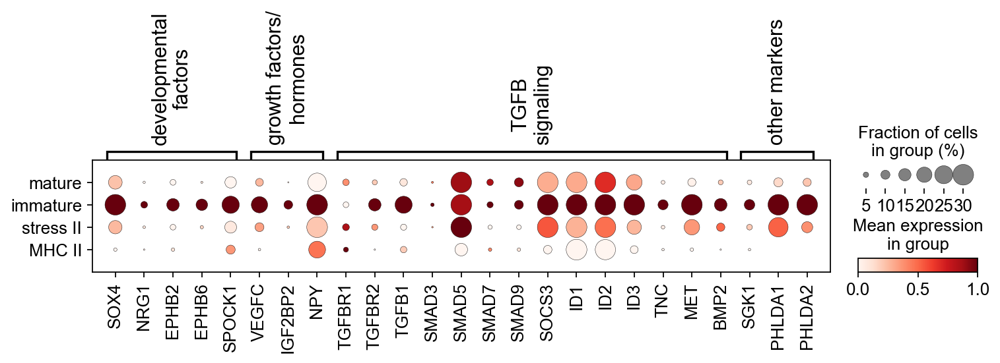

In [233]:
sc.pl.dotplot(human_comb_alpha, groupby='louvain_anno_fine', var_names = gc_dict, standard_scale='var', var_group_rotation=90, dot_max=0.3)

In [544]:
gc_dict = {'developmental\nfactors': ['SOX4', 'NRG1', 'EPHB2',  'EPHB6', 'SPOCK1'],
            'growth factors/\nhormones': ['VEGFC', 'IGF2BP2', 'NPY'],
            'TGFB\nsignaling': ['TGFBR1', 'TGFBR2', 'TGFB1', 'TGFB2', 'TGFB3', 'SMAD3', 'SMAD5', 'SMAD7', 'SMAD9', 'SOCS3', 'ID1', 'ID2', 'ID3', 'TNC', 'MET', 'BMP2'], 
                      'cell adhesion': ['ITGA2', 'ITGA6', 'ITGB6', 'LAMA3', 'LAMB3', 'LAMC1', 'LAMC2', 'FLRT2'],
           'cytokines': ['LIF', 'LIFR'],
           'interferone response': ['IFIT3', 'GBP2'],
}

In [545]:
genes = []
for k,v in gc_dict.items():
    genes = genes + v

In [546]:
human_comb_alpha_sub = human_comb_alpha[np.invert(human_comb_alpha.obs.louvain_anno_fine.isin(['MHC II']))].copy()

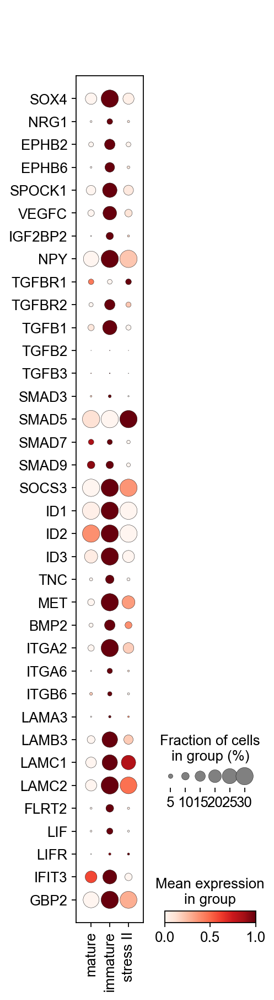

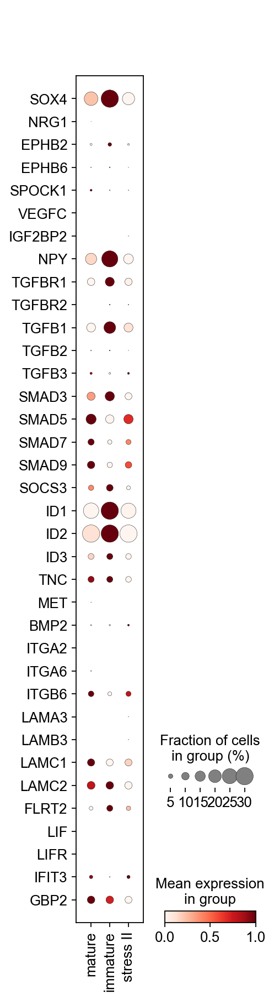

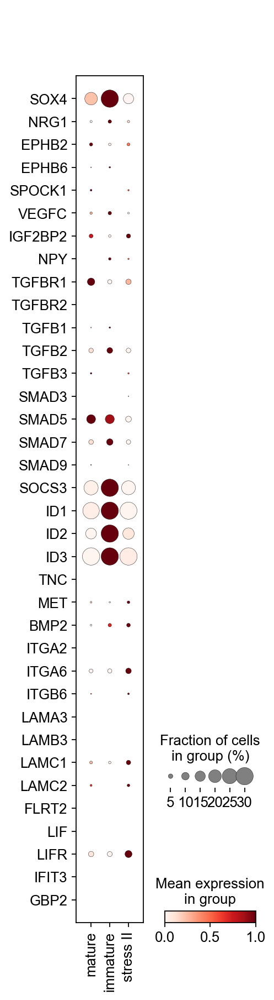

In [547]:
sc.pl.dotplot(human_comb_alpha_sub, groupby='louvain_anno_fine', var_names = genes, standard_scale='var', 
              var_group_rotation=0, dot_max=0.3, swap_axes=True)
sc.pl.dotplot(pig_comb_alpha, groupby='louvain_anno_fine', var_names = genes,
              standard_scale='var', var_group_rotation=0, dot_max=0.3, swap_axes=True)
sc.pl.dotplot(mouse_comb_alpha, groupby='louvain_anno_fine', var_names = genes, 
              standard_scale='var', var_group_rotation=0, dot_max=0.3, swap_axes=True)

#### Stress response genes

In [539]:
stress_dict = {'IRE': ['ERN1','TRAF2','MAP3K5'],
              'PERK': ['EIF2AK3','EIF2A','ATF4','DDIT3','PPP1R15A','PPP1CC'],
              'ATF6': ['ATF6','XBP1','HSPA5'], 
              'ATF3': ['ATF3'], 
              'ERAD': ['HERPUD1', 'SDF2L1', 'DERL2', 'SYVN1', 'EDEM1']}

In [540]:
stress_genes = []
for k,v in stress_dict.items():
    stress_genes = stress_genes+v

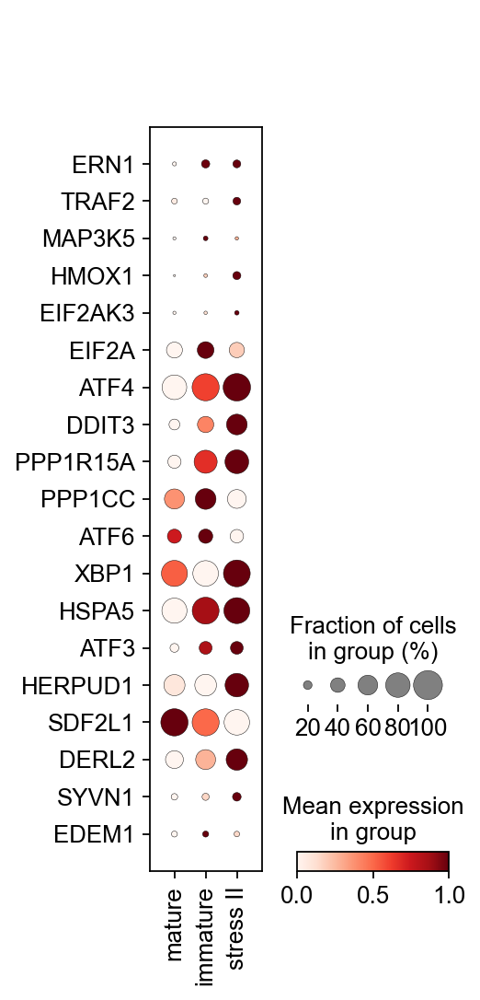

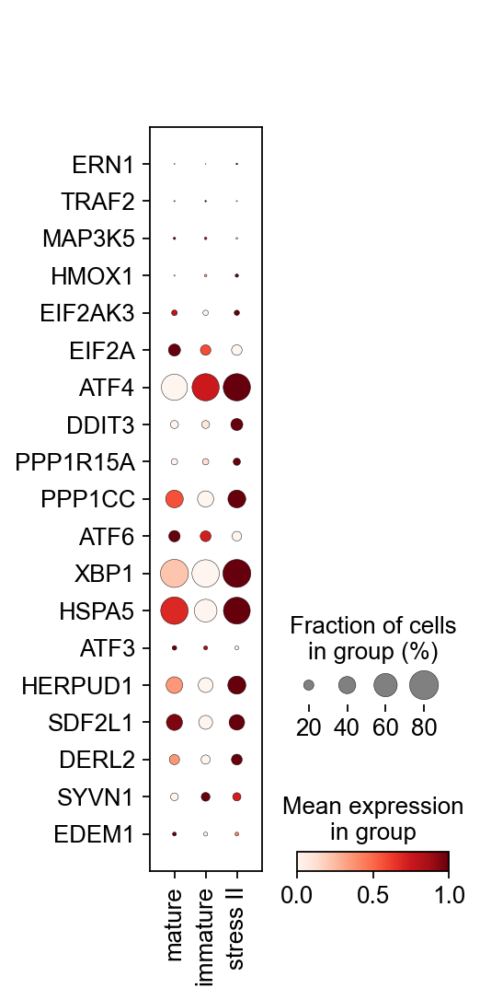

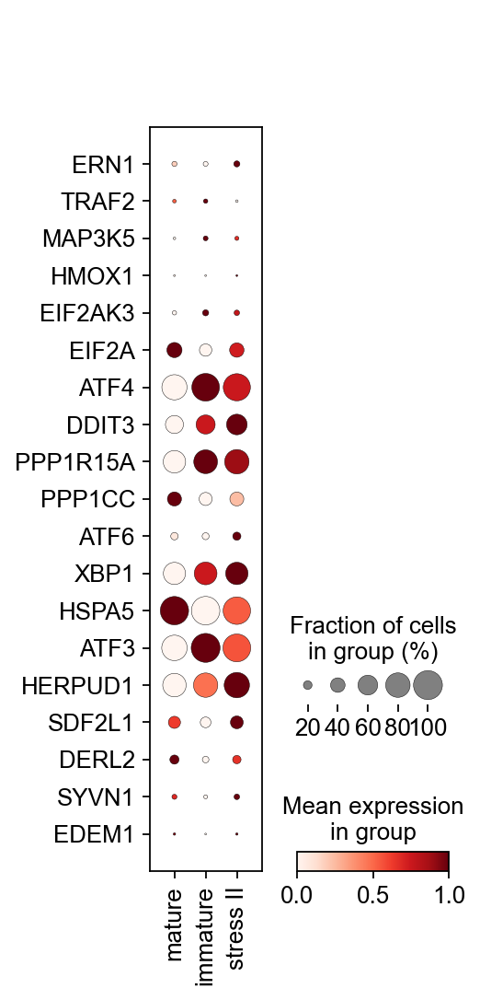

In [541]:
sc.pl.dotplot(human_comb_alpha_sub, groupby='louvain_anno_fine', var_names = stress_genes, standard_scale='var', 
              swap_axes=True)
sc.pl.dotplot(pig_comb_alpha, groupby='louvain_anno_fine', var_names = stress_genes,
              standard_scale='var', swap_axes=True)
sc.pl.dotplot(mouse_comb_alpha, groupby='louvain_anno_fine', var_names = stress_genes, 
              standard_scale='var', swap_axes=True)

### Correlation of alpha cell subtypes in PC space

In [440]:
adata_comb_alpha = sc.pp.scale(human_comb_alpha, copy=True).concatenate(sc.pp.scale(pig_comb_alpha, copy=True), sc.pp.scale(mouse_comb_alpha, copy=True), batch_categories=['human', 'pig', 'mouse'])

In [441]:
sc.pp.highly_variable_genes(adata_comb_alpha, n_top_genes=4000, flavor='cell_ranger')
sc.pp.pca(adata_comb_alpha)

In [488]:
adata_comb_alpha.obs['louvain_species'] = ['_'.join([a,b]) for a,b in zip(adata_comb_alpha.obs.batch, adata_comb_alpha.obs.louvain_anno_fine)]

In [446]:
%%time
genedf = sc.get.obs_df(
        adata_comb_alpha,
        keys=['louvain_species'],
        obsm_keys=[('X_pca', i) for i in range(0,50)] #if i not in [1]]
    )
grouped = genedf.groupby('louvain_species')
mean_df = grouped.mean()

CPU times: user 26.5 ms, sys: 10.5 ms, total: 37.1 ms
Wall time: 43.2 ms


In [447]:
df_corr = mean_df.T.corr(method='pearson')

In [467]:
human_comb_alpha.uns['louvain_anno_fine_colors']

array(['#fdb462', '#80b1d3', '#bebada', '#fb8072'], dtype=object)

In [449]:
adata_comb_alpha.obs['louvain_anno_fine'] = adata_comb_alpha.obs['louvain_anno_fine'].astype('category')

In [470]:
adata_comb_alpha.obs['louvain_anno_fine'].cat.reorder_categories(['mature', 'immature', 'stress II', 'MHC II'], inplace=True)

In [473]:
adata_comb_alpha.obs['batch'].cat.reorder_categories(['human', 'pig', 'mouse'], inplace=True)

#### clustering and heatmap

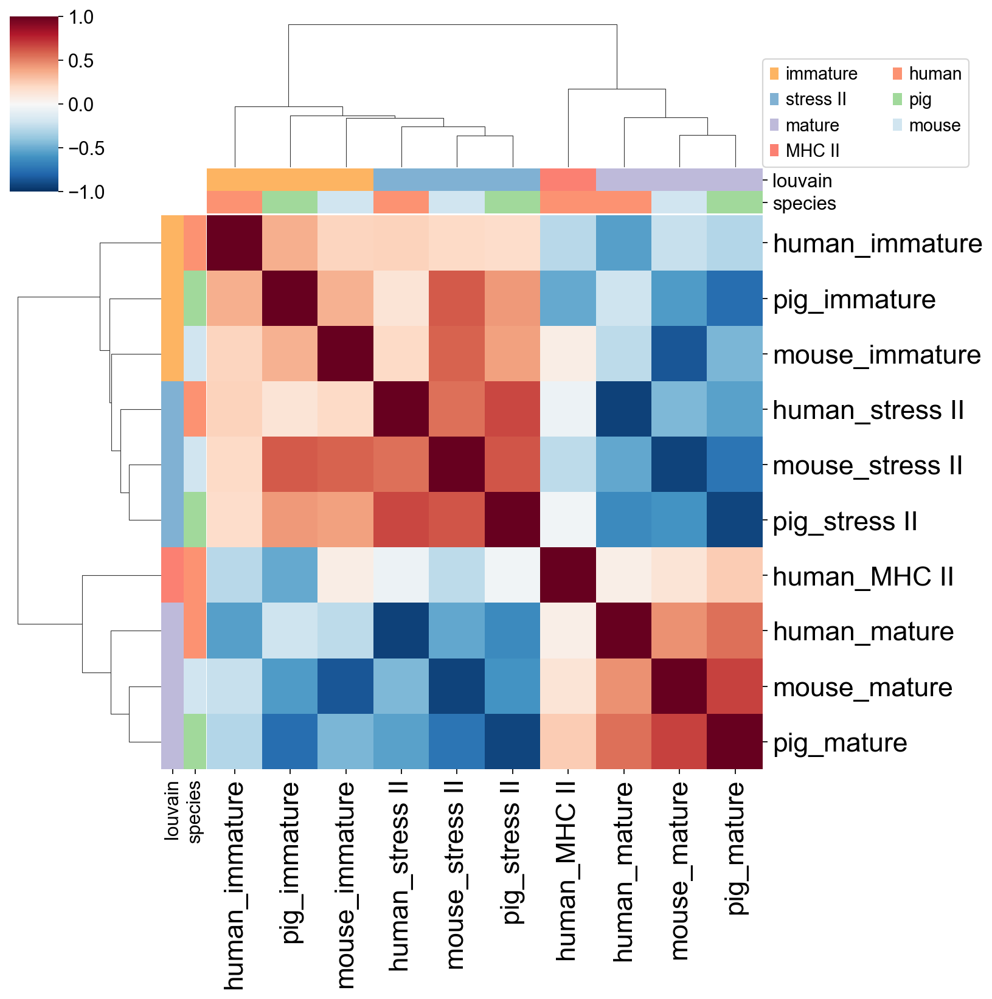

In [520]:
cols = pd.DataFrame(index = df_corr.index)
col_dict_1 = dict(zip(set(adata_comb_alpha.obs.louvain_anno_fine.cat.categories), ['#fdb462', '#80b1d3', '#bebada', '#fb8072']))
cols['louvain'] = pd.DataFrame([g.split('_',1)[1] for g in mean_df.index], index=df_corr.index)[0].map(col_dict_1)
col_dict_2 = dict(zip(set(adata_comb_alpha.obs.batch.cat.categories), ['#fc9272', '#a1d99b',  '#d1e5f0']))
cols['species'] = pd.DataFrame([g.split('_')[0] for g in mean_df.index], index=df_corr.index)[0].map(col_dict_2)




g = sns.clustermap(df_corr,#row_cluster=False,col_cluster=False,
               col_colors=cols,row_colors=cols, vmin=-1,vmax=1,
               cmap='RdBu_r')

for label in col_dict_1.keys():
    g.ax_col_dendrogram.bar(0, 0, color=col_dict_1[label],
                           label=label, linewidth=0)
for label in col_dict_2.keys():
    g.ax_col_dendrogram.bar(0, 0, color=col_dict_2[label],
                            label=label, linewidth=0)
    
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=20)

g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize=20)
g.ax_heatmap.set_xlabel('')
g.ax_heatmap.set_ylabel('')

g.ax_col_dendrogram.legend(loc=(1,0), ncol=2)

#### graph representation

In [489]:
sc.pp.neighbors(adata_comb_alpha)
sc.tl.paga(adata_comb_alpha, groups='louvain_species')

... storing 'louvain_species' as categorical


In [490]:
from scipy.sparse import csr_matrix

In [491]:
adata_comb_alpha.uns['paga']['connectivities'] = csr_matrix(df_corr.to_numpy().copy())

In [492]:
adata_comb_alpha.uns['paga']['connectivities_low_thr'] = csr_matrix(df_corr.to_numpy()+0.1)

In [493]:
pos = np.array([[ 1.62191405,  1.52937668],
       [ 1.23332803,  1.009166 ],
       [ 0.07928282,  1.48927375],
       [-0.2287415, -2.88148255],#h
       [- 0.24961311, -0.50232758],#m
       [-1.0590353, -2.26346964],#p
       [-2.62506038, -1.43752191],#h
       [-2.58476716, -0.2336543 ],
       [-3.2529614 , -0.68265099],
       [ 3.34791657, -1.03029484],#h
       [ 2.51190543, -0.50126031],
       [ 2.51983171, -1.55057058],
       [ 0.85409415, -2.26346964],#h
       [-1.745026  , -0.93045428],
       [-0.0287415 , -1.63648541],
       [-0.24350365,  0.58598068],#h
       [-1.47740348,  0.02772971],
       [ 1.24261767,  0.02772971]])

In [494]:
human_comb_alpha_g_scaled.uns['louvain_anno_fine_colors']

['#fdb462', '#80b1d3', '#bebada', '#fb8072', '#8dd3c7']

In [495]:
adata_comb_alpha.obs.louvain_species.cat.categories

Index(['human_MHC II', 'human_immature', 'human_mature', 'human_stress II',
       'mouse_immature', 'mouse_mature', 'mouse_stress II', 'pig_immature',
       'pig_mature', 'pig_stress II'],
      dtype='object')

In [498]:
adata_comb_alpha.uns['louvain_species_colors'] = ['#fb8072', '#80b1d3', '#fdb462', '#bebada', 
                                                  '#80b1d3', '#fdb462', '#bebada', '#80b1d3', '#fdb462', '#bebada']

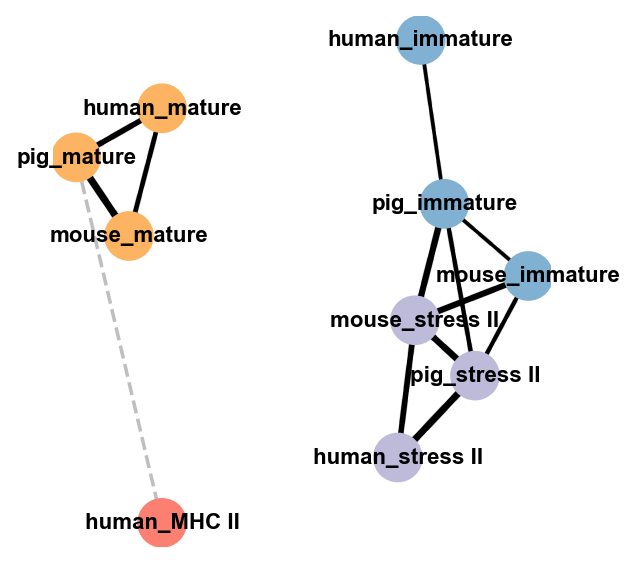

In [501]:
sc.pl.paga(adata_comb_alpha, threshold=0.35, edge_width_scale=0.6, fontsize=10, dashed_edges='connectivities_low_thr',
        node_size_power=0, node_size_scale=3)
 
          

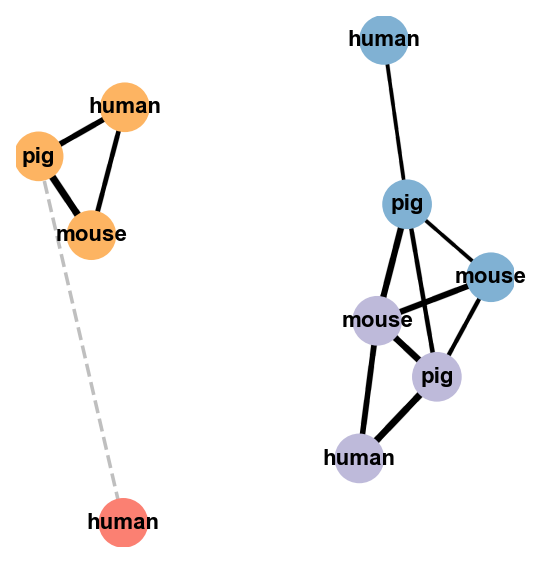

In [500]:
sc.pl.paga(adata_comb_alpha, threshold=0.35, edge_width_scale=0.6, fontsize=10, dashed_edges='connectivities_low_thr',
        node_size_power=0, node_size_scale=3, labels=['human', 'human', 'human', 'human', 'mouse',  'mouse',  'mouse', 'pig', 'pig', 'pig'])
 
          

### Conservation of gene set expression/

In [240]:
mk_human = pd.read_excel('./output_files/gene_sets_alpha.xlsx')
gene_sets_map = {}
for col in mk_human.columns:
    gene_sets_map[f'G{col}'] = [gene for gene in mk_human[col] if gene in conv.human_symbol.tolist()]

In [241]:
gs_dict = {'mature': ['G7', 'G8', 'G12', 'G13'],
           'immature': ['G3', 'G4', 'G2', 'G5'],
           'stress II': ['G1',  'G6']}

In [242]:
gene_sets_louvain = {}
for key in gs_dict.keys():
    genes = []
    for gs in gs_dict[key]:
        genes = genes + gene_sets_map[gs]
        
    gene_sets_louvain[key] = genes

In [243]:
tfs = pd.read_csv('./data/TF_names_v_1.01_human.txt',sep='\t',header=None).unstack().tolist()

In [244]:
gene_sets_tf = {}
for key in gene_sets_map.keys():
    gene_sets_tf[key] = [tf for tf in gene_sets_map[key] if tf in tfs]

In [245]:
gene_sets_tf_louvain = {}

for key in gs_dict.keys():
    tfs = []
    for gs in gs_dict[key]:
        tfs = tfs + gene_sets_tf[gs]
        
    gene_sets_tf_louvain[key]=tfs

In [579]:
expression_dict_beta_species={}

df = pd.DataFrame(index=human_comb_alpha_sub.var_names, columns=human_comb_alpha_sub.obs.louvain_anno_fine.cat.categories)
for key in human_comb_alpha_sub.obs.louvain_anno_fine.cat.categories:
    human_sub = human_comb_alpha_sub[human_comb_alpha_sub.obs.louvain_anno_fine.isin([key])].copy()
    genes = (human_sub.X > 0).sum(0) / human_sub.n_obs
    df[key] = genes.A1
expression_dict_beta_species['human'] = df

df = pd.DataFrame(index=pig_comb_alpha.var_names, columns=pig_comb_alpha.obs.louvain_anno_fine.cat.categories)
for key in pig_comb_alpha.obs.louvain_anno_fine.cat.categories:
    pig_sub = pig_comb_alpha[pig_comb_alpha.obs.louvain_anno_fine.isin([key])].copy()
    genes = (pig_sub.X > 0).sum(0) / pig_sub.n_obs
    df[key] = genes.A1
expression_dict_beta_species['pig'] = df 

df = pd.DataFrame(index=mouse_comb_alpha.var_names, columns=mouse_comb_alpha.obs.louvain_anno_fine.cat.categories)
for key in mouse_comb_alpha.obs.louvain_anno_fine.cat.categories:
    mouse_sub = mouse_comb_alpha[mouse_comb_alpha.obs.louvain_anno_fine.isin([key])].copy()
    genes = (mouse_sub.X > 0).sum(0) / mouse_sub.n_obs
    df[key] = genes.A1
expression_dict_beta_species['mouse'] = df

In [128]:
tfs_mapped = [tf for tf in tfs if tf in human_comb_alpha_sub.var_names]

In [248]:
gene_set_conservation_dict = {}

for key in ['mature', 'immature', 'stress II']:

    genes_human = gene_sets_louvain[key]
    df = pd.DataFrame(index=genes_human, columns=['mouse', 'pig'])  
    
    
    detected = expression_dict_beta_species['pig']>0.05
    detected = detected.index[detected.any(axis=1)].tolist()
    
    detected_key = expression_dict_beta_species['pig']>0.05
    detected_key = detected_key.index[detected_key[key]].tolist()
    
    df['pig'] = ['conserved' if gene in detected_key else
                 'loss' if gene in detected else
                 'not detected' for gene in genes_human]
    
    detected = expression_dict_beta_species['mouse']>0.05
    detected = detected.index[detected.any(axis=1)].tolist()
    
    detected_key = expression_dict_beta_species['mouse']>0.05
    detected_key = detected_key.index[detected_key[key]].tolist()
    
    df['mouse'] = ['conserved' if gene in detected_key else
                   'loss' if gene in detected else
                   'not detected' for gene in genes_human]
    
    gene_set_conservation_dict[key]=df


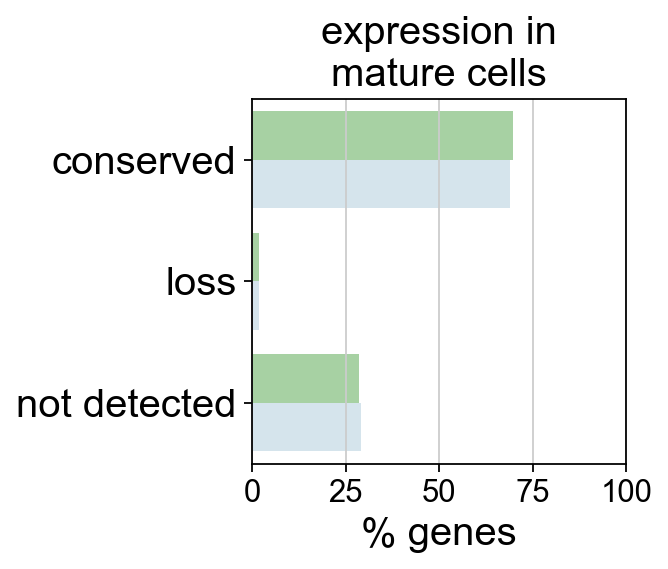

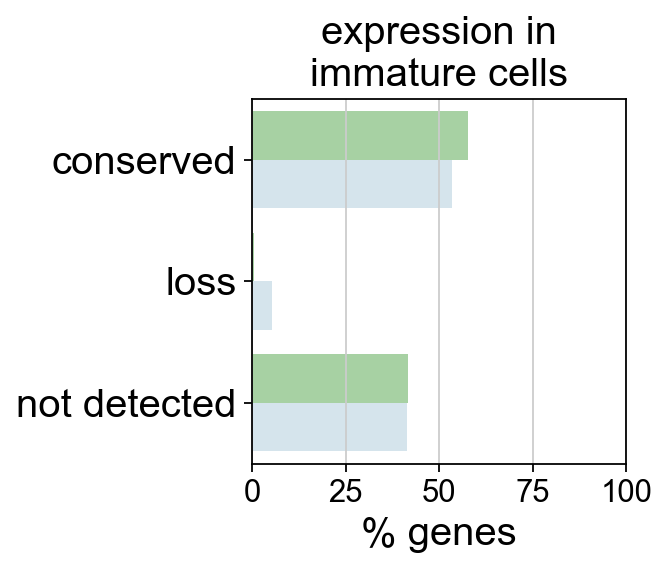

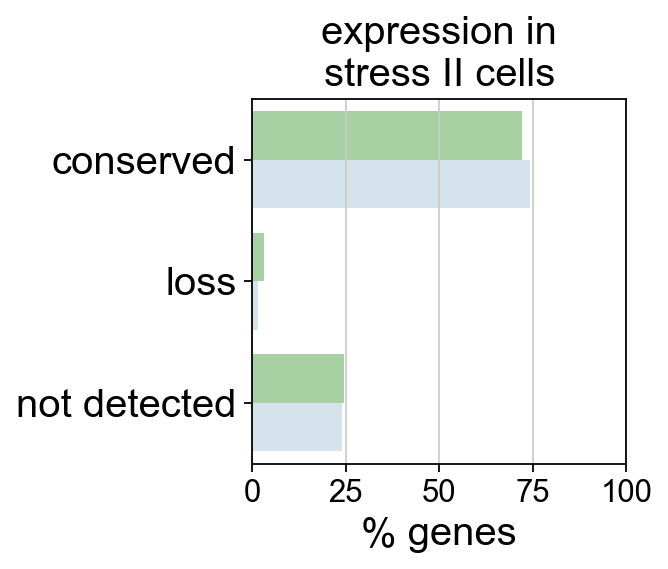

In [249]:
for key in ['mature', 'immature', 'stress II']:
    df_bar = gene_set_conservation_dict[key][['pig', 'mouse']].melt()

    f, ax = pl.subplots(figsize=(3, 3))
    y='% genes'
    prop_df = (df_bar['value']
                        .groupby(df_bar['variable'])
                        .value_counts(normalize=True)
                        .rename(y)
                        .reset_index())
    prop_df[y] = prop_df[y]*100

    sns.barplot(x=y, y="value", data=prop_df, hue='variable', order=['conserved', 'loss', 'not detected'], hue_order=['pig', 'mouse'], palette=['#a1d99b','#d1e5f0'])
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=18)
    #ax.set_xticklabels([0,20,40,60,80], fontsize=18)
    ax.legend().remove()
    pl.ylabel('')
    pl.xlabel('% genes', fontsize=18)
    pl.xlim([0,100])
    pl.title(f'expression in\n{key} cells', fontsize=18)

## Annotation of alpha and beta cell subpopulations in endocrine manifolds

In [303]:
pig_all = sc.read('../data/adata_pig_endo.h5ad')
pig_all.var_names = ['WNT4' if var in ['ENSSSCG00000003521'] else var for var in pig_all.var_names]

In [566]:
human_comb.obs['louvain_anno'] = ['_'.join(['beta', x]) for x in human_comb.obs.louvain_anno_fine]
human_comb_alpha.obs['louvain_anno'] = ['_'.join(['alpha', x]) for x in human_comb_alpha.obs.louvain_anno_fine]

In [567]:
human_comb_endo.obs['louvain_anno_fine'] = human_comb_endo.obs['louvain_anno_broad'].copy().tolist()

In [568]:
human_comb_endo.obs['louvain_anno_fine'].loc[human_comb.obs_names] = human_comb.obs['louvain_anno']
human_comb_endo.obs['louvain_anno_fine'].loc[human_comb_alpha.obs_names] = human_comb_alpha.obs['louvain_anno']

In [569]:
human_comb_endo.write('./human_endo_mapped.h5ad')

... storing 'louvain_anno_fine' as categorical


In [570]:
pig_comb.obs['louvain_anno'] = ['_'.join(['beta', x]) for x in pig_comb.obs.louvain_anno_fine]
pig_comb_alpha.obs['louvain_anno'] = ['_'.join(['alpha', x]) for x in pig_comb_alpha.obs.louvain_anno_fine]

In [571]:
pig_comb_endo.obs['louvain_anno_fine'] = pig_comb_endo.obs['louvain_anno_broad'].copy().tolist()

In [572]:
pig_comb_endo.obs['louvain_anno_fine'].loc[pig_comb.obs_names] = pig_comb.obs['louvain_anno']
pig_comb_endo.obs['louvain_anno_fine'].loc[pig_comb_alpha.obs_names] = pig_comb_alpha.obs['louvain_anno']

In [573]:
pig_comb_endo.write('./pig_endo_mapped.h5ad')

... storing 'louvain_anno_fine' as categorical


In [574]:
mouse_comb.obs['louvain_anno'] = ['_'.join(['beta', x]) for x in mouse_comb.obs.louvain_anno_fine]
mouse_comb_alpha.obs['louvain_anno'] = ['_'.join(['alpha', x]) for x in mouse_comb_alpha.obs.louvain_anno_fine]

In [575]:
mouse_comb_endo.obs['louvain_anno_fine'] = mouse_comb_endo.obs['louvain_anno_broad'].copy().tolist()

In [576]:
mouse_comb_endo.obs['louvain_anno_fine'].loc[mouse_comb.obs_names] = mouse_comb.obs['louvain_anno']
mouse_comb_endo.obs['louvain_anno_fine'].loc[mouse_comb_alpha.obs_names] = mouse_comb_alpha.obs['louvain_anno']

In [577]:
mouse_comb_endo.write('./mouse_endo_mapped.h5ad')

... storing 'louvain_anno_fine' as categorical


## Hormone receptor and ion channel expression  in mature endocrine cells

In [584]:
human_comb_endo_mat = human_comb_endo[human_comb_endo.obs.louvain_anno_fine.isin(['delta', 'beta_mature', 'alpha_mature', 'PP'])].copy()
pig_comb_endo_mat = pig_comb_endo[pig_comb_endo.obs.louvain_anno_fine.isin(['delta', 'beta_mature', 'alpha_mature', 'PP'])].copy()
mouse_comb_endo_mat = mouse_comb_endo[mouse_comb_endo.obs.louvain_anno_fine.isin(['delta', 'beta_mature', 'alpha_mature', 'PP'])].copy()

### Hormone receptors

In [657]:
hormone_receptors = {
    # adrenal gland
    '(nor)epinephrine' : ['ADRA1A', 'ADRA1B', 'ADRA1D', 'ADRA2A', 'ADRA2B', 'ADRA2C', 'ADRB1', 'ADRB2', 'ADRB3'],
    'dopamine' : ['DRD1', 'DRD2','DRD3', 'DRD4', 'DRD5'],
    
    #brain
    'gonadotrophin' : ['GNRHR1', 'GNRHR2'],
    'kisspeptin' : ['KISS1R'],
    'oxytocin' : ['OXTR'],
    'vasopressin' : ['AVPR1A', 'AVPR1B', 'AVPR2', 'CUL5', 'VACM1'],
    'corticotropin' : ['CRHR1'],
    'opioid':['OPRD1', 'OPRK1', 'OPRM1', 'OPRL1', 'OGFR'],
    'orexin' : ['HCRTR1', 'HCRTR2'],
    
    # pituitary gland
    'melanocortin' : ['MC1R', 'MC3R', 'MC4R', 'MC5R'],
    'ACTH' : ['MC2R'],
    'corticoid' : ['NR3C2', 'NR3C1'],
    'LH' :['LHCGR'], #luteinizing
    'FSH' : ['FSHR'], #follicle-stimulating
    'GH' : ['GHR'], #growth hormone
    'GH-releasing' : ['GHRHR'], #growth hormone-releasing
    'thyrotropin' : ['TSHR', 'TRHR'],
    
    # pineal gland 
    'melatonin' : ['MTNR1A', 'MTNR1B'],
    
    
    #ovaries
    'amh' : ['AMHR1', 'AMHR2'],
    'estrogen' : ['ESRRG', 'ESR1', 'ESRRA', 'ESR2'],
    'progesterone' : ['PGR'],
    'relaxin' : ['RXFP1', 'RXFP2', 'RXFP3', 'RXFP4'],
    
    #thyroid
    'thyroid' : ['THRA', 'THRB'],
    'calcitonin':['RAMP1', 'RAMP2', 'RAMP3', 'CALCR', 'CALCRL'],
    
    #parathyroid gland
    'parathyroid' : ['PTH1R', 'PTH2R'],
    
    #heart
    'natriuretic' : ['NPRL3', 'NPR3', 'NPR1', 'NPR2', 'NPRL2'],
    
    
    # liver
    'angiotensin' : ['AGTR1', 'ATGR2'],
    'hepcidin' : ['SLC40A1'],
    
    #kidney
    'epo' : ['EPOR'],
    'vitaminD ': ['VDR'],
    
    # intestinal
    'incretin' : ['GHSR', 'GIPR', 'GLP1R', 'GLP2R', 'SCTR', 'CCKAR', 'CCKBR', 'NPY1R', 'NPY2R', 'NPY5R'],
    'insl5/relaxin' : ['RXFP1', 'RXFP2', 'RXFP3', 'RXFP4'],
    'motilin' : ['MLNR'],
    'vip' : ['ADCYAP1R1', 'VIPR1', 'VIPR2'],
    'guanylin' : ['GUCY2C'],
    
    #pancreas
    'glucagon' : ['GCGR'],
    'ppy' : ['PPYR1'],
    'insulin' : ['INSR', 'INSRR', 'IGF1R', 'IGF2R', 'IGFLR1'],
    'somatostatin' : ['SSTR1', 'SSTR2', 'SSTR3', 'SSTR4', 'SSTR5'],
    
    #fat
    'adiponectin' : ['ADIPOR1', 'ADIPOR2'],
    'leptin' : ['LEPR'],
    
    #blood
    'leukotirene' : ['TBXA2R'],
    
    #bone
    'osteocalcin' : ['GPRC6A'],
    
    # mulitple
    'serotonin' : ['HTR1A', 'HTR1B', 'HTR1D', 'HTR1F', 'HTR2A', 'HTR2B', 'HTR2C' 'HTR3A', 'HTR3B', 'HTR3D', 'HTR3E', 'HTR4', 'HTR5A', 'HTR5B', 'HTR6', 'HTR7'],
    'galanin' : ['GALR1', 'GALR2', 'GALR3'],
    'prostanoid' : ['PTGER3', 'PTGFR', 'PTGER4', 'PTGDR2', 'PTGDR', 'PTGER2', 'PTGER1', 'PTGIR'],
    'prolactin' : ['PRLR'],
    'androgen' : ['AR'],
    'thrombopoietin' : ['MPL'],
    'RA' : ['RARA', 'RARB', 'RARG'],
    'endothelin' : ['EDNRB', 'EDNRA']}

In [658]:
receptors_sub={}
receptors_genes = []
for key in hormone_receptors.keys():
    genes = [gene for gene in hormone_receptors[key] if gene in human_comb_endo.var_names]

    if len(genes)>0:
        receptors_sub[key] = genes
        receptors_genes = receptors_genes + genes

#### Correlation of expression pattern

In [742]:
receptors_genes_det = [gene for gene in receptors_genes if np.any([
    np.any(expression_dict_species['human'].loc[gene]>0.05), 
    np.any(expression_dict_species['pig'].loc[gene]>0.05), 
    np.any(expression_dict_species['mouse'].loc[gene]>0.05)
])
]

In [768]:
df = pd.DataFrame(columns=['beta'])
df_p = pd.DataFrame(columns=['beta'])

for key in ['beta']:

    adata_dict = {
        'human': sc.pp.scale(human_comb_endo_mat[:, receptors_genes_det], zero_center=False, copy=True),
        'pig': sc.pp.scale(pig_comb_endo_mat[:, receptors_genes_det], zero_center=False, copy=True),
        'mouse': sc.pp.scale(mouse_comb_endo_mat[:, receptors_genes_det], zero_center=False, copy=True)
    }  
    
    mean_dict = {}
    for k, v in adata_dict.items():
        mean_dict[k] = sc.get.obs_df(
            v,
            keys=['louvain_anno_broad'] + receptors_genes_det
        ).groupby('louvain_anno_broad').mean().T.loc[receptors_genes_det]      
        
    frac_expressed_dict = {}
    for s in ['human', 'pig', 'mouse']:
        frac_expressed_dict[s] = expression_dict_species[s].loc[receptors_genes_det] / expression_dict_species[s].mean(axis=0)

    harmonic_avg = {}
    for s in ['human', 'pig', 'mouse']:
        print(s)        
        harmonic_avg[s] = mean_dict[s] * frac_expressed_dict[s]
               
        
    for i, combi in enumerate(itertools.combinations(['human', 'pig', 'mouse'], 2)):
        print('-'.join(combi))
        rho, p = pearsonr(harmonic_avg[combi[0]].values.flatten(), harmonic_avg[combi[1]].values.flatten())
        print('across cell types:', rho, p)
        
        df.loc[i, key] = rho
        df_p.loc[i, key] = round(p,4)

human
pig
mouse
human-pig
across cell types: 0.5444145475505827 1.3718689269565578e-15
human-mouse
across cell types: 0.09089837921421588 0.21976809215497464
pig-mouse
across cell types: 0.025406955710129124 0.7320925098412709


<AxesSubplot:>

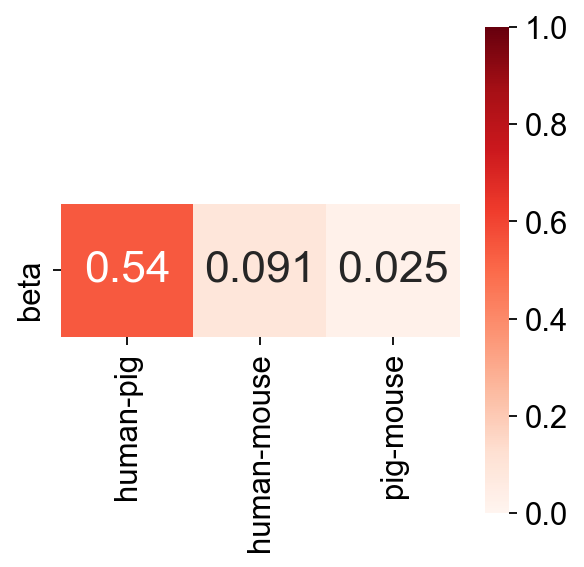

In [769]:
df.index = ['human-pig', 'human-mouse', 'pig-mouse']

sns.heatmap(df.apply(pd.to_numeric).T, vmin=0, vmax=1, cmap='Reds', annot=df.T, square=True, annot_kws={'fontsize':20})

#### Differentially expressed receptors

In [699]:
hormone_receptors_diff = {
    '(nor)epinephrine' : ['ADRB2'],    
    'kisspeptin' : ['KISS1R'],
    'oxytocin' : ['OXTR'],
    'GH' : ['GHR'], 
    'estrogen' : ['ESRRG', 'ESR1'],
    'progesterone' : ['PGR'],
    
    #thyroid
    'thyroid' : ['THRA', 'THRB'],
    'calcitonin':['RAMP1', 'RAMP2', 'RAMP3'],
    
    #heart
    'natriuretic' : ['NPR1', 'NPR2'],
    
    # liver
    'angiotensin' : ['AGTR1'],
    'hepcidin' : ['SLC40A1'],
    'vitaminD ': ['VDR'],
    
    # intestinal
    'incretin' : ['GHSR', 'GIPR', 'SCTR', 'CCKBR'],
    'vip' : ['VIPR1'],
    'guanylin' : ['GUCY2C'],
    
    #pancreas
    'insulin' : ['INSR', 'IGF1R', 'IGF2R'],
    'somatostatin' : ['SSTR2', 'SSTR5'],
    
    #fat
    'leptin' : ['LEPR'],
    
    # mulitple
    'prostanoid' : ['PTGER3', 'PTGER4', 'PTGFR',  'PTGDR'],
    'prolactin' : ['PRLR']
}

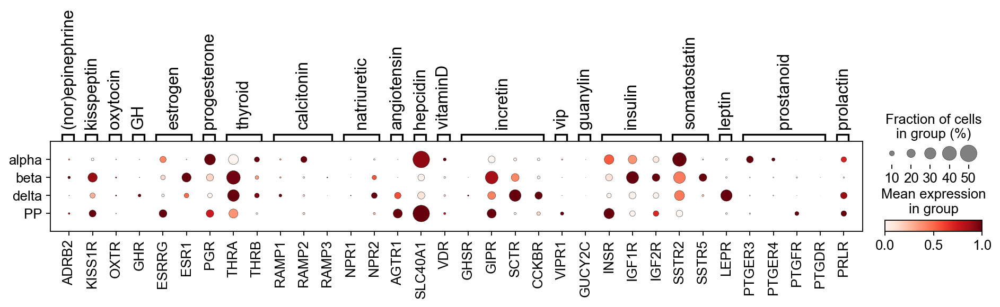

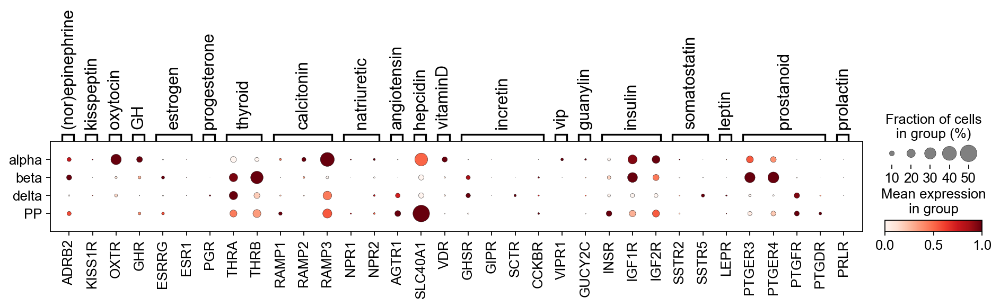

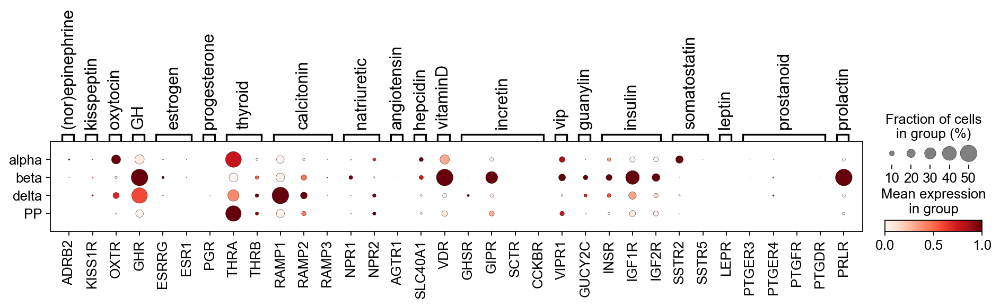

In [700]:
sc.pl.dotplot(human_comb_endo_mat, groupby='louvain_anno_broad', var_names=hormone_receptors_diff, dot_max=0.5, standard_scale='var')
sc.pl.dotplot(pig_comb_endo_mat, groupby='louvain_anno_broad', var_names=hormone_receptors_diff, dot_max=0.5, standard_scale='var')
sc.pl.dotplot(mouse_comb_endo_mat, groupby='louvain_anno_broad', var_names=hormone_receptors_diff, dot_max=0.5, standard_scale='var')

### Ion channels

In [720]:
ion_genes = [gene for gene in human_comb_endo_mat.var_names if (gene.startswith('CACN')) | (gene.startswith('KCN')) | (gene.startswith('SCN')) | (gene.startswith('TRPM'))]

In [739]:
ion_genes_det = [gene for gene in ion_genes if np.any([
    np.any(expression_dict_species['human'].loc[gene]>0.05), 
    np.any(expression_dict_species['pig'].loc[gene]>0.05), 
    np.any(expression_dict_species['mouse'].loc[gene]>0.05)
])
]

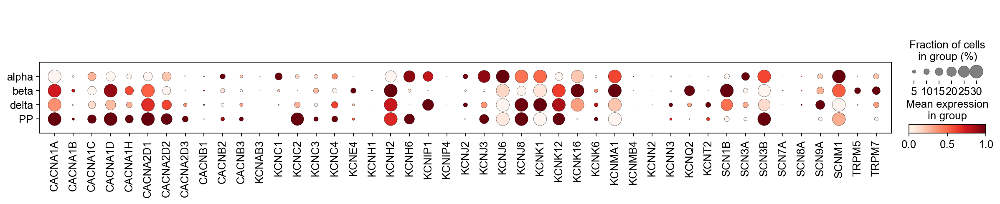

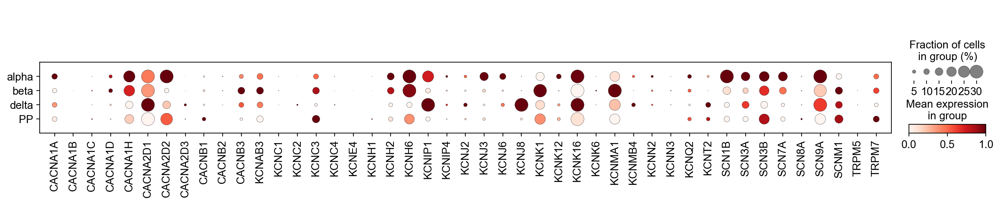

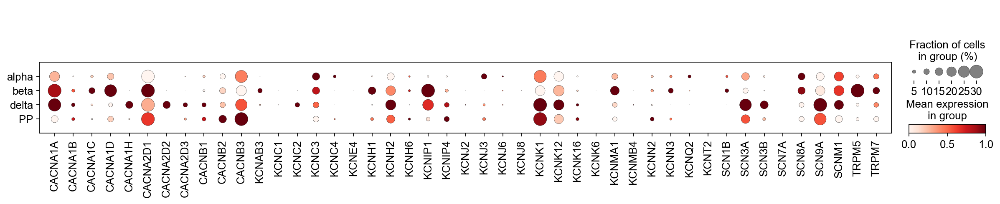

In [760]:
genes = sorted(ion_genes_det)
sc.pl.dotplot(human_comb_endo_mat, groupby='louvain_anno_broad', var_names=genes, dot_max=0.3, standard_scale='var')
sc.pl.dotplot(pig_comb_endo_mat, groupby='louvain_anno_broad', var_names=genes, dot_max=0.3, standard_scale='var')
sc.pl.dotplot(mouse_comb_endo_mat, groupby='louvain_anno_broad', var_names=genes, dot_max=0.3, standard_scale='var')

#### Correlation of expression pattern

In [763]:
df = pd.DataFrame(columns=['beta'])
df_p = pd.DataFrame(columns=['beta'])

for key in ['beta']:

    adata_dict = {
        'human': sc.pp.scale(human_comb_endo_mat[:, ion_genes_det], zero_center=False, copy=True),
        'pig': sc.pp.scale(pig_comb_endo_mat[:, ion_genes_det], zero_center=False, copy=True),
        'mouse': sc.pp.scale(mouse_comb_endo_mat[:, ion_genes_det], zero_center=False, copy=True)
    }  
    
    mean_dict = {}
    for k, v in adata_dict.items():
        mean_dict[k] = sc.get.obs_df(
            v,
            keys=['louvain_anno_broad'] + ion_genes_det
        ).groupby('louvain_anno_broad').mean().T.loc[ion_genes_det]      
        
    frac_expressed_dict = {}
    for s in ['human', 'pig', 'mouse']:
        frac_expressed_dict[s] = expression_dict_species[s].loc[ion_genes_det] / expression_dict_species[s].mean(axis=0)

    harmonic_avg = {}
    for s in ['human', 'pig', 'mouse']:
        print(s)        
        harmonic_avg[s] = mean_dict[s] * frac_expressed_dict[s]
               
        
    for i, combi in enumerate(itertools.combinations(['human', 'pig', 'mouse'], 2)):
        print('-'.join(combi))
        rho, p = pearsonr(harmonic_avg[combi[0]].values.flatten(), harmonic_avg[combi[1]].values.flatten())
        print('across cell types:', rho, p)
        
        df.loc[i, key] = rho
        df_p.loc[i, key] = round(p,4)

human
pig
mouse
human-pig
across cell types: 0.2594293016912814 0.0004368367852861731
human-mouse
across cell types: 0.09821978561065234 0.18960439681159813
pig-mouse
across cell types: 0.09422058432101754 0.20835708674462866


<AxesSubplot:>

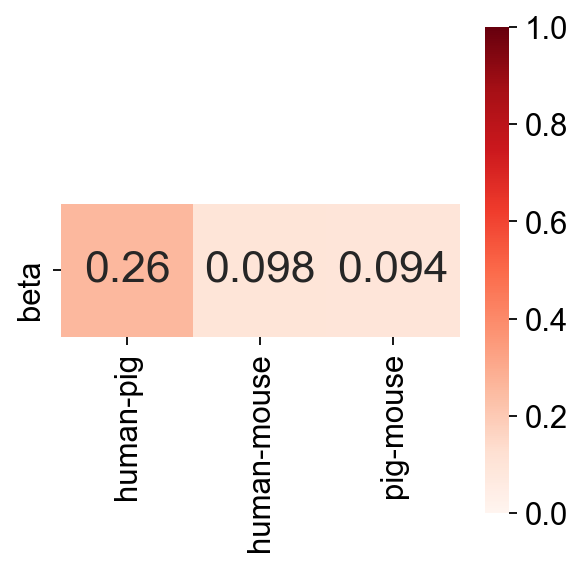

In [767]:
df.index = ['human-pig', 'human-mouse', 'pig-mouse']

sns.heatmap(df.apply(pd.to_numeric).T, vmin=0, vmax=1, cmap='Reds', annot=df.T, square=True, annot_kws={'fontsize':20})

#### Differentially expressed ion channels

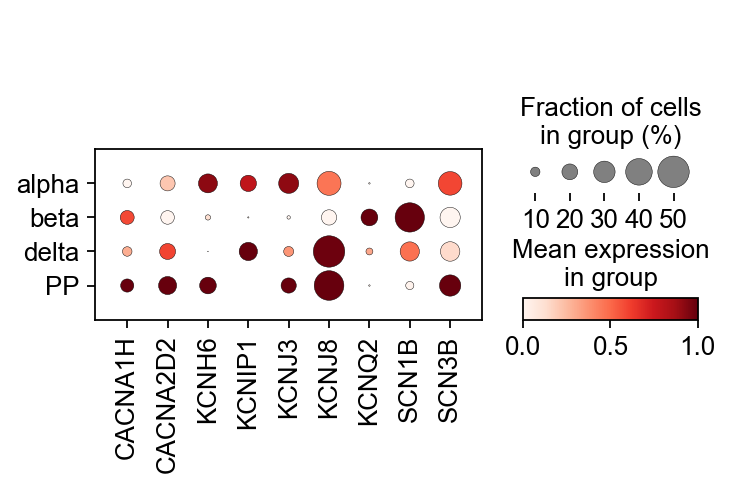

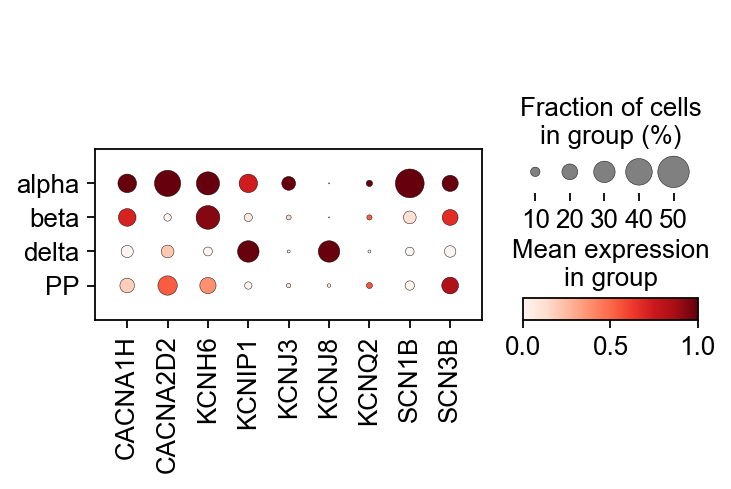

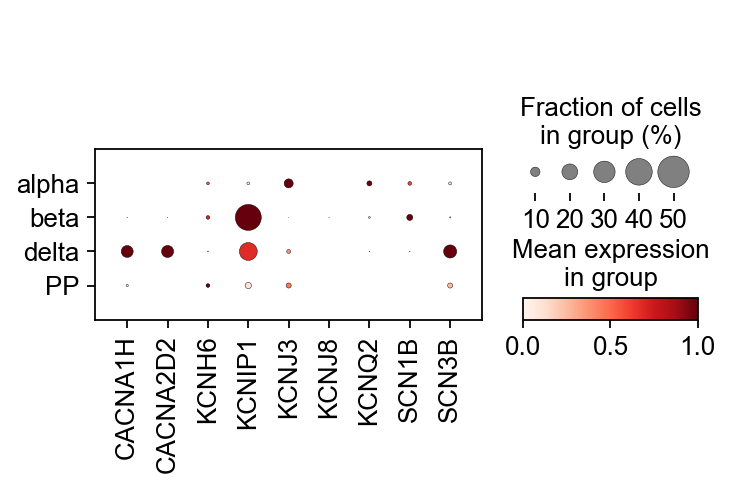

In [776]:
genes = ['CACNA1H', 'CACNA2D2', 'KCNH6', 'KCNIP1', 'KCNJ3', 'KCNJ8', 'KCNQ2', 'SCN1B', 'SCN3B']
sc.pl.dotplot(human_comb_endo_mat, groupby='louvain_anno_broad', var_names=genes, dot_max=0.5, standard_scale='var')
sc.pl.dotplot(pig_comb_endo_mat, groupby='louvain_anno_broad', var_names=genes, dot_max=0.5, standard_scale='var')
sc.pl.dotplot(mouse_comb_endo_mat, groupby='louvain_anno_broad', var_names=genes, dot_max=0.5, standard_scale='var')

### Validation in Benner et al

enriched in mouse in Benner et al. corresponding to mouse "gain"

In [778]:
df = pd.read_excel('./data/12864_2014_6324_MOESM9_ESM.xlsx', skiprows=3)

In [779]:
df['gene name'] = df['gene name'].str.upper()

In [780]:
len(df['gene name'])

1540

In [781]:
df = df.loc[[gene in human_comb_endo.var_names for gene in df['gene name']]]

In [782]:
len(df['gene name'])

883

In [690]:
df.loc[[gene in receptors_genes for gene in df['gene name']]].sort_values(by='enriched in')

,gene name,accession number,beta cells (RPKM),beta cells (RPKM).1,enrichment,status,enriched in,adj. p value
412,ESR1,XM_006512432,0.009561,12.009001,10.279740,unique,human,4.195275e-31
477,PGR,XM_006509848,0.011975,6.934371,9.165664,unique,human,1.337222e-27
508,SSTR2,NM_001042606,0.124502,24.547925,7.622137,unique,human,1.653651e-26
701,EPOR,XM_006509997,0.195086,13.405618,6.101856,unique,human,6.117281e-20
706,SCTR,XM_006529683,0.023279,12.347520,9.044813,unique,human,7.807637e-20
1236,LEPR,NM_001122899,0.000000,3.474107,15.084396,unique,human,7.955659e-11
1326,SSTR5,XM_006523947,0.054592,11.694895,7.740339,unique,human,5.712042e-10
1384,ADRB2,NM_007420,0.104884,2.521961,4.586364,unique,human,1.925028e-09
120,GHR,XM_006519963,73.266641,0.587563,6.962025,unique,mouse,2.706740e-84
172,VIPR1,XM_006512068,27.749028,0.341027,6.345991,unique,mouse,4.647190e-68


In [783]:
df.loc[[gene in ion_genes_det for gene in df['gene name']]].sort_values(by='enriched in')

,gene name,accession number,beta cells (RPKM),beta cells (RPKM).1,enrichment,status,enriched in,adj. p value
975,SCN3B,XM_006510234,0.446383,10.149161,4.506627,unique,human,2.633571e-14
1029,KCNE4,NM_021342,0.038638,7.165490,7.531208,unique,human,1.428763e-13
1450,CACNA2D2,XM_006511777,0.430808,34.848824,6.337591,unique,human,1.023888e-08
1474,KCNC4,XM_006502475,0.081123,5.703109,6.133738,unique,human,1.922448e-08
1494,KCNJ2,XM_006532319,0.098334,1.398008,3.828170,unique,human,3.271941e-08
1517,CACNA1H,XM_006524733,0.445975,40.551365,6.506324,unique,human,6.487751e-08
213,KCNIP1,XM_006514803,61.823973,1.234710,5.645807,enriched,mouse,6.428789e-56
427,CACNB3,XM_006520359,27.790175,1.594098,4.123678,enriched,mouse,5.012447e-30
712,KCNAB3,NM_010599,6.777216,0.505801,3.743788,unique,mouse,1.370144e-19
